# Import libraries

In [ ]:
import os
import zipfile
import warnings

import pandas as pd
import numpy as np
from kaggle.api.kaggle_api_extended import KaggleApi
from feature_engine.variable_handling import (
    find_categorical_variables,
    find_numerical_variables,
)
from feature_engine.imputation import MeanMedianImputer
from sklearn.pipeline import Pipeline

from kvbiii_ml.data_processing.eda.data_analysis import DataAnalyzer
from kvbiii_ml.data_processing.feature_engineering.case_normalizer import CaseNormalizer
from kvbiii_ml.data_processing.feature_engineering.categorical_aligner import CategoricalAligner
from kvbiii_ml.data_processing.feature_engineering.numerical_downcaster import NumericalDowncaster

from kvbiii_plots.eda.categorical_plots import CategoricalPlots
from kvbiii_plots.eda.continuous_plots import ContinuousPlots

warnings.filterwarnings("ignore", category=UserWarning, message="Could not infer format")

data_analyzer = DataAnalyzer()
categorical_plots = CategoricalPlots()
continuous_plots = ContinuousPlots()

SEED = 17
PROBLEM_TYPE = "regression"

# Load dataset

In [2]:
def load_data(
    competition_name: str, folder_name: str = "data"
) -> tuple[pd.DataFrame, pd.DataFrame]:
    """
    Load data from Kaggle competition. If data is already downloaded, it loads from local folder.

    Args:
        competition_name (str): Name of the Kaggle competition.
        folder_name (str): Local folder to store/load data.

    Returns:
        tuple[pd.DataFrame, pd.DataFrame]: Train and test dataframes.
    """
    train_csv = os.path.join(folder_name, "train.csv")
    test_csv = os.path.join(folder_name, "test.csv")
    if os.path.exists(train_csv) and os.path.exists(test_csv):
        train = pd.read_csv(train_csv, index_col="Id")
        test = pd.read_csv(test_csv, index_col="Id")
    else:
        api = KaggleApi()
        api.authenticate()
        os.makedirs(folder_name, exist_ok=True)
        api.competition_download_files(competition_name, path=folder_name)
        zip_file = os.path.join(folder_name, competition_name.split("/")[-1] + ".zip")
        with zipfile.ZipFile(zip_file) as z:
            z.extractall(folder_name)
        train = pd.read_csv(train_csv, index_col="Id")
        test = pd.read_csv(test_csv, index_col="Id")
        os.remove(zip_file)
    return train, test


COMPETITION_NAME = "house-prices-advanced-regression-techniques"
train, test = load_data(competition_name=COMPETITION_NAME)
# train = train.sample(1000, random_state=SEED).reset_index(drop=True)
TARGET_FEATURE, train_data, test_data = "SalePrice", train, test
train_data

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500


In [3]:
data_analyzer.base_information(train_data)

,Feature,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
0,MSSubClass,int64,0,0.00%,15,"1,460"
1,MSZoning,str,0,0.00%,5,"1,460"
2,LotFrontage,float64,259,17.74%,110,"1,201"
3,LotArea,int64,0,0.00%,"1,073","1,460"
4,Street,str,0,0.00%,2,"1,460"
5,Alley,str,"1,369",93.77%,2,91
6,LotShape,str,0,0.00%,4,"1,460"
7,LandContour,str,0,0.00%,4,"1,460"
8,Utilities,str,0,0.00%,2,"1,460"
9,LotConfig,str,0,0.00%,5,"1,460"


In [4]:
data_analyzer.base_information(test_data)

,Feature,dtypes,Number of missing values,Percentage of missing values,Unique values,Count
0,MSSubClass,int64,0,0.00%,16,"1,459"
1,MSZoning,str,4,0.27%,5,"1,455"
2,LotFrontage,float64,227,15.56%,115,"1,232"
3,LotArea,int64,0,0.00%,"1,106","1,459"
4,Street,str,0,0.00%,2,"1,459"
5,Alley,str,"1,352",92.67%,2,107
6,LotShape,str,0,0.00%,4,"1,459"
7,LandContour,str,0,0.00%,4,"1,459"
8,Utilities,str,2,0.14%,1,"1,457"
9,LotConfig,str,0,0.00%,5,"1,459"


## Duplicates

In [5]:
print(f"Number of duplicated rows: {train_data.duplicated().sum()}")
train_data = train_data.drop_duplicates(keep="last").reset_index(drop=True)
print(f"Number of duplicated rows after removal: {train_data.duplicated().sum()}")

Number of duplicated rows: 0
Number of duplicated rows after removal: 0


# Missing values

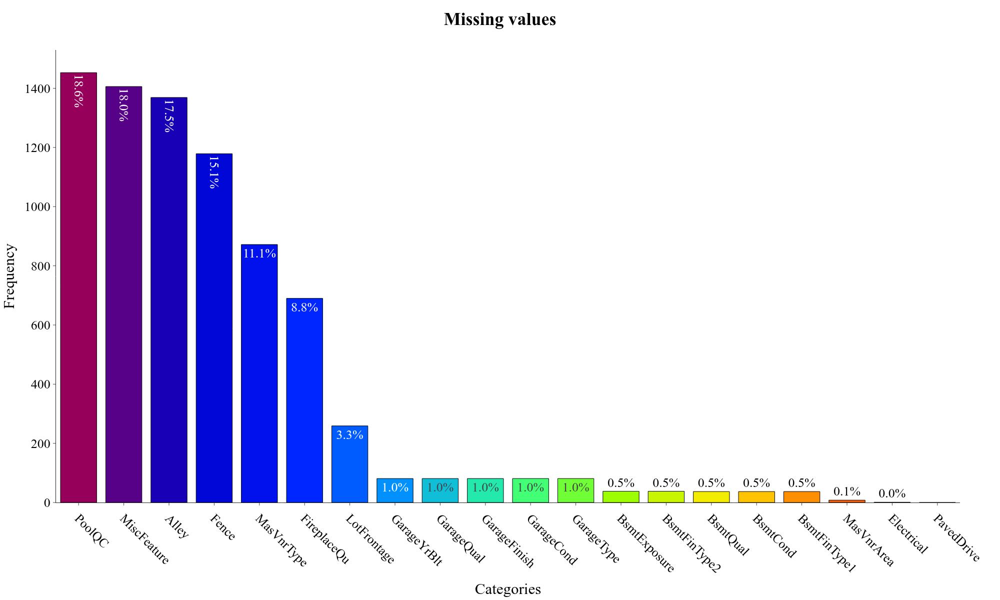

In [6]:
categorical_plots.barplot(train_data.isna().sum(), plot_title="Missing values", top_n=20, show_other=False, tickangle=45, width=2000, height=1200)

# Features exploration

In [7]:
train_data.columns = [ feature.upper().replace(" ", "_") for feature in train_data.columns ]
test_data.columns = [feature.upper().replace(" ", "_") for feature in test_data.columns]
features = train_data.columns.tolist()
features = [ (feature.upper().replace(" ", "_"), train_data[feature].dtype) for feature in features ]
TARGET_FEATURE = TARGET_FEATURE.upper().replace(" ", "_")
data = train_data
for feature, dtype in features:
    print(f"- {feature} ({dtype})")

- MSSUBCLASS (int64)
- MSZONING (str)
- LOTFRONTAGE (float64)
- LOTAREA (int64)
- STREET (str)
- ALLEY (str)
- LOTSHAPE (str)
- LANDCONTOUR (str)
- UTILITIES (str)
- LOTCONFIG (str)
- LANDSLOPE (str)
- NEIGHBORHOOD (str)
- CONDITION1 (str)
- CONDITION2 (str)
- BLDGTYPE (str)
- HOUSESTYLE (str)
- OVERALLQUAL (int64)
- OVERALLCOND (int64)
- YEARBUILT (int64)
- YEARREMODADD (int64)
- ROOFSTYLE (str)
- ROOFMATL (str)
- EXTERIOR1ST (str)
- EXTERIOR2ND (str)
- MASVNRTYPE (str)
- MASVNRAREA (float64)
- EXTERQUAL (str)
- EXTERCOND (str)
- FOUNDATION (str)
- BSMTQUAL (str)
- BSMTCOND (str)
- BSMTEXPOSURE (str)
- BSMTFINTYPE1 (str)
- BSMTFINSF1 (int64)
- BSMTFINTYPE2 (str)
- BSMTFINSF2 (int64)
- BSMTUNFSF (int64)
- TOTALBSMTSF (int64)
- HEATING (str)
- HEATINGQC (str)
- CENTRALAIR (str)
- ELECTRICAL (str)
- 1STFLRSF (int64)
- 2NDFLRSF (int64)
- LOWQUALFINSF (int64)
- GRLIVAREA (int64)
- BSMTFULLBATH (int64)
- BSMTHALFBATH (int64)
- FULLBATH (int64)
- HALFBATH (int64)
- BEDROOMABVGR (int64)
- KIT

## Features Documentation


- `MSSUBCLASS` (int64): Identifies the building class/type of dwelling involved in the sale (e.g., 1-story, 2-story, split-level), encoded as a numeric code.
- `MSZONING` (str): The general zoning classification of the sale (e.g., residential low density, commercial).
- `LOTFRONTAGE` (float64): Linear feet of street connected to the property.
- `LOTAREA` (int64): Lot size in square feet.
- `STREET` (str): Type of road access to the property (paved or gravel).
- `ALLEY` (str): Type of alley access to the property, if any.
- `LOTSHAPE` (str): General shape of the property (regular vs. varying degrees of irregularity).
- `LANDCONTOUR` (str): Flatness of the property (level, banked, hillside, depression).
- `UTILITIES` (str): Type of utilities available (all public, or partial).
- `LOTCONFIG` (str): Lot configuration (inside lot, corner lot, cul-de-sac, etc.).
- `LANDSLOPE` (str): Slope of the property (gentle, moderate, severe).
- `NEIGHBORHOOD` (str): Physical location (neighborhood) within Ames city limits.
- `CONDITION1` (str): Proximity to various conditions (e.g., arterial street, railroad, park).
- `CONDITION2` (str): Proximity to a second condition, if more than one is present.
- `BLDGTYPE` (str): Type of dwelling (single-family, duplex, townhouse, etc.).
- `HOUSESTYLE` (str): Style of dwelling (one-story, two-story, split-level, etc.).
- `OVERALLQUAL` (int64): Overall material and finish quality of the house, rated 1 (very poor) to 10 (very excellent).
- `OVERALLCOND` (int64): Overall condition rating of the house, rated 1 (very poor) to 10 (very excellent).
- `YEARBUILT` (int64): Original construction year of the house.
- `YEARREMODADD` (int64): Year of remodel/addition (same as construction year if no remodeling or additions).
- `ROOFSTYLE` (str): Type of roof (gable, hip, flat, etc.).
- `ROOFMATL` (str): Roof material (standard shingle, wood shingles, membrane, etc.).
- `EXTERIOR1ST` (str): Primary exterior covering material on the house.
- `EXTERIOR2ND` (str): Secondary exterior covering material, if more than one material is used.
- `MASVNRTYPE` (str): Masonry veneer type (brick, stone, none).
- `MASVNRAREA` (float64): Masonry veneer area in square feet.
- `EXTERQUAL` (str): Quality of the exterior material.
- `EXTERCOND` (str): Present condition of the exterior material.
- `FOUNDATION` (str): Type of foundation (poured concrete, cinder block, etc.).
- `BSMTQUAL` (str): Height/quality of the basement.
- `BSMTCOND` (str): General condition of the basement.
- `BSMTEXPOSURE` (str): Walkout or garden-level basement wall exposure.
- `BSMTFINTYPE1` (str): Quality/rating of the primary finished basement area.
- `BSMTFINSF1` (int64): Square footage of the primary finished basement area (type 1).
- `BSMTFINTYPE2` (str): Quality/rating of the secondary finished basement area, if present.
- `BSMTFINSF2` (int64): Square footage of the secondary finished basement area (type 2).
- `BSMTUNFSF` (int64): Square footage of unfinished basement area.
- `TOTALBSMTSF` (int64): Total square footage of the basement area.
- `HEATING` (str): Type of heating system.
- `HEATINGQC` (str): Heating quality and condition.
- `CENTRALAIR` (str): Whether the house has central air conditioning (yes/no).
- `ELECTRICAL` (str): Electrical system type.
- `1STFLRSF` (int64): First floor square footage.
- `2NDFLRSF` (int64): Second floor square footage.
- `LOWQUALFINSF` (int64): Low quality finished square footage across all floors.
- `GRLIVAREA` (int64): Above-grade (ground) living area square footage.
- `BSMTFULLBATH` (int64): Number of full bathrooms in the basement.
- `BSMTHALFBATH` (int64): Number of half bathrooms in the basement.
- `FULLBATH` (int64): Number of full bathrooms above grade.
- `HALFBATH` (int64): Number of half bathrooms above grade.
- `BEDROOMABVGR` (int64): Number of bedrooms above grade (excludes basement bedrooms).
- `KITCHENABVGR` (int64): Number of kitchens above grade.
- `KITCHENQUAL` (str): Kitchen quality rating.
- `TOTRMSABVGRD` (int64): Total rooms above grade (excludes bathrooms).
- `FUNCTIONAL` (str): Home functionality rating (typical, or various levels of deductions).
- `FIREPLACES` (int64): Number of fireplaces.
- `FIREPLACEQU` (str): Fireplace quality.
- `GARAGETYPE` (str): Garage location/type (attached, detached, built-in, etc.).
- `GARAGEYRBLT` (float64): Year the garage was built.
- `GARAGEFINISH` (str): Interior finish quality of the garage.
- `GARAGECARS` (int64): Size of garage in car capacity.
- `GARAGEAREA` (int64): Size of garage in square feet.
- `GARAGEQUAL` (str): Garage quality rating.
- `GARAGECOND` (str): Garage condition rating.
- `PAVEDDRIVE` (str): Whether the driveway is paved.
- `WOODDECKSF` (int64): Wood deck area in square feet.
- `OPENPORCHSF` (int64): Open porch area in square feet.
- `ENCLOSEDPORCH` (int64): Enclosed porch area in square feet.
- `3SSNPORCH` (int64): Three-season porch area in square feet.
- `SCREENPORCH` (int64): Screen porch area in square feet.
- `POOLAREA` (int64): Pool area in square feet.
- `POOLQC` (str): Pool quality rating.
- `FENCE` (str): Fence quality rating.
- `MISCFEATURE` (str): Miscellaneous feature not covered in other categories (e.g., shed, tennis court).
- `MISCVAL` (int64): Dollar value of the miscellaneous feature.
- `MOSOLD` (int64): Month the house was sold.
- `YRSOLD` (int64): Year the house was sold.
- `SALETYPE` (str): Type of sale (warranty deed, new construction, court officer deed, etc.).
- `SALECONDITION` (str): Condition of sale (normal, abnormal, partial, family, etc.).
- `SALEPRICE` (int64): Sale price of the house in US dollars — the target variable to predict.

# Feature Visualization

## Individual Feature Analysis

## `SALEPRICE`

`SALEPRICE` (int64) - Sale price of the house in US dollars — the target variable to predict.

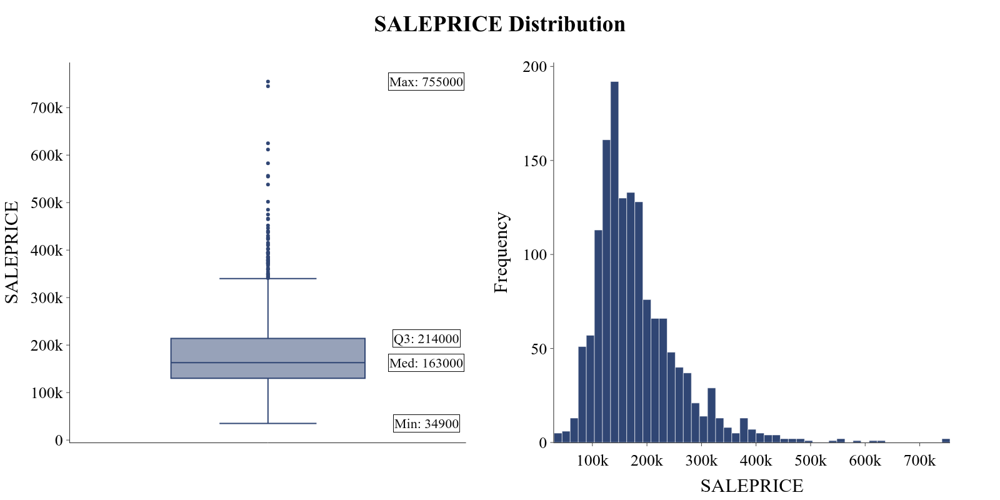

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
SALEPRICE,"1,460","180,921.20","79,442.50","34,900.00","88,000.00","129,975.00","163,000.00","214,000.00","326,100.00","755,000.00","6,311,111,264.30",1.88,6.54,0,0.00%


In [8]:
feature = TARGET_FEATURE
continuous_plots.histogram_and_box_plot(data[feature], plot_title=f"{feature} Distribution")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.883, kurtosis=6.536), with median 163,000 vs. mean 180,921 and range [34,900, 755,000].
- No missing values; 61 IQR-based outliers (4.18%, bounds [3,937.5, 340,037.5]).
- As the regression target, its right tail (61 outliers above 340,038) will disproportionately influence MSE-based loss during training.

**Conclusion:**

- Right-skewed target (skew=1.883) with a heavy tail above 340,038 means a log1p transform for modeling would even out the error weighting across cheap and expensive homes in an MSE-based GBM objective, instead of letting the highest-priced outliers dominate the loss.

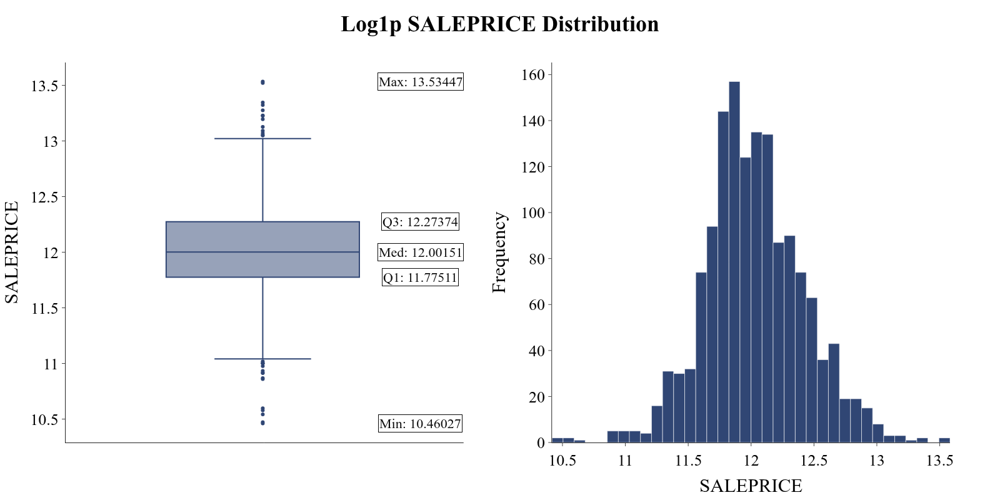

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
SALEPRICE,"1,460",12.02,0.40,10.46,11.39,11.78,12.00,12.27,12.69,13.53,0.16,0.12,0.81,0,0.00%


In [9]:
train_data[TARGET_FEATURE] = np.log1p(train_data[TARGET_FEATURE])

continuous_plots.histogram_and_box_plot(data[feature], plot_title=f"Log1p {feature} Distribution")
data_analyzer.describe_numerical_feature(data, feature)

## `MSSUBCLASS`

`MSSUBCLASS` (int64) - Identifies the building class/type of dwelling involved in the sale (e.g., 1-story, 2-story, split-level), encoded as a numeric code.

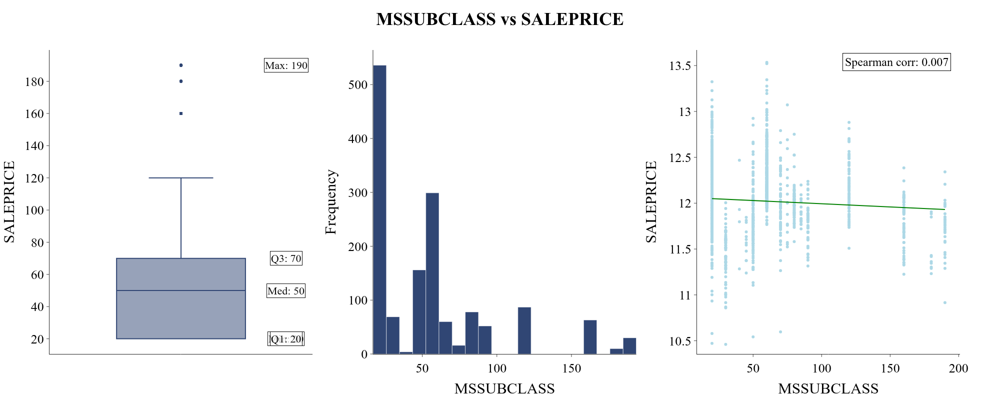

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
MSSUBCLASS,"1,460",56.90,42.30,20.00,20.00,20.00,50.00,70.00,160.00,190.00,"1,789.34",1.41,1.58,0,0.00%


In [10]:
feature = "MSSUBCLASS"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.408, kurtosis=1.58), with median 50 vs. mean 57 and range [20, 190].
- No missing values; 103 IQR-based outliers (7.05%, bounds [-55.0, 145.0]).
- Negligible positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.007, Pearson r=-0.074).

**Conclusion:**

- Notable outlier share (7.05%, bounds [-55.0, 145.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `MSZONING`

`MSZONING` (str) - The general zoning classification of the sale (e.g., residential low density, commercial).

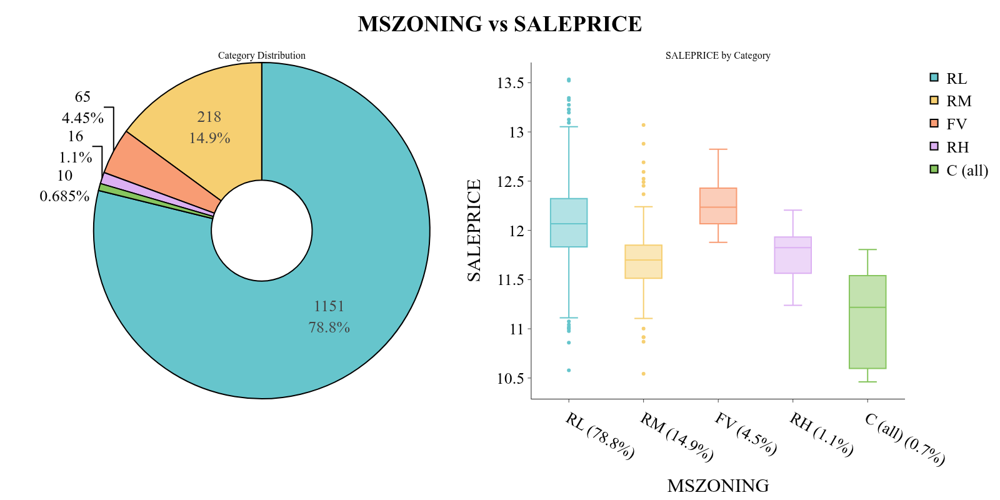

,Category,Count,Percentage (%)
0,RL,"1,151",78.84%
1,RM,218,14.93%
2,FV,65,4.45%
3,RH,16,1.10%
4,C (all),10,0.68%


In [11]:
feature = "MSZONING"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: RL (78.84%), RM (14.93%), FV (4.45%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.100 for 'C (all)' to 12.200 for 'FV', vs. an overall mean of 12.000.

**Conclusion:**

- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `LOTFRONTAGE`

`LOTFRONTAGE` (float64) - Linear feet of street connected to the property.

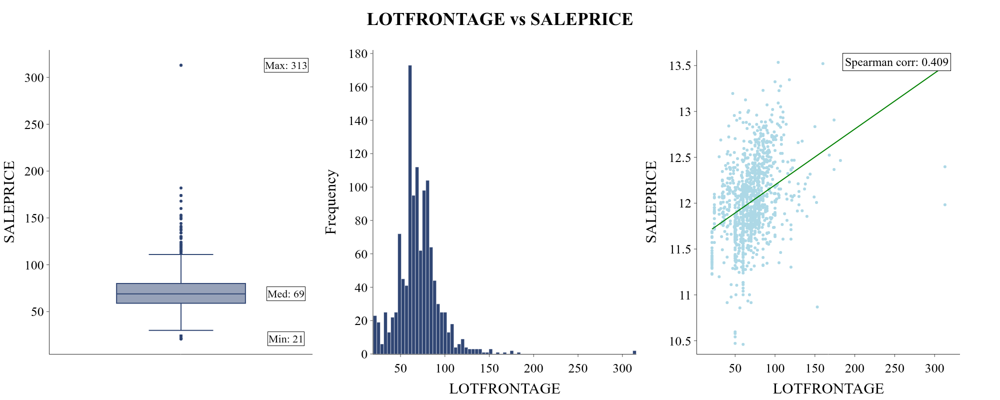

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
LOTFRONTAGE,"1,201",70.05,24.28,21.00,34.00,59.00,69.00,80.00,107.00,313.00,589.75,2.16,17.45,259,17.74%


In [12]:
feature = "LOTFRONTAGE"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=2.164, kurtosis=17.453), with median 69 vs. mean 70 and range [21, 313].
- 259 missing values (17.74%); 88 IQR-based outliers (7.33%, bounds [27.5, 111.5]).
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.409, Pearson r=0.356).

**Conclusion:**

- Notable outlier share (7.33%, bounds [27.5, 111.5]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `LOTAREA`

`LOTAREA` (int64) - Lot size in square feet.

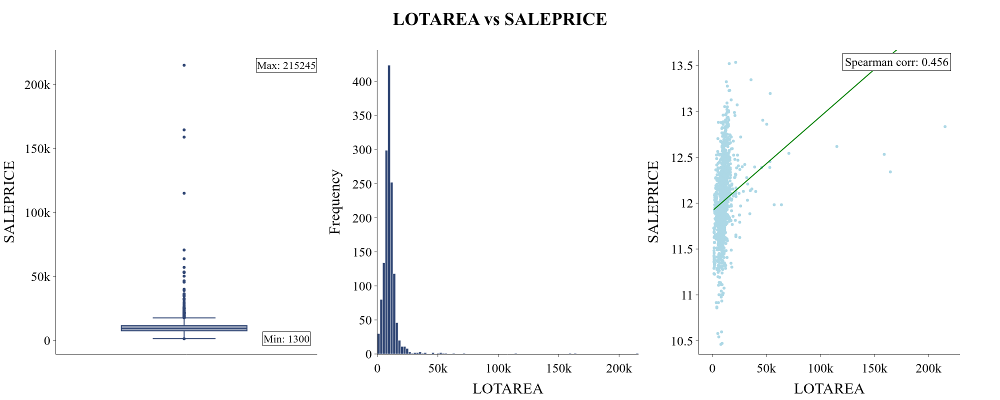

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
LOTAREA,"1,460","10,516.83","9,981.26","1,300.00","3,311.70","7,553.50","9,478.50","11,601.50","17,401.15","215,245.00","99,625,649.65",12.21,203.24,0,0.00%


In [13]:
feature = "LOTAREA"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=12.208, kurtosis=203.243), with median 9,478 vs. mean 10,517 and range [1,300, 215,245].
- No missing values; 69 IQR-based outliers (4.73%, bounds [1,481.5, 17,673.5]).
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.456, Pearson r=0.257).

## `STREET`

`STREET` (str) - Type of road access to the property (paved or gravel).

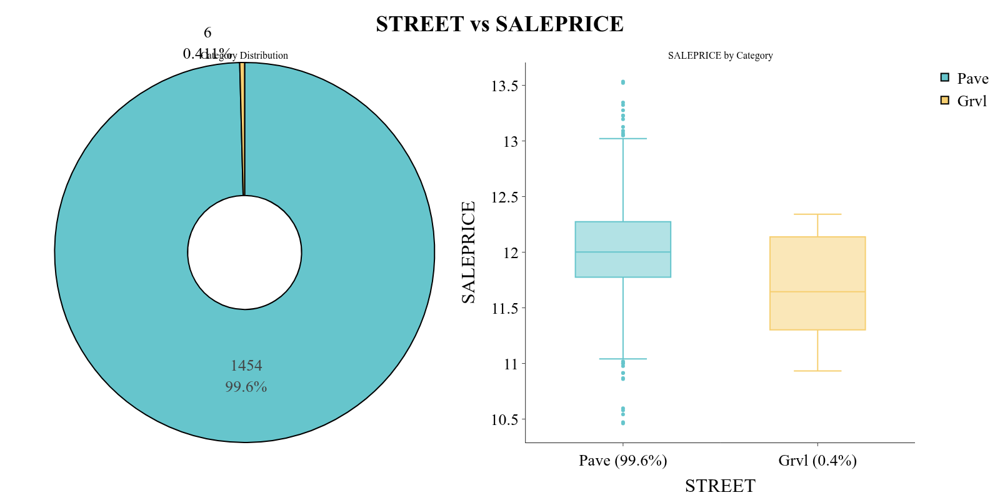

,Category,Count,Percentage (%)
0,Pave,"1,454",99.59%
1,Grvl,6,0.41%


In [14]:
feature = "STREET"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 2 unique categories; most frequent: Pave (99.59%), Grvl (0.41%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for 'Grvl' to 12.000 for 'Pave', vs. an overall mean of 12.000.

**Conclusion:**

- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `ALLEY`

`ALLEY` (str) - Type of alley access to the property, if any.

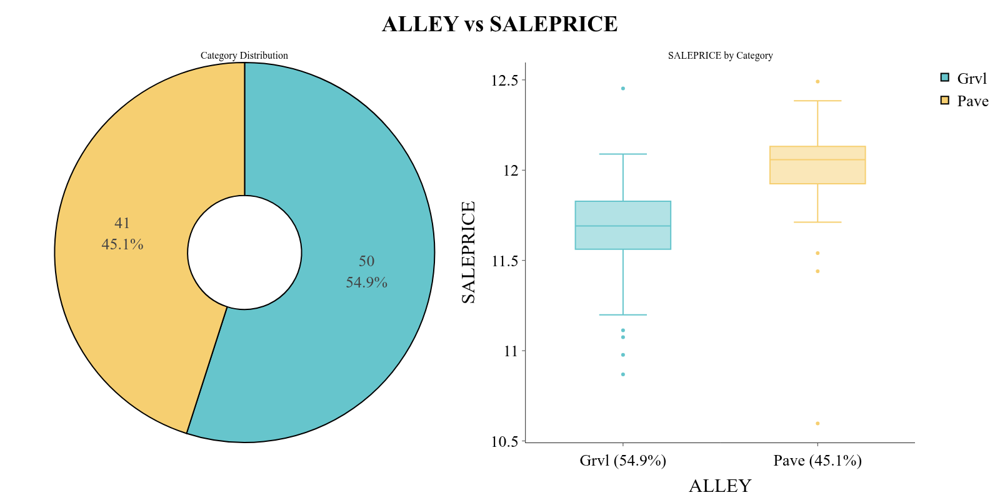

,Category,Count,Percentage (%)
0,nan,"1,369",93.77%
1,Grvl,50,3.42%
2,Pave,41,2.81%


In [15]:
feature = "ALLEY"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 2 unique categories; most frequent: Grvl (3.42%), Pave (2.81%).
- 1,369 missing values (93.77%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for 'Grvl' to 12.000 for 'Pave', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (93.77%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.

## `LOTSHAPE`

`LOTSHAPE` (str) - General shape of the property (regular vs. varying degrees of irregularity).

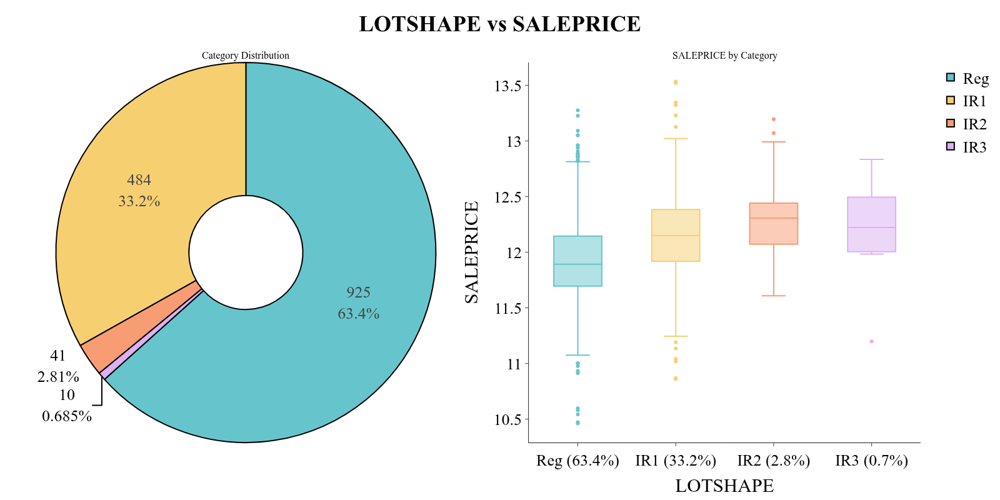

,Category,Count,Percentage (%)
0,Reg,925,63.36%
1,IR1,484,33.15%
2,IR2,41,2.81%
3,IR3,10,0.68%


In [16]:
feature = "LOTSHAPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: Reg (63.36%), IR1 (33.15%), IR2 (2.81%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.900 for 'Reg' to 12.300 for 'IR2', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `LANDCONTOUR`

`LANDCONTOUR` (str) - Flatness of the property (level, banked, hillside, depression).

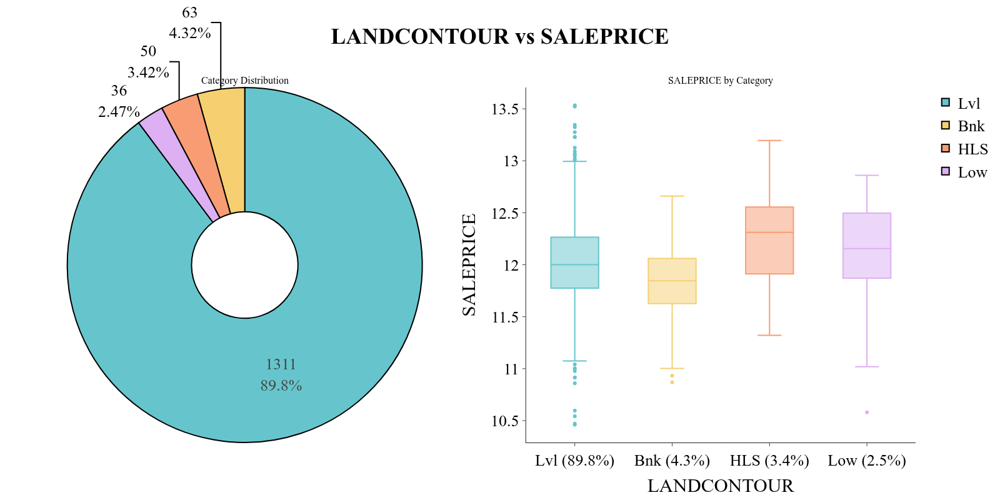

,Category,Count,Percentage (%)
0,Lvl,"1,311",89.79%
1,Bnk,63,4.32%
2,HLS,50,3.42%
3,Low,36,2.47%


In [17]:
feature = "LANDCONTOUR"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: Lvl (89.79%), Bnk (4.32%), HLS (3.42%).
- No missing values; no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'Bnk' to 12.300 for 'HLS', vs. an overall mean of 12.000.

## `UTILITIES`

`UTILITIES` (str) - Type of utilities available (all public, or partial).

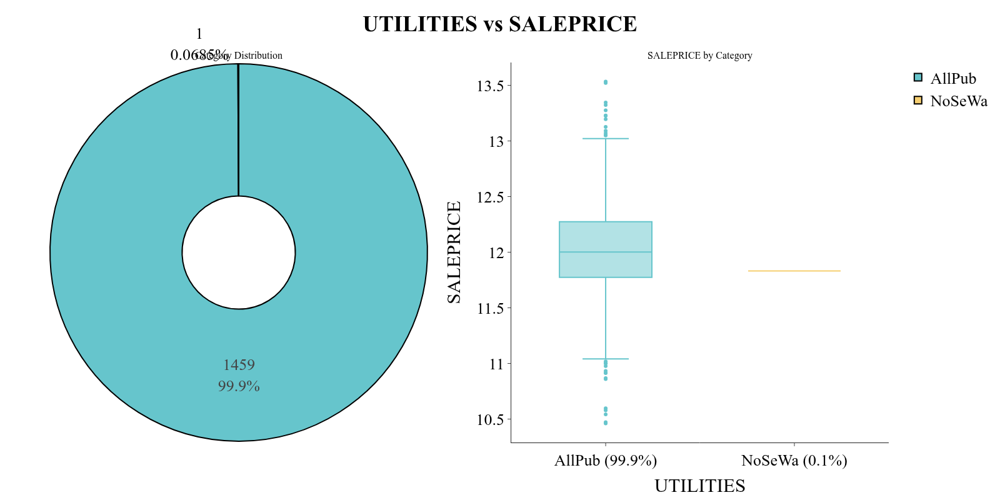

,Category,Count,Percentage (%)
0,AllPub,"1,459",99.93%
1,NoSeWa,1,0.07%


In [18]:
feature = "UTILITIES"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 2 unique categories; most frequent: AllPub (99.93%), NoSeWa (0.07%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'NoSeWa' to 12.000 for 'AllPub', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `LOTCONFIG`

`LOTCONFIG` (str) - Lot configuration (inside lot, corner lot, cul-de-sac, etc.).

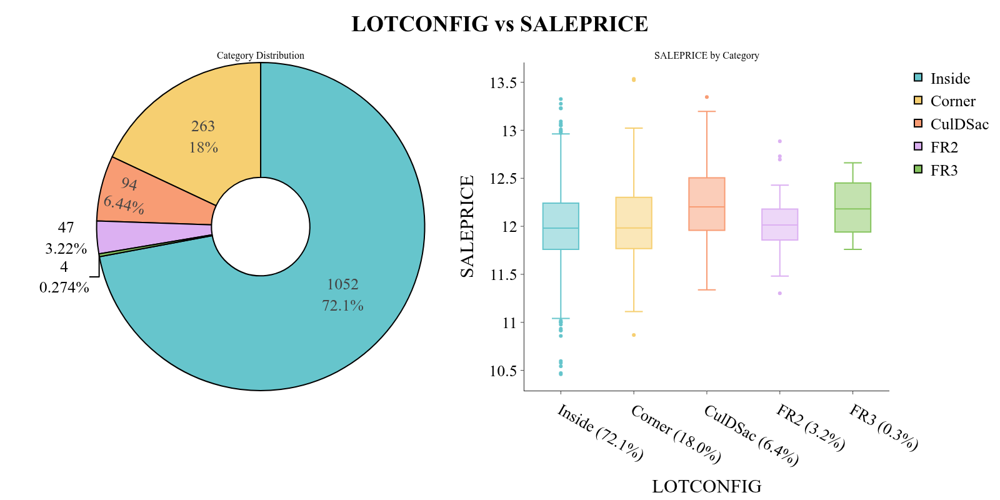

,Category,Count,Percentage (%)
0,Inside,"1,052",72.05%
1,Corner,263,18.01%
2,CulDSac,94,6.44%
3,FR2,47,3.22%
4,FR3,4,0.27%


In [19]:
feature = "LOTCONFIG"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: Inside (72.05%), Corner (18.01%), CulDSac (6.44%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 12.000 for 'Inside' to 12.200 for 'CulDSac', vs. an overall mean of 12.000.

**Conclusion:**

- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `LANDSLOPE`

`LANDSLOPE` (str) - Slope of the property (gentle, moderate, severe).

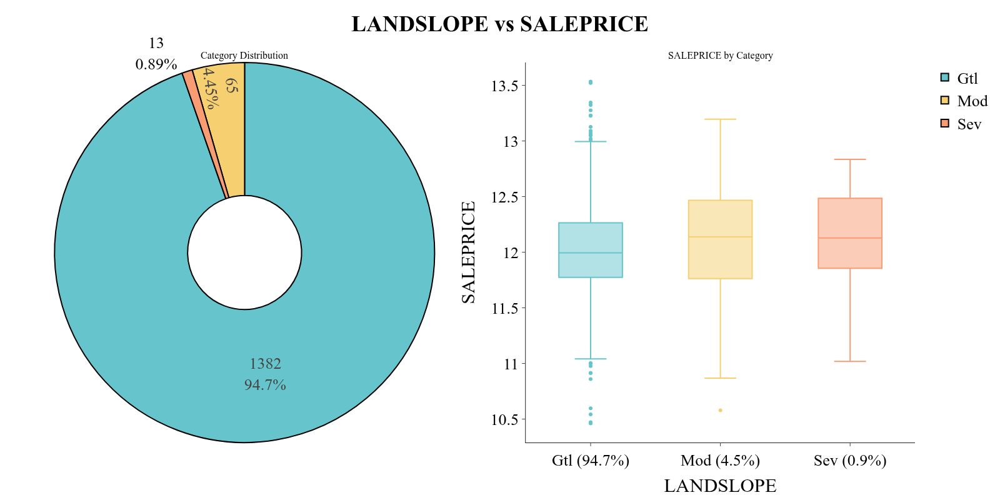

,Category,Count,Percentage (%)
0,Gtl,"1,382",94.66%
1,Mod,65,4.45%
2,Sev,13,0.89%


In [20]:
feature = "LANDSLOPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 3 unique categories; most frequent: Gtl (94.66%), Mod (4.45%), Sev (0.89%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 12.000 for 'Gtl' to 12.100 for 'Sev', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `NEIGHBORHOOD`

`NEIGHBORHOOD` (str) - Physical location (neighborhood) within Ames city limits.

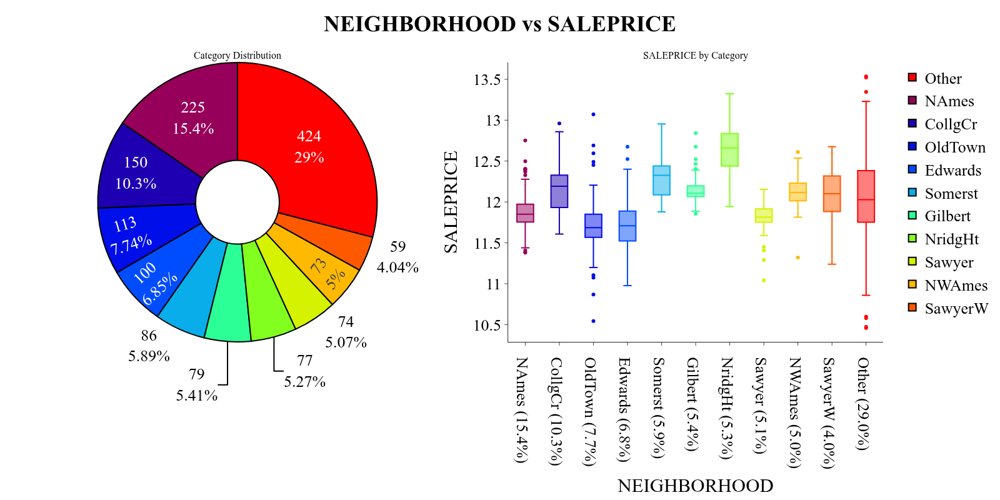

,Category,Count,Percentage (%)
0,NAmes,225,15.41%
1,CollgCr,150,10.27%
2,OldTown,113,7.74%
3,Edwards,100,6.85%
4,Somerst,86,5.89%
5,Gilbert,79,5.41%
6,NridgHt,77,5.27%
7,Sawyer,74,5.07%
8,NWAmes,73,5.00%
9,SawyerW,59,4.04%


In [21]:
feature = "NEIGHBORHOOD"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 25 unique categories; most frequent: NAmes (15.41%), CollgCr (10.27%), OldTown (7.74%).
- No missing values; 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.400 for 'IDOTRR' to 12.700 for 'NoRidge', vs. an overall mean of 12.000.

**Conclusion:**

- High cardinality (25 categories) makes one-hot encoding sparse and split-inefficient; target or frequency encoding would compress the category into a single informative numeric column that a GBM can split on directly.

## `CONDITION1`

`CONDITION1` (str) - Proximity to various conditions (e.g., arterial street, railroad, park).

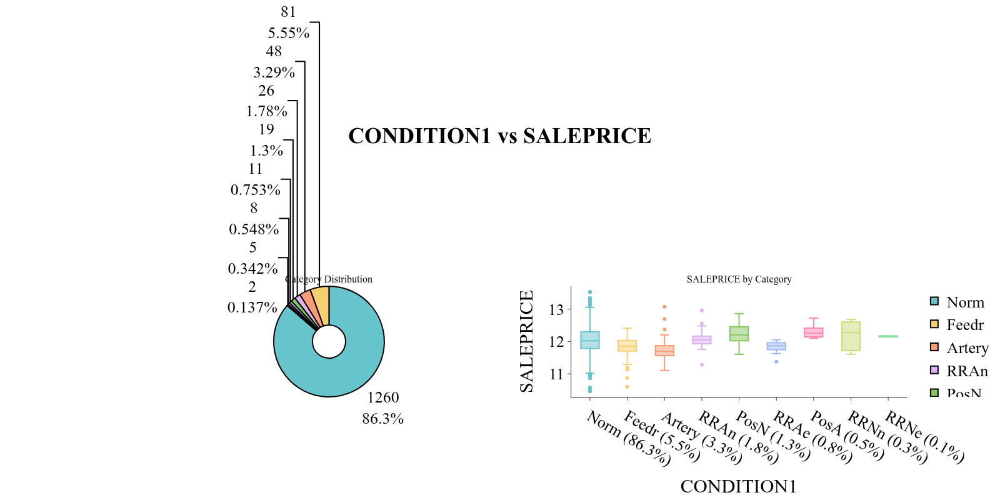

,Category,Count,Percentage (%)
0,Norm,"1,260",86.30%
1,Feedr,81,5.55%
2,Artery,48,3.29%
3,RRAn,26,1.78%
4,PosN,19,1.30%
5,RRAe,11,0.75%
6,PosA,8,0.55%
7,RRNn,5,0.34%
8,RRNe,2,0.14%


In [22]:
feature = "CONDITION1"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 9 unique categories; most frequent: Norm (86.3%), Feedr (5.55%), Artery (3.29%).
- No missing values; 4 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for 'Artery' to 12.300 for 'PosA', vs. an overall mean of 12.000.

**Conclusion:**

- 4 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `CONDITION2`

`CONDITION2` (str) - Proximity to a second condition, if more than one is present.

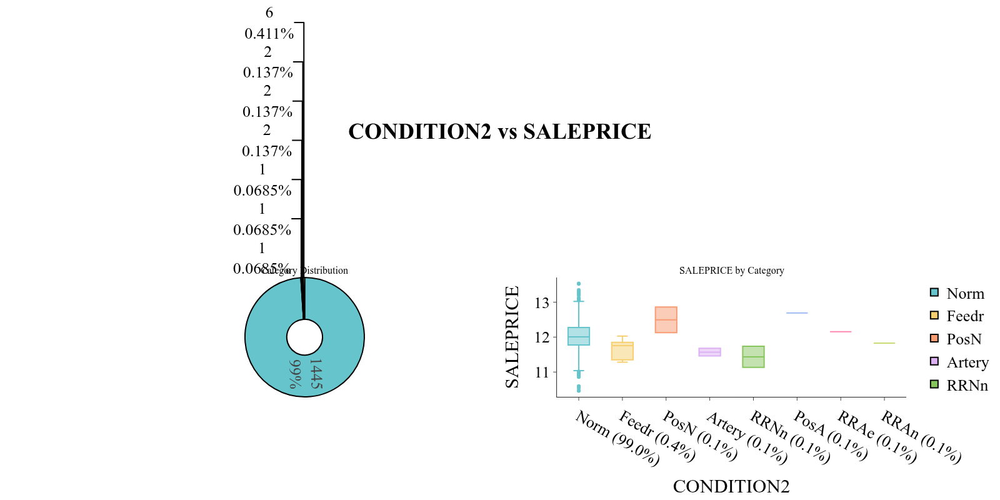

,Category,Count,Percentage (%)
0,Norm,"1,445",98.97%
1,Feedr,6,0.41%
2,Artery,2,0.14%
3,RRNn,2,0.14%
4,PosN,2,0.14%
5,PosA,1,0.07%
6,RRAn,1,0.07%
7,RRAe,1,0.07%


In [23]:
feature = "CONDITION2"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 8 unique categories; most frequent: Norm (98.97%), Feedr (0.41%), Artery (0.14%).
- No missing values; 7 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.400 for 'RRNn' to 12.700 for 'PosA', vs. an overall mean of 12.000.

**Conclusion:**

- 7 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `BLDGTYPE`

`BLDGTYPE` (str) - Type of dwelling (single-family, duplex, townhouse, etc.).

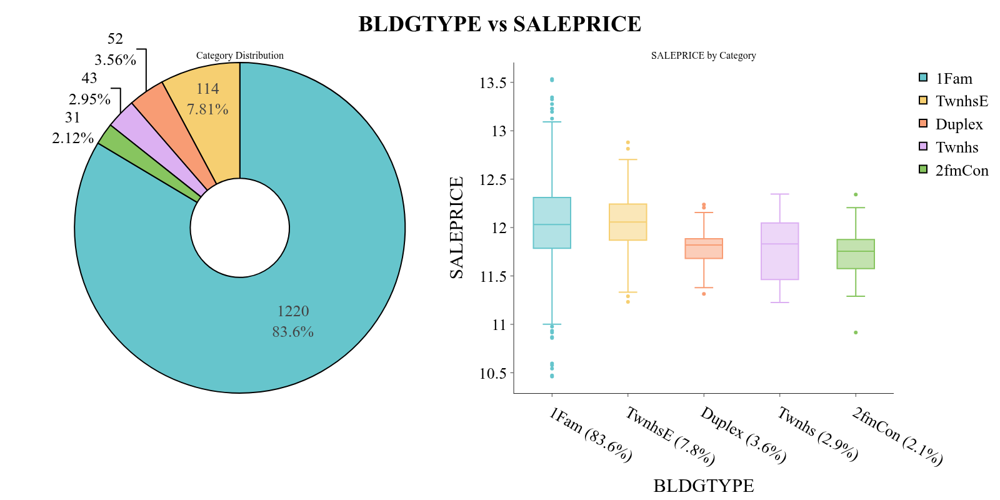

,Category,Count,Percentage (%)
0,1Fam,"1,220",83.56%
1,TwnhsE,114,7.81%
2,Duplex,52,3.56%
3,Twnhs,43,2.95%
4,2fmCon,31,2.12%


In [24]:
feature = "BLDGTYPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: 1Fam (83.56%), TwnhsE (7.81%), Duplex (3.56%).
- No missing values; no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for '2fmCon' to 12.100 for 'TwnhsE', vs. an overall mean of 12.000.

## `HOUSESTYLE`

`HOUSESTYLE` (str) - Style of dwelling (one-story, two-story, split-level, etc.).

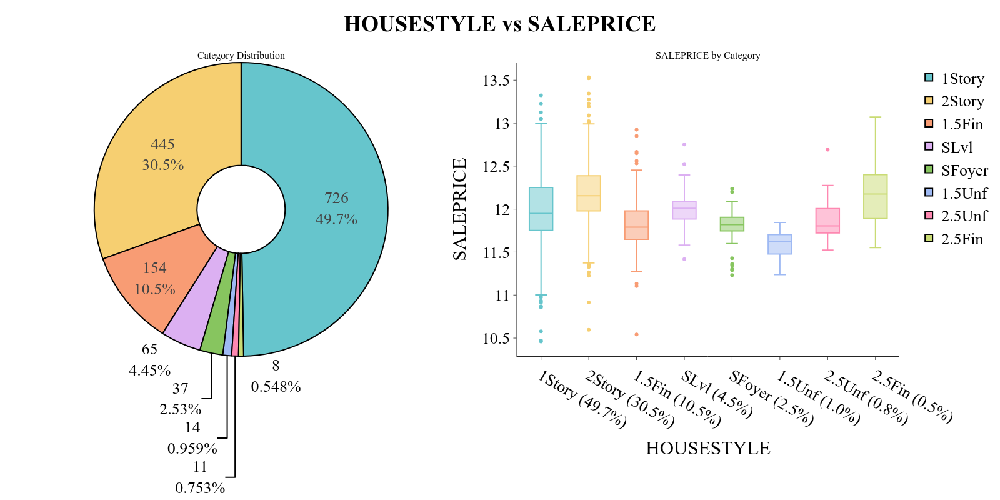

,Category,Count,Percentage (%)
0,1Story,726,49.73%
1,2Story,445,30.48%
2,1.5Fin,154,10.55%
3,SLvl,65,4.45%
4,SFoyer,37,2.53%
5,1.5Unf,14,0.96%
6,2.5Unf,11,0.75%
7,2.5Fin,8,0.55%


In [25]:
feature = "HOUSESTYLE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 8 unique categories; most frequent: 1Story (49.73%), 2Story (30.48%), 1.5Fin (10.55%).
- No missing values; 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for '1.5Unf' to 12.200 for '2.5Fin', vs. an overall mean of 12.000.

**Conclusion:**

- 3 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `OVERALLQUAL`

`OVERALLQUAL` (int64) - Overall material and finish quality of the house, rated 1 (very poor) to 10 (very excellent).

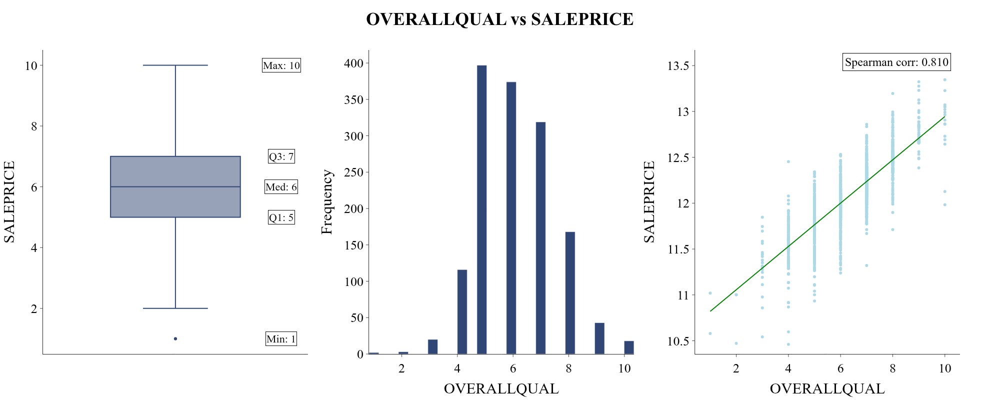

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
OVERALLQUAL,"1,460",6.10,1.38,1.00,4.00,5.00,6.00,7.00,8.00,10.00,1.91,0.22,0.10,0,0.00%


In [26]:
feature = "OVERALLQUAL"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.217, kurtosis=0.096), with median 6 vs. mean 6 and range [1, 10].
- No missing values; 2 IQR-based outliers (0.14%, bounds [2.0, 10.0]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.81, Pearson r=0.817).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.81) makes this a reliable early split candidate; pairing it with other top predictors (e.g. GrLivArea) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `OVERALLCOND`

`OVERALLCOND` (int64) - Overall condition rating of the house, rated 1 (very poor) to 10 (very excellent).

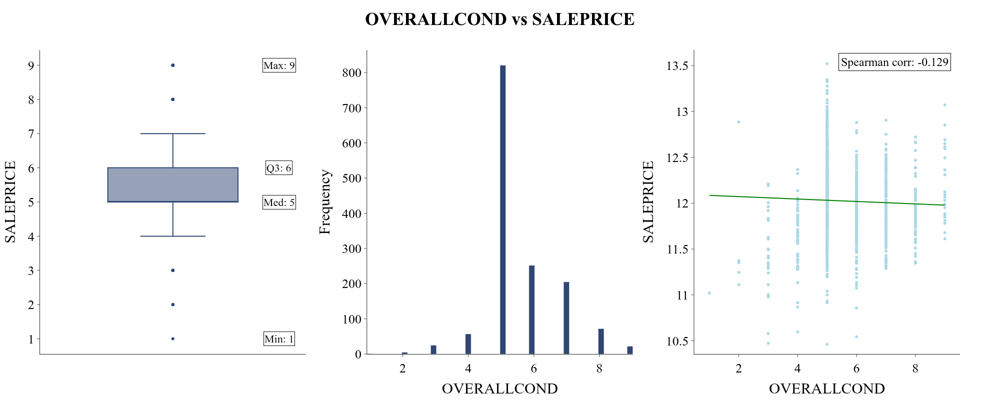

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
OVERALLCOND,"1,460",5.58,1.11,1.00,4.00,5.00,5.00,6.00,8.00,9.00,1.24,0.69,1.11,0,0.00%


In [27]:
feature = "OVERALLCOND"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.693, kurtosis=1.106), with median 5 vs. mean 6 and range [1, 9].
- No missing values; 125 IQR-based outliers (8.56%, bounds [3.5, 7.5]).
- Weak negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.129, Pearson r=-0.037).

**Conclusion:**

- Notable outlier share (8.56%, bounds [3.5, 7.5]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `YEARBUILT`

`YEARBUILT` (int64) - Original construction year of the house.

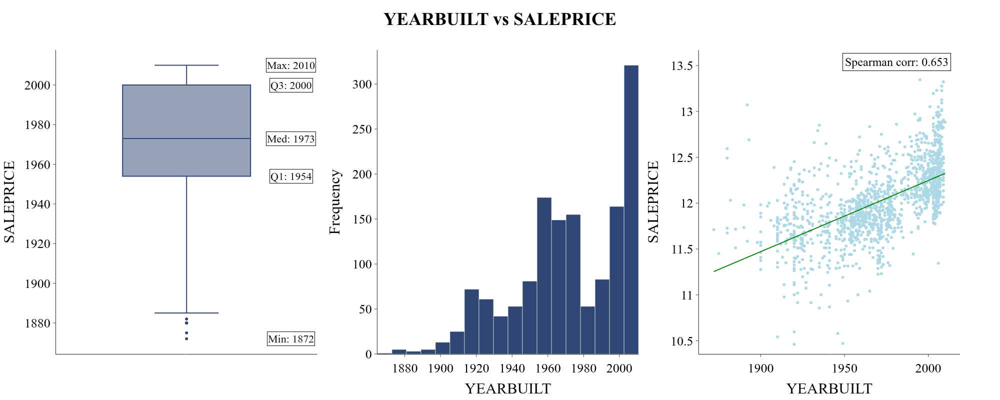

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
YEARBUILT,"1,460","1,971.27",30.20,"1,872.00","1,916.00","1,954.00","1,973.00","2,000.00","2,007.00","2,010.00",912.22,-0.61,-0.44,0,0.00%


In [28]:
feature = "YEARBUILT"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately left-skewed (skew=-0.613, kurtosis=-0.44), with median 1,973 vs. mean 1,971 and range [1,872, 2,010].
- No missing values; 7 IQR-based outliers (0.48%, bounds [1,885.0, 2,069.0]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.653, Pearson r=0.587).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.653) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `YEARREMODADD`

`YEARREMODADD` (int64) - Year of remodel/addition (same as construction year if no remodeling or additions).

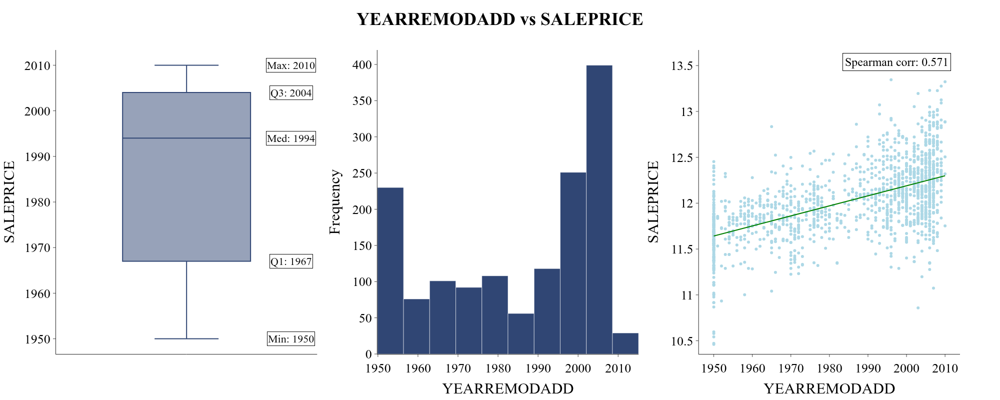

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
YEARREMODADD,"1,460","1,984.87",20.65,"1,950.00","1,950.00","1,967.00","1,994.00","2,004.00","2,007.00","2,010.00",426.23,-0.50,-1.27,0,0.00%


In [29]:
feature = "YEARREMODADD"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately left-skewed (skew=-0.504, kurtosis=-1.272), with median 1,994 vs. mean 1,985 and range [1,950, 2,010].
- No missing values; no IQR-based outliers.
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.571, Pearson r=0.566).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.571) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `ROOFSTYLE`

`ROOFSTYLE` (str) - Type of roof (gable, hip, flat, etc.).

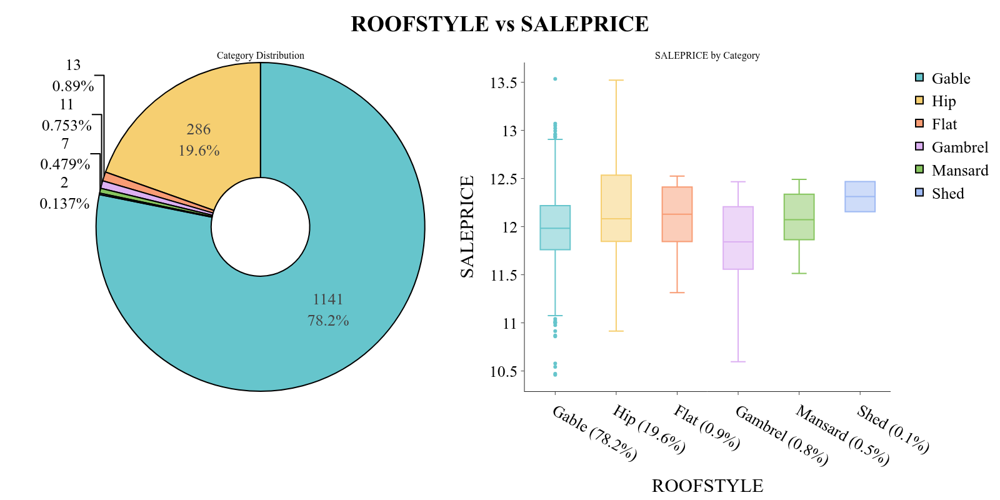

,Category,Count,Percentage (%)
0,Gable,"1,141",78.15%
1,Hip,286,19.59%
2,Flat,13,0.89%
3,Gambrel,11,0.75%
4,Mansard,7,0.48%
5,Shed,2,0.14%


In [30]:
feature = "ROOFSTYLE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: Gable (78.15%), Hip (19.59%), Flat (0.89%).
- No missing values; 4 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'Gambrel' to 12.300 for 'Shed', vs. an overall mean of 12.000.

**Conclusion:**

- 4 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `ROOFMATL`

`ROOFMATL` (str) - Roof material (standard shingle, wood shingles, membrane, etc.).

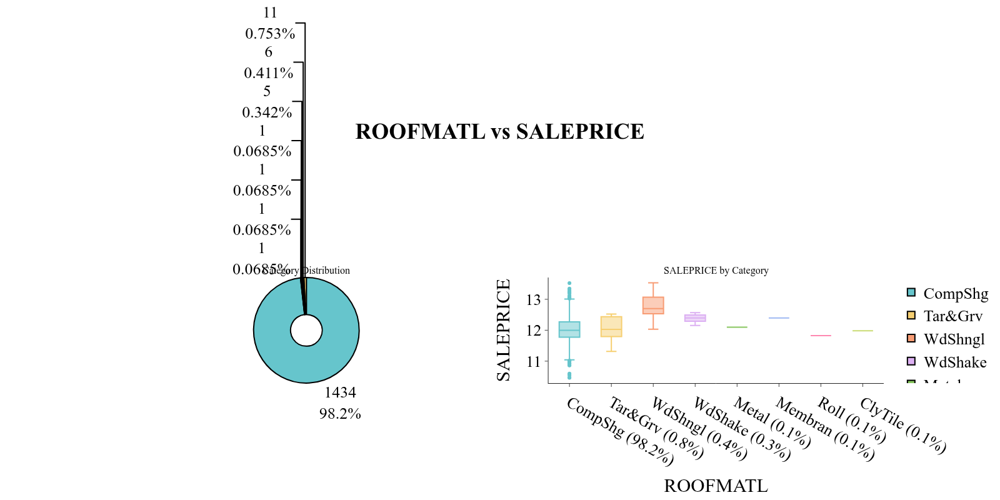

,Category,Count,Percentage (%)
0,CompShg,"1,434",98.22%
1,Tar&Grv,11,0.75%
2,WdShngl,6,0.41%
3,WdShake,5,0.34%
4,Metal,1,0.07%
5,Membran,1,0.07%
6,Roll,1,0.07%
7,ClyTile,1,0.07%


In [31]:
feature = "ROOFMATL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 8 unique categories; most frequent: CompShg (98.22%), Tar&Grv (0.75%), WdShngl (0.41%).
- No missing values; 7 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'Roll' to 12.800 for 'WdShngl', vs. an overall mean of 12.000.

**Conclusion:**

- 7 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `EXTERIOR1ST`

`EXTERIOR1ST` (str) - Primary exterior covering material on the house.

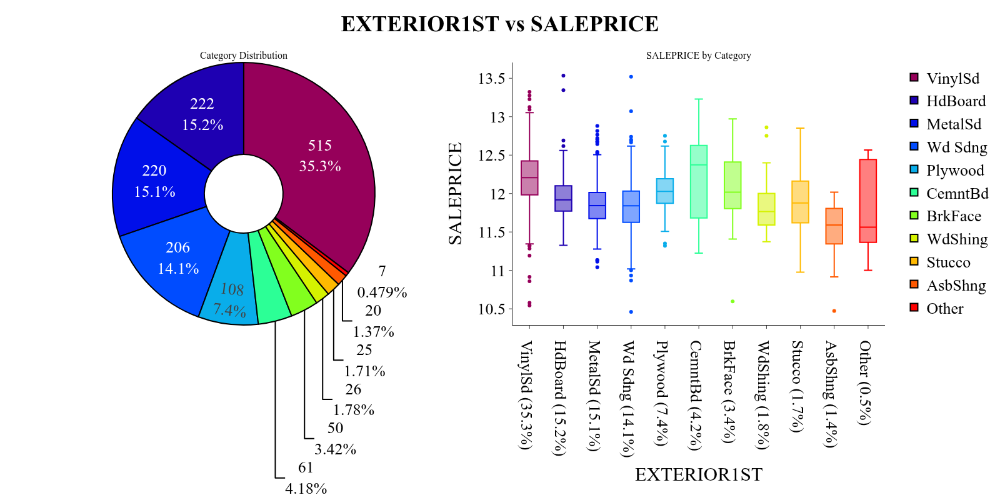

,Category,Count,Percentage (%)
0,VinylSd,515,35.27%
1,HdBoard,222,15.21%
2,MetalSd,220,15.07%
3,Wd Sdng,206,14.11%
4,Plywood,108,7.40%
5,CemntBd,61,4.18%
6,BrkFace,50,3.42%
7,WdShing,26,1.78%
8,Stucco,25,1.71%
9,AsbShng,20,1.37%


In [32]:
feature = "EXTERIOR1ST"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 15 unique categories; most frequent: VinylSd (35.27%), HdBoard (15.21%), MetalSd (15.07%).
- No missing values; 5 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.200 for 'BrkComm' to 12.500 for 'ImStucc', vs. an overall mean of 12.000.

**Conclusion:**

- High cardinality (15 categories) makes one-hot encoding sparse and split-inefficient; target or frequency encoding would compress the category into a single informative numeric column that a GBM can split on directly.

## `EXTERIOR2ND`

`EXTERIOR2ND` (str) - Secondary exterior covering material, if more than one material is used.

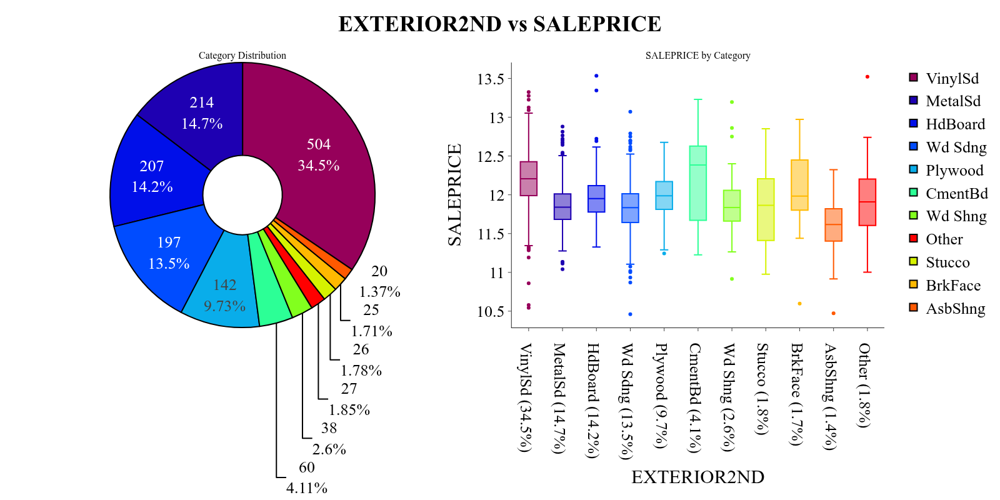

,Category,Count,Percentage (%)
0,VinylSd,504,34.52%
1,MetalSd,214,14.66%
2,HdBoard,207,14.18%
3,Wd Sdng,197,13.49%
4,Plywood,142,9.73%
5,CmentBd,60,4.11%
6,Wd Shng,38,2.60%
7,Stucco,26,1.78%
8,BrkFace,25,1.71%
9,AsbShng,20,1.37%


In [33]:
feature = "EXTERIOR2ND"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 16 unique categories; most frequent: VinylSd (34.52%), MetalSd (14.66%), HdBoard (14.18%).
- No missing values; 6 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for 'CBlock' to 12.700 for 'Other', vs. an overall mean of 12.000.

**Conclusion:**

- High cardinality (16 categories) makes one-hot encoding sparse and split-inefficient; target or frequency encoding would compress the category into a single informative numeric column that a GBM can split on directly.

## `MASVNRTYPE`

`MASVNRTYPE` (str) - Masonry veneer type (brick, stone, none).

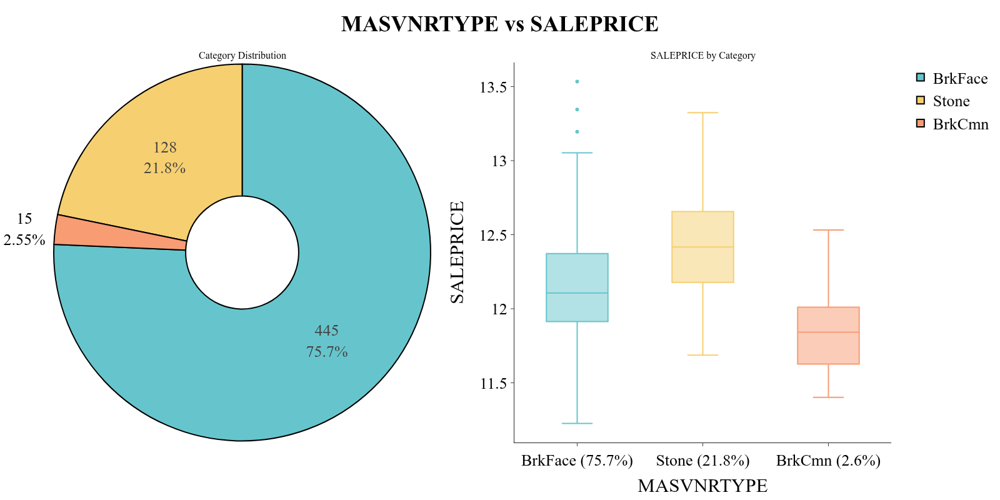

,Category,Count,Percentage (%)
0,nan,872,59.73%
1,BrkFace,445,30.48%
2,Stone,128,8.77%
3,BrkCmn,15,1.03%


In [34]:
feature = "MASVNRTYPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 3 unique categories; most frequent: BrkFace (30.48%), Stone (8.77%), BrkCmn (1.03%).
- 872 missing values (59.73%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.900 for 'BrkCmn' to 12.400 for 'Stone', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (59.73%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.

## `MASVNRAREA`

`MASVNRAREA` (float64) - Masonry veneer area in square feet.

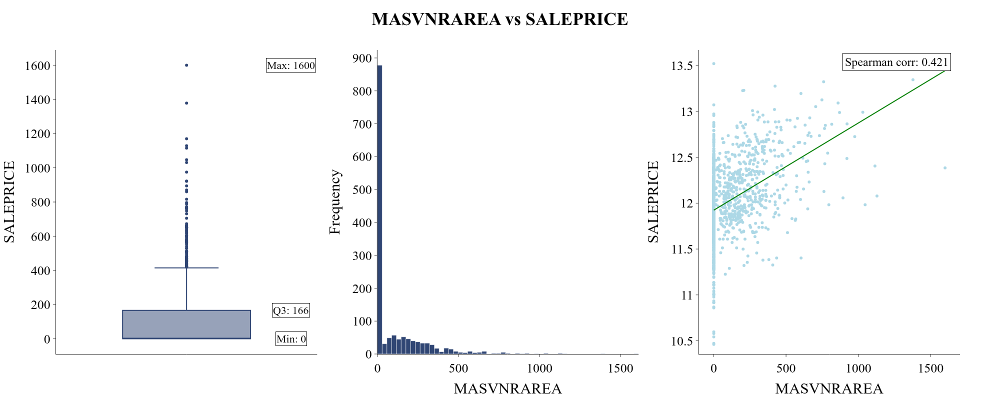

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
MASVNRAREA,"1,452",103.69,181.07,0.00,0.00,0.00,0.00,166.00,456.00,"1,600.00","32,784.97",2.67,10.08,8,0.55%


In [35]:
feature = "MASVNRAREA"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=2.669, kurtosis=10.082), with median 0 vs. mean 104 and range [0, 1,600].
- 8 missing values (0.55%); 96 IQR-based outliers (6.61%, bounds [-249.0, 415.0]), 59.3% of values are exactly zero.
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.421, Pearson r=0.431).

**Conclusion:**

- Missingness (0.55%) reflects structural absence (no masonry veneer) rather than randomness, so a dedicated 'missing' sentinel/flag preserves that signal for the tree splits instead of being smoothed away by mean/median imputation.
- Notable outlier share (6.61%, bounds [-249.0, 415.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `EXTERQUAL`

`EXTERQUAL` (str) - Quality of the exterior material.

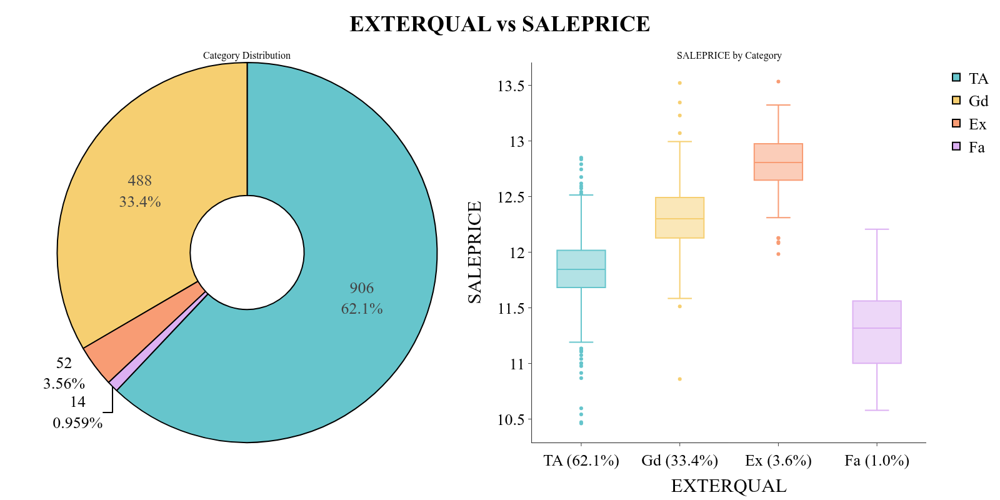

,Category,Count,Percentage (%)
0,TA,906,62.05%
1,Gd,488,33.42%
2,Ex,52,3.56%
3,Fa,14,0.96%


In [36]:
feature = "EXTERQUAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: TA (62.05%), Gd (33.42%), Ex (3.56%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.300 for 'Fa' to 12.800 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `EXTERCOND`

`EXTERCOND` (str) - Present condition of the exterior material.

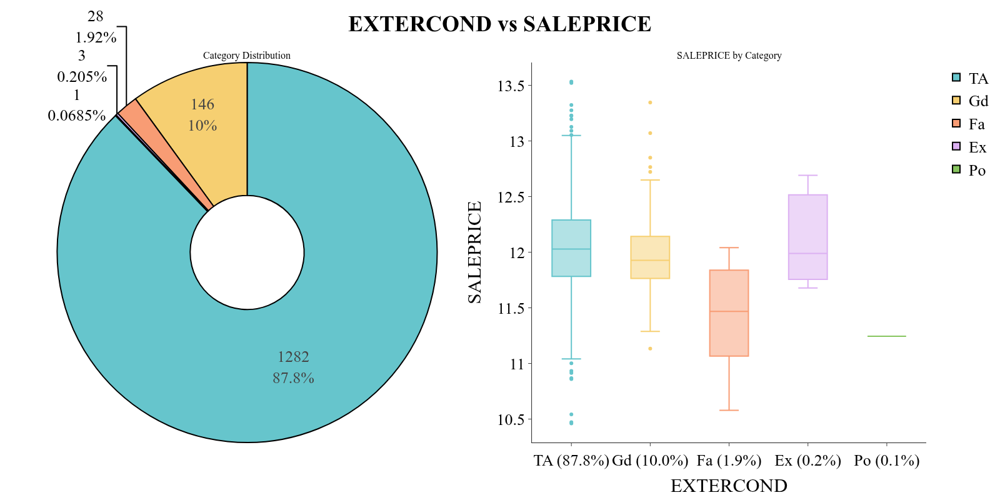

,Category,Count,Percentage (%)
0,TA,"1,282",87.81%
1,Gd,146,10.00%
2,Fa,28,1.92%
3,Ex,3,0.21%
4,Po,1,0.07%


In [37]:
feature = "EXTERCOND"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: TA (87.81%), Gd (10.0%), Fa (1.92%).
- No missing values; 2 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.200 for 'Po' to 12.100 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 2 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `FOUNDATION`

`FOUNDATION` (str) - Type of foundation (poured concrete, cinder block, etc.).

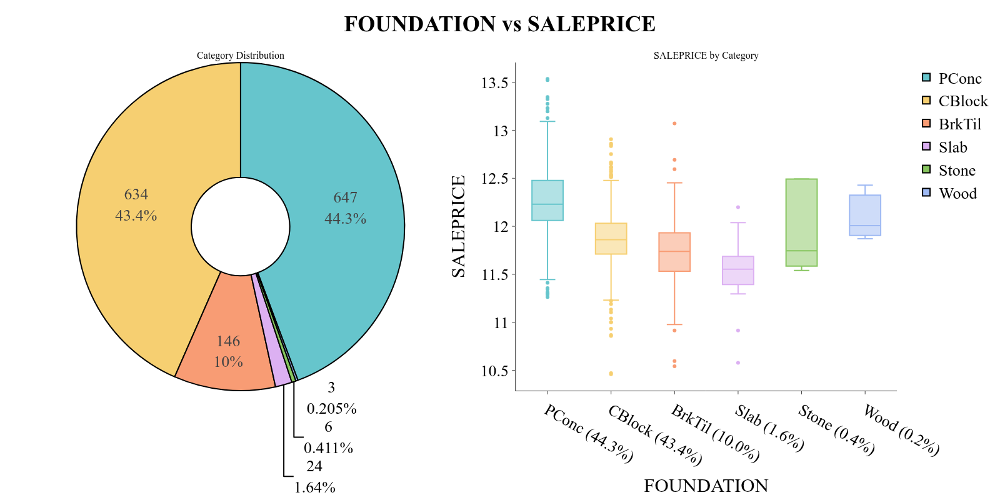

,Category,Count,Percentage (%)
0,PConc,647,44.32%
1,CBlock,634,43.42%
2,BrkTil,146,10.00%
3,Slab,24,1.64%
4,Stone,6,0.41%
5,Wood,3,0.21%


In [38]:
feature = "FOUNDATION"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: PConc (44.32%), CBlock (43.42%), BrkTil (10.0%).
- No missing values; 2 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.500 for 'Slab' to 12.300 for 'PConc', vs. an overall mean of 12.000.

**Conclusion:**

- 2 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `BSMTQUAL`

`BSMTQUAL` (str) - Height/quality of the basement.

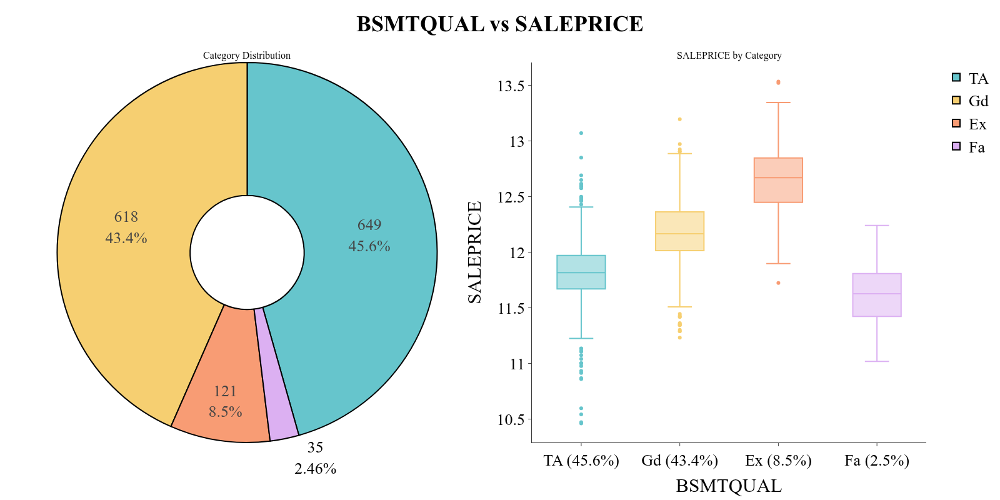

,Category,Count,Percentage (%)
0,TA,649,44.45%
1,Gd,618,42.33%
2,Ex,121,8.29%
3,nan,37,2.53%
4,Fa,35,2.40%


In [39]:
feature = "BSMTQUAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: TA (44.45%), Gd (42.33%), Ex (8.29%).
- 37 missing values (2.53%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for 'Fa' to 12.600 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (2.53%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `BSMTCOND`

`BSMTCOND` (str) - General condition of the basement.

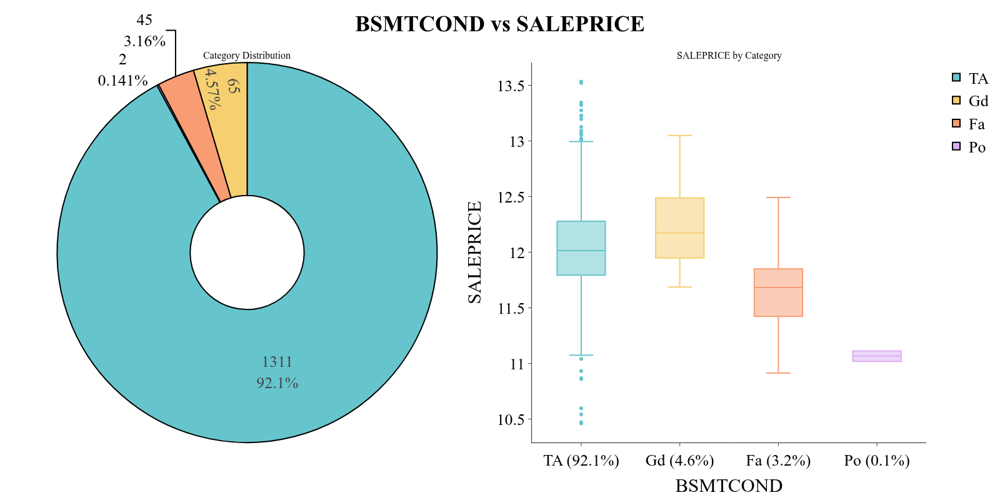

,Category,Count,Percentage (%)
0,TA,"1,311",89.79%
1,Gd,65,4.45%
2,Fa,45,3.08%
3,nan,37,2.53%
4,Po,2,0.14%


In [40]:
feature = "BSMTCOND"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: TA (89.79%), Gd (4.45%), Fa (3.08%).
- 37 missing values (2.53%); 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.100 for 'Po' to 12.200 for 'Gd', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (2.53%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `BSMTEXPOSURE`

`BSMTEXPOSURE` (str) - Walkout or garden-level basement wall exposure.

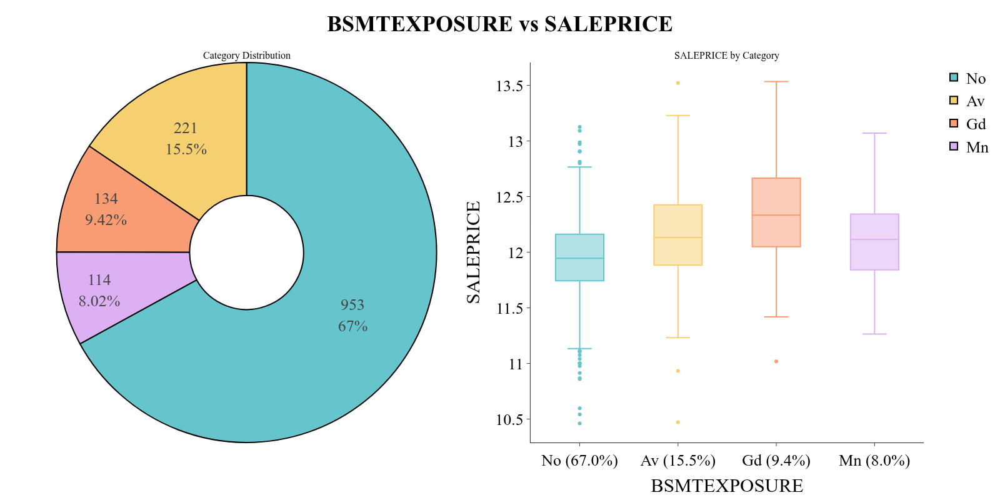

,Category,Count,Percentage (%)
0,No,953,65.27%
1,Av,221,15.14%
2,Gd,134,9.18%
3,Mn,114,7.81%
4,nan,38,2.60%


In [41]:
feature = "BSMTEXPOSURE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: No (65.27%), Av (15.14%), Gd (9.18%).
- 38 missing values (2.6%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 12.000 for 'No' to 12.400 for 'Gd', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (2.6%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `BSMTFINTYPE1`

`BSMTFINTYPE1` (str) - Quality/rating of the primary finished basement area.

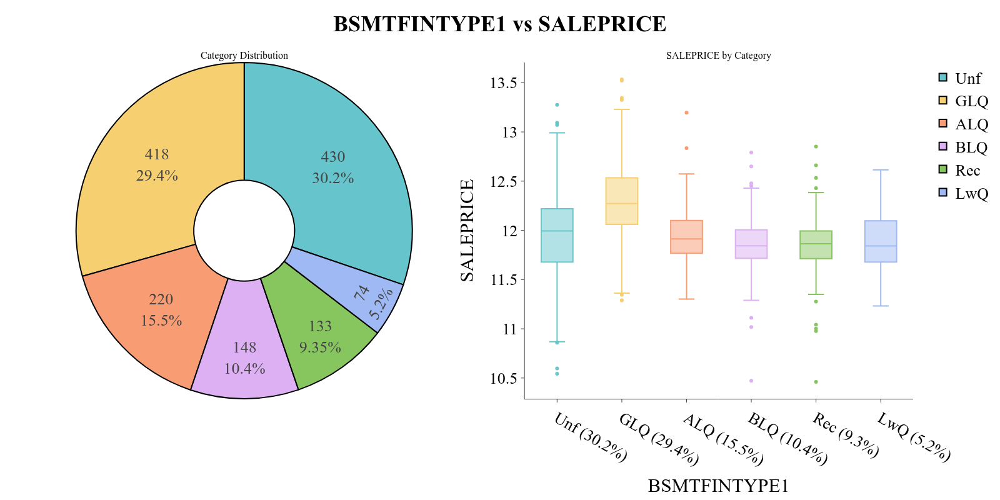

,Category,Count,Percentage (%)
0,Unf,430,29.45%
1,GLQ,418,28.63%
2,ALQ,220,15.07%
3,BLQ,148,10.14%
4,Rec,133,9.11%
5,LwQ,74,5.07%
6,nan,37,2.53%


In [42]:
feature = "BSMTFINTYPE1"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: Unf (29.45%), GLQ (28.63%), ALQ (15.07%).
- 37 missing values (2.53%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.900 for 'Rec' to 12.300 for 'GLQ', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (2.53%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `BSMTFINSF1`

`BSMTFINSF1` (int64) - Square footage of the primary finished basement area (type 1).

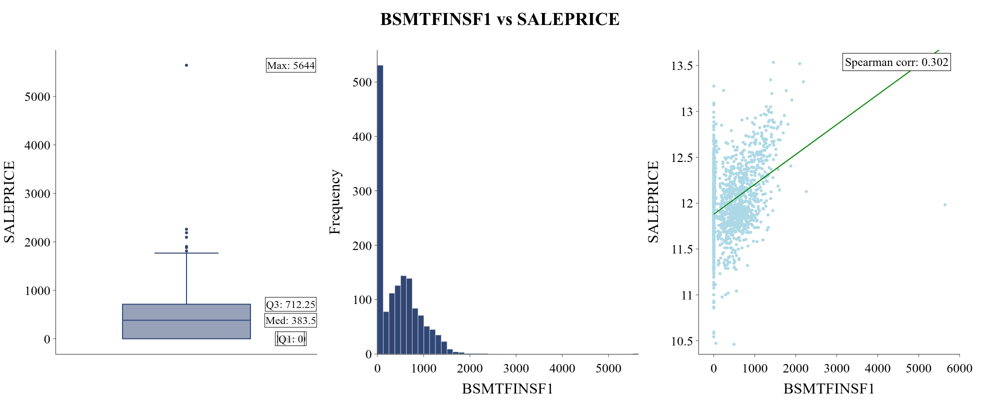

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BSMTFINSF1,"1,460",443.64,456.10,0.00,0.00,0.00,383.50,712.25,"1,274.00","5,644.00","208,025.47",1.69,11.12,0,0.00%


In [43]:
feature = "BSMTFINSF1"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.686, kurtosis=11.118), with median 384 vs. mean 444 and range [0, 5,644].
- No missing values; 7 IQR-based outliers (0.48%, bounds [-1,068.4, 1,780.6]), 31.99% of values are exactly zero.
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.302, Pearson r=0.372).

## `BSMTFINTYPE2`

`BSMTFINTYPE2` (str) - Quality/rating of the secondary finished basement area, if present.

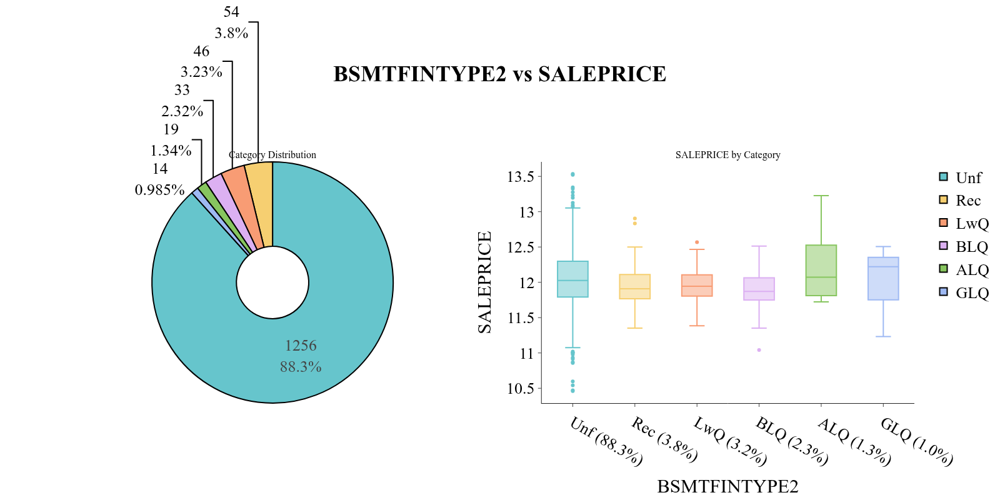

,Category,Count,Percentage (%)
0,Unf,"1,256",86.03%
1,Rec,54,3.70%
2,LwQ,46,3.15%
3,nan,38,2.60%
4,BLQ,33,2.26%
5,ALQ,19,1.30%
6,GLQ,14,0.96%


In [44]:
feature = "BSMTFINTYPE2"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: Unf (86.03%), Rec (3.7%), LwQ (3.15%).
- 38 missing values (2.6%); 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.900 for 'BLQ' to 12.200 for 'ALQ', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (2.6%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `BSMTFINSF2`

`BSMTFINSF2` (int64) - Square footage of the secondary finished basement area (type 2).

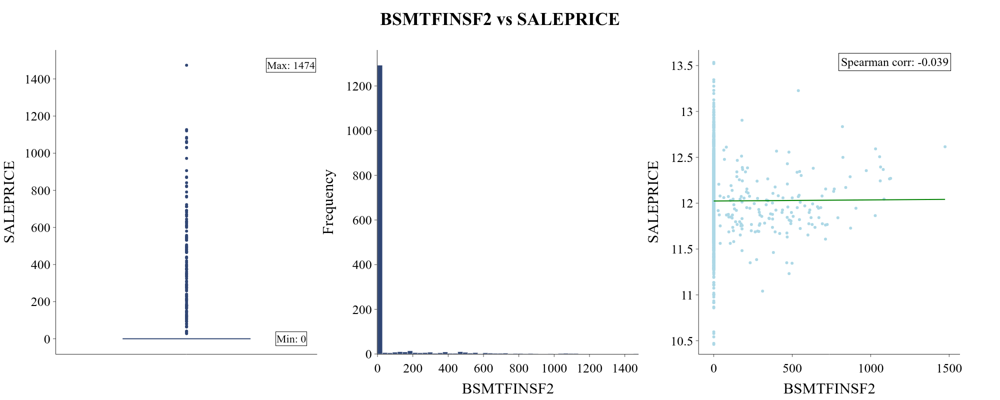

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BSMTFINSF2,"1,460",46.55,161.32,0.00,0.00,0.00,0.00,0.00,396.20,"1,474.00","26,023.91",4.26,20.11,0,0.00%


In [45]:
feature = "BSMTFINSF2"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=4.255, kurtosis=20.113), with median 0 vs. mean 47 and range [0, 1,474].
- No missing values; 167 IQR-based outliers (11.44%, bounds [0.0, 0.0]), 88.56% of values are exactly zero.
- Negligible negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.039, Pearson r=0.005).

**Conclusion:**

- Heavily zero-inflated (88.56% zeros) — a binary 'has_bsmtfinsf2' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Notable outlier share (11.44%, bounds [0.0, 0.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `BSMTUNFSF`

`BSMTUNFSF` (int64) - Square footage of unfinished basement area.

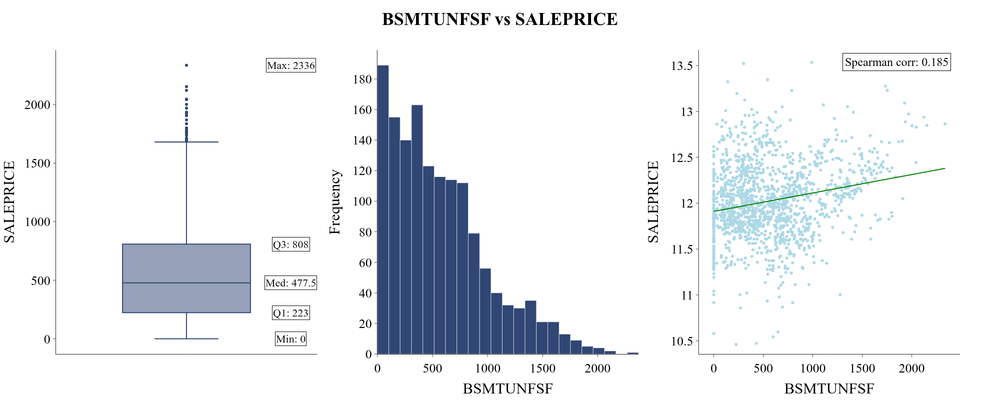

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BSMTUNFSF,"1,460",567.24,441.87,0.00,0.00,223.00,477.50,808.00,"1,468.00","2,336.00","195,246.41",0.92,0.47,0,0.00%


In [46]:
feature = "BSMTUNFSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.92, kurtosis=0.475), with median 478 vs. mean 567 and range [0, 2,336].
- No missing values; 29 IQR-based outliers (1.99%, bounds [-654.5, 1,685.5]).
- Weak positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.185, Pearson r=0.222).

## `TOTALBSMTSF`

`TOTALBSMTSF` (int64) - Total square footage of the basement area.

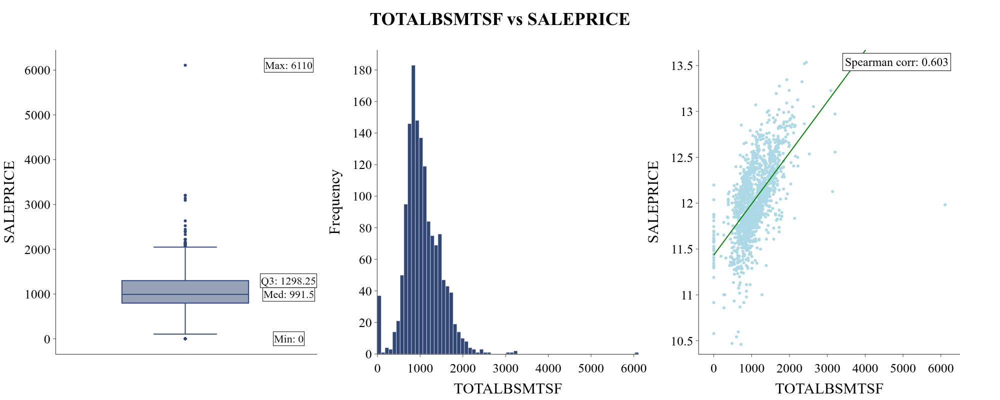

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
TOTALBSMTSF,"1,460","1,057.43",438.71,0.00,519.30,795.75,991.50,"1,298.25","1,753.00","6,110.00","192,462.36",1.52,13.25,0,0.00%


In [47]:
feature = "TOTALBSMTSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.524, kurtosis=13.25), with median 992 vs. mean 1,057 and range [0, 6,110].
- No missing values; 61 IQR-based outliers (4.18%, bounds [42.0, 2,052.0]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.603, Pearson r=0.612).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.603) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `HEATING`

`HEATING` (str) - Type of heating system.

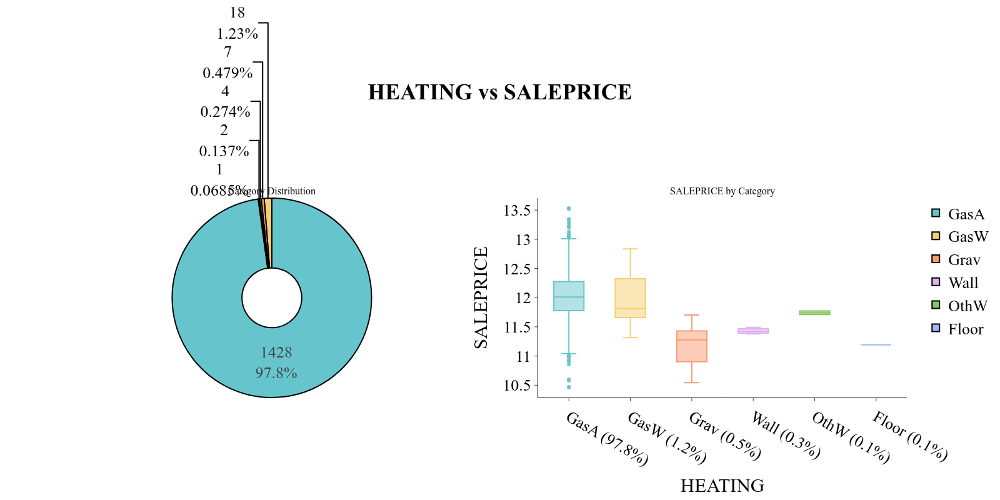

,Category,Count,Percentage (%)
0,GasA,"1,428",97.81%
1,GasW,18,1.23%
2,Grav,7,0.48%
3,Wall,4,0.27%
4,OthW,2,0.14%
5,Floor,1,0.07%


In [48]:
feature = "HEATING"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: GasA (97.81%), GasW (1.23%), Grav (0.48%).
- No missing values; 4 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.200 for 'Grav' to 12.000 for 'GasA', vs. an overall mean of 12.000.

**Conclusion:**

- 4 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `HEATINGQC`

`HEATINGQC` (str) - Heating quality and condition.

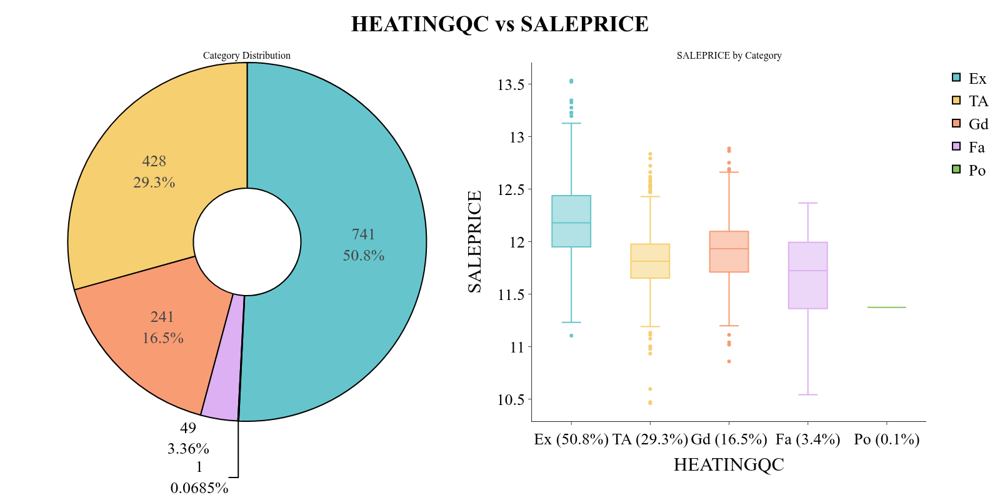

,Category,Count,Percentage (%)
0,Ex,741,50.75%
1,TA,428,29.32%
2,Gd,241,16.51%
3,Fa,49,3.36%
4,Po,1,0.07%


In [49]:
feature = "HEATINGQC"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: Ex (50.75%), TA (29.32%), Gd (16.51%).
- No missing values; 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.400 for 'Po' to 12.200 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 1 rare category (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `CENTRALAIR`

`CENTRALAIR` (str) - Whether the house has central air conditioning (yes/no).

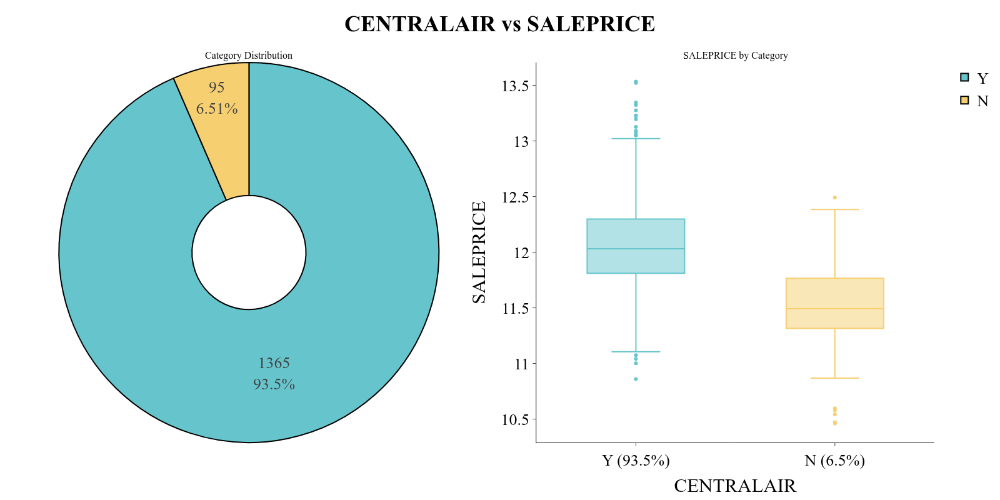

,Category,Count,Percentage (%)
0,Y,"1,365",93.49%
1,N,95,6.51%


In [50]:
feature = "CENTRALAIR"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 2 unique categories; most frequent: Y (93.49%), N (6.51%).
- No missing values; no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.500 for 'N' to 12.100 for 'Y', vs. an overall mean of 12.000.

## `ELECTRICAL`

`ELECTRICAL` (str) - Electrical system type.

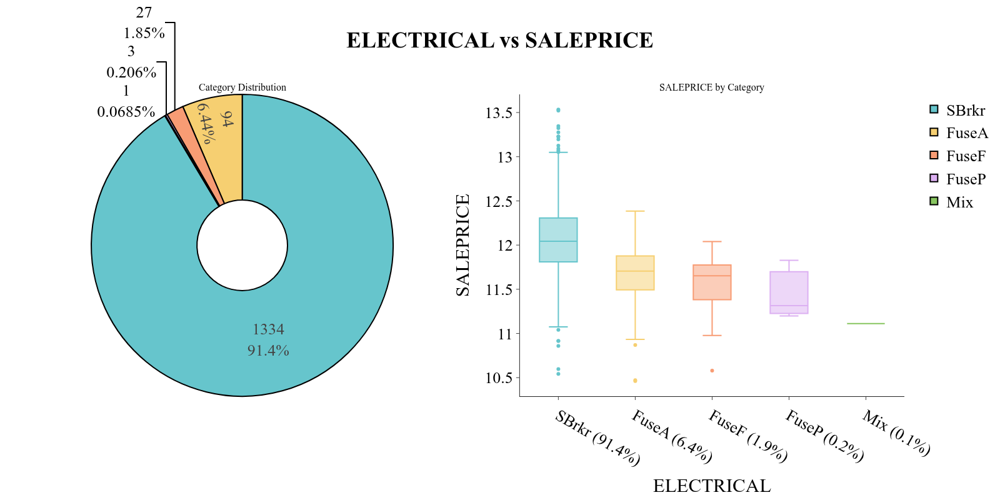

,Category,Count,Percentage (%)
0,SBrkr,"1,334",91.37%
1,FuseA,94,6.44%
2,FuseF,27,1.85%
3,FuseP,3,0.21%
4,Mix,1,0.07%
5,nan,1,0.07%


In [51]:
feature = "ELECTRICAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: SBrkr (91.37%), FuseA (6.44%), FuseF (1.85%).
- 1 missing value (0.07%); 2 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.100 for 'Mix' to 12.100 for 'SBrkr', vs. an overall mean of 12.000.

**Conclusion:**

- 2 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `1STFLRSF`

`1STFLRSF` (int64) - First floor square footage.

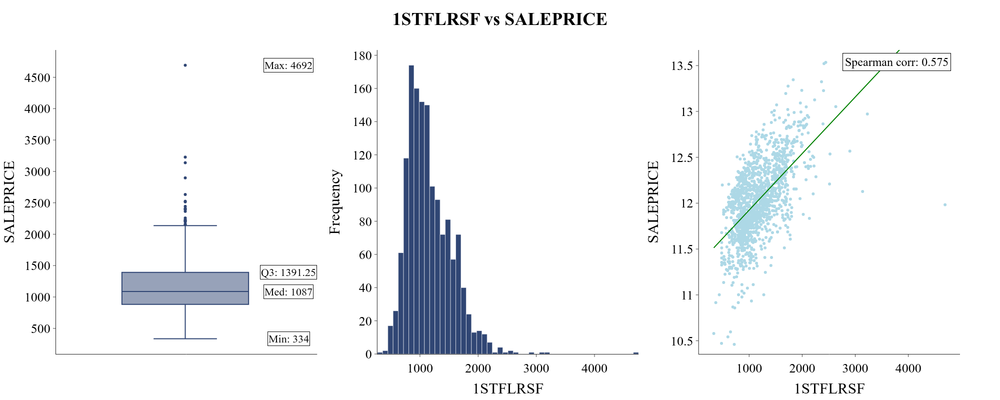

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
1STFLRSF,"1,460","1,162.63",386.59,334.00,672.95,882.00,"1,087.00","1,391.25","1,831.25","4,692.00","149,450.08",1.38,5.75,0,0.00%


In [52]:
feature = "1STFLRSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.377, kurtosis=5.746), with median 1,087 vs. mean 1,163 and range [334, 4,692].
- No missing values; 20 IQR-based outliers (1.37%, bounds [118.1, 2,155.1]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.575, Pearson r=0.597).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.575) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `2NDFLRSF`

`2NDFLRSF` (int64) - Second floor square footage.

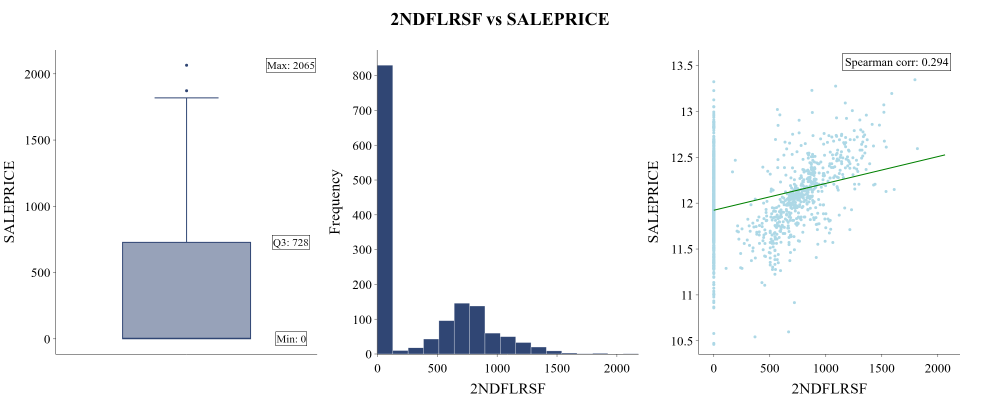

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
2NDFLRSF,"1,460",346.99,436.53,0.00,0.00,0.00,0.00,728.00,"1,141.05","2,065.00","190,557.08",0.81,-0.55,0,0.00%


In [53]:
feature = "2NDFLRSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.813, kurtosis=-0.553), with median 0 vs. mean 347 and range [0, 2,065].
- No missing values; 2 IQR-based outliers (0.14%, bounds [-1,092.0, 1,820.0]), 56.78% of values are exactly zero.
- Weak positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.294, Pearson r=0.319).

**Conclusion:**

- Heavily zero-inflated (56.78% zeros) — a binary 'has_2ndflrsf' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `LOWQUALFINSF`

`LOWQUALFINSF` (int64) - Low quality finished square footage across all floors.

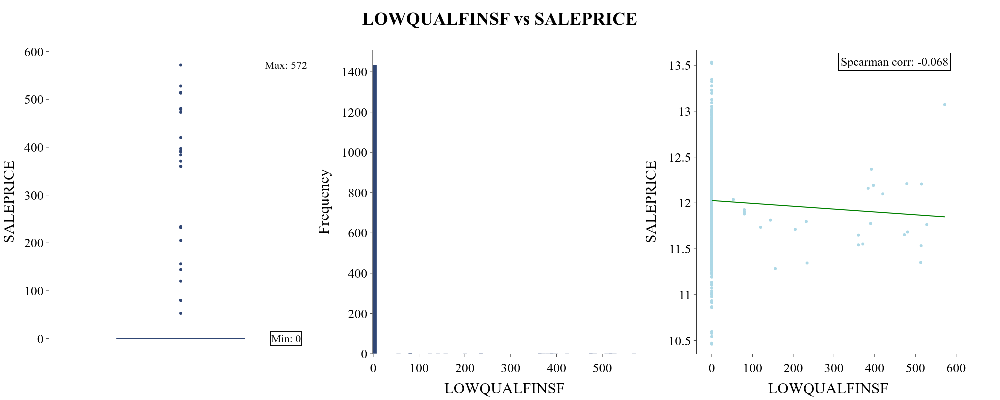

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
LOWQUALFINSF,"1,460",5.84,48.62,0.00,0.00,0.00,0.00,0.00,0.00,572.00,"2,364.20",9.01,83.23,0,0.00%


In [54]:
feature = "LOWQUALFINSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=9.011, kurtosis=83.235), with median 0 vs. mean 6 and range [0, 572].
- No missing values; 26 IQR-based outliers (1.78%, bounds [0.0, 0.0]), 98.22% of values are exactly zero.
- Negligible negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.068, Pearson r=-0.038).

**Conclusion:**

- Heavily zero-inflated (98.22% zeros) — a binary 'has_lowqualfinsf' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `GRLIVAREA`

`GRLIVAREA` (int64) - Above-grade (ground) living area square footage.

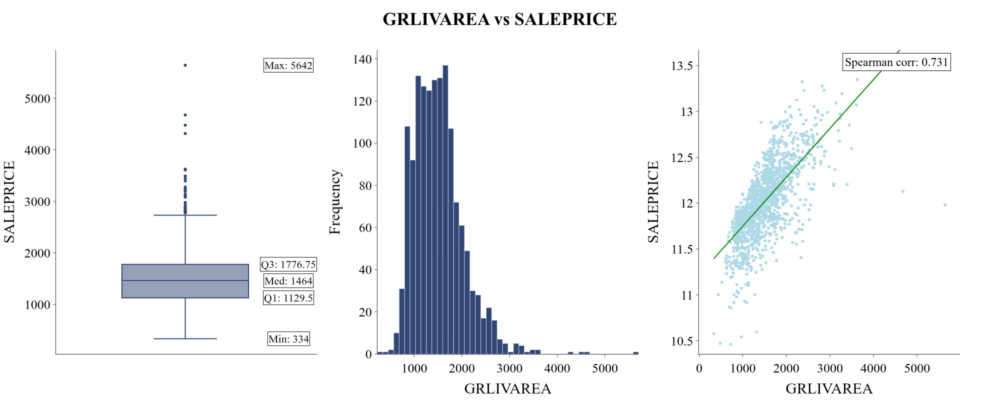

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
GRLIVAREA,"1,460","1,515.46",525.48,334.00,848.00,"1,129.50","1,464.00","1,776.75","2,466.10","5,642.00","276,129.63",1.37,4.90,0,0.00%


In [55]:
feature = "GRLIVAREA"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.367, kurtosis=4.895), with median 1,464 vs. mean 1,515 and range [334, 5,642].
- No missing values; 31 IQR-based outliers (2.12%, bounds [158.6, 2,747.6]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.731, Pearson r=0.701).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.731) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `BSMTFULLBATH`

`BSMTFULLBATH` (int64) - Number of full bathrooms in the basement.

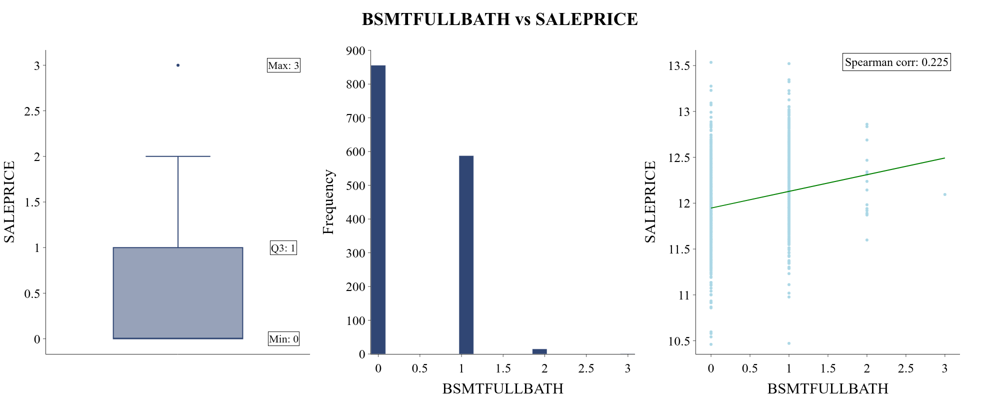

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BSMTFULLBATH,"1,460",0.43,0.52,0.00,0.00,0.00,0.00,1.00,1.00,3.00,0.27,0.60,-0.84,0,0.00%


In [56]:
feature = "BSMTFULLBATH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.596, kurtosis=-0.839), with median 0 vs. mean 0 and range [0, 3].
- No missing values; 1 IQR-based outlier (0.07%, bounds [-1.5, 2.5]), 58.63% of values are exactly zero.
- Weak positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.225, Pearson r=0.236).

**Conclusion:**

- Heavily zero-inflated (58.63% zeros) — a binary 'has_bsmtfullbath' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `BSMTHALFBATH`

`BSMTHALFBATH` (int64) - Number of half bathrooms in the basement.

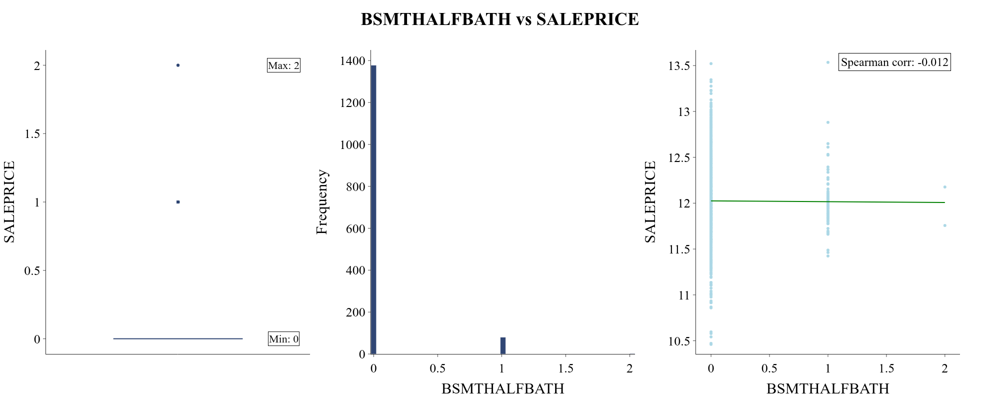

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BSMTHALFBATH,"1,460",0.06,0.24,0.00,0.00,0.00,0.00,0.00,1.00,2.00,0.06,4.10,16.40,0,0.00%


In [57]:
feature = "BSMTHALFBATH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=4.103, kurtosis=16.397), with median 0 vs. mean 0 and range [0, 2].
- No missing values; 82 IQR-based outliers (5.62%, bounds [0.0, 0.0]), 94.38% of values are exactly zero.
- Negligible negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.012, Pearson r=-0.005).

**Conclusion:**

- Heavily zero-inflated (94.38% zeros) — a binary 'has_bsmthalfbath' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Notable outlier share (5.62%, bounds [0.0, 0.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `FULLBATH`

`FULLBATH` (int64) - Number of full bathrooms above grade.

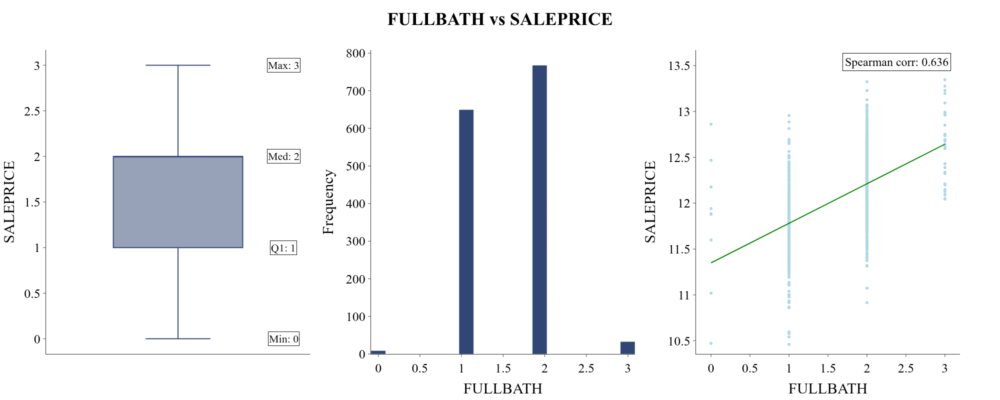

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
FULLBATH,"1,460",1.57,0.55,0.00,1.00,1.00,2.00,2.00,2.00,3.00,0.30,0.04,-0.86,0,0.00%


In [58]:
feature = "FULLBATH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.037, kurtosis=-0.857), with median 2 vs. mean 2 and range [0, 3].
- No missing values; no IQR-based outliers.
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.636, Pearson r=0.595).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.636) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `HALFBATH`

`HALFBATH` (int64) - Number of half bathrooms above grade.

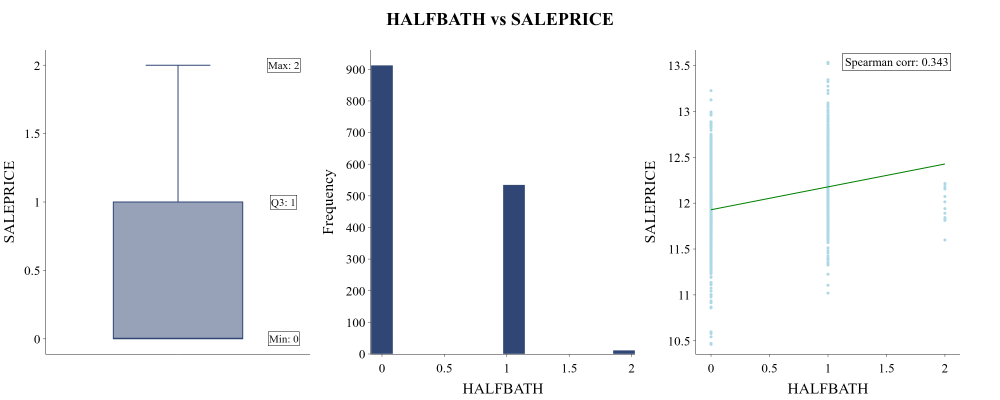

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
HALFBATH,"1,460",0.38,0.50,0.00,0.00,0.00,0.00,1.00,1.00,2.00,0.25,0.68,-1.08,0,0.00%


In [59]:
feature = "HALFBATH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.676, kurtosis=-1.077), with median 0 vs. mean 0 and range [0, 2].
- No missing values; no IQR-based outliers, 62.53% of values are exactly zero.
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.343, Pearson r=0.314).

**Conclusion:**

- Heavily zero-inflated (62.53% zeros) — a binary 'has_halfbath' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `BEDROOMABVGR`

`BEDROOMABVGR` (int64) - Number of bedrooms above grade (excludes basement bedrooms).

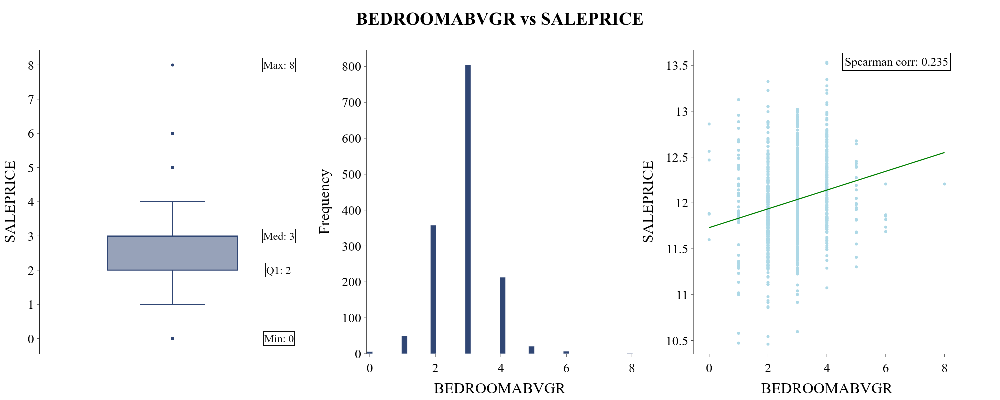

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
BEDROOMABVGR,"1,460",2.87,0.82,0.00,2.00,2.00,3.00,3.00,4.00,8.00,0.67,0.21,2.23,0,0.00%


In [60]:
feature = "BEDROOMABVGR"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.212, kurtosis=2.231), with median 3 vs. mean 3 and range [0, 8].
- No missing values; 35 IQR-based outliers (2.4%, bounds [0.5, 4.5]).
- Weak positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.235, Pearson r=0.209).

## `KITCHENABVGR`

`KITCHENABVGR` (int64) - Number of kitchens above grade.

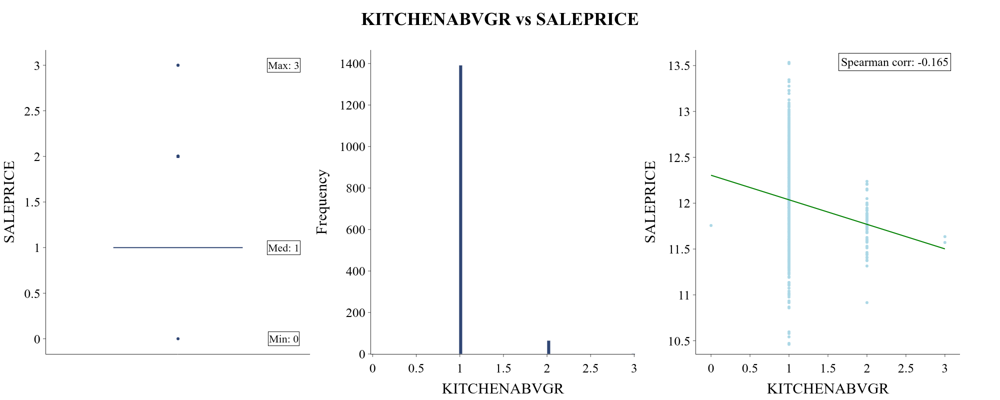

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
KITCHENABVGR,"1,460",1.05,0.22,0.00,1.00,1.00,1.00,1.00,1.00,3.00,0.05,4.49,21.53,0,0.00%


In [61]:
feature = "KITCHENABVGR"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=4.488, kurtosis=21.532), with median 1 vs. mean 1 and range [0, 3].
- No missing values; 68 IQR-based outliers (4.66%, bounds [1.0, 1.0]).
- Weak negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.165, Pearson r=-0.148).

## `KITCHENQUAL`

`KITCHENQUAL` (str) - Kitchen quality rating.

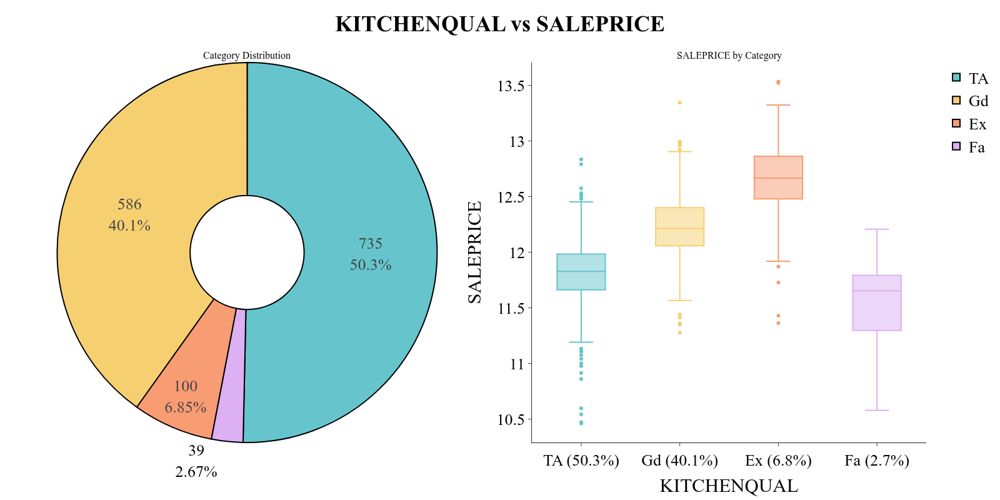

,Category,Count,Percentage (%)
0,TA,735,50.34%
1,Gd,586,40.14%
2,Ex,100,6.85%
3,Fa,39,2.67%


In [62]:
feature = "KITCHENQUAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: TA (50.34%), Gd (40.14%), Ex (6.85%).
- No missing values; no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.500 for 'Fa' to 12.600 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `TOTRMSABVGRD`

`TOTRMSABVGRD` (int64) - Total rooms above grade (excludes bathrooms).

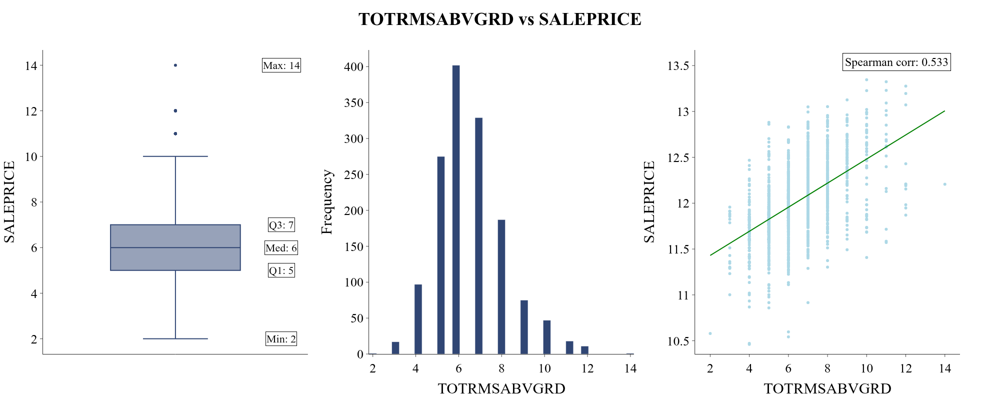

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
TOTRMSABVGRD,"1,460",6.52,1.63,2.00,4.00,5.00,6.00,7.00,10.00,14.00,2.64,0.68,0.88,0,0.00%


In [63]:
feature = "TOTRMSABVGRD"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.676, kurtosis=0.881), with median 6 vs. mean 7 and range [2, 14].
- No missing values; 30 IQR-based outliers (2.05%, bounds [2.0, 10.0]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.533, Pearson r=0.534).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.533) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `FUNCTIONAL`

`FUNCTIONAL` (str) - Home functionality rating (typical, or various levels of deductions).

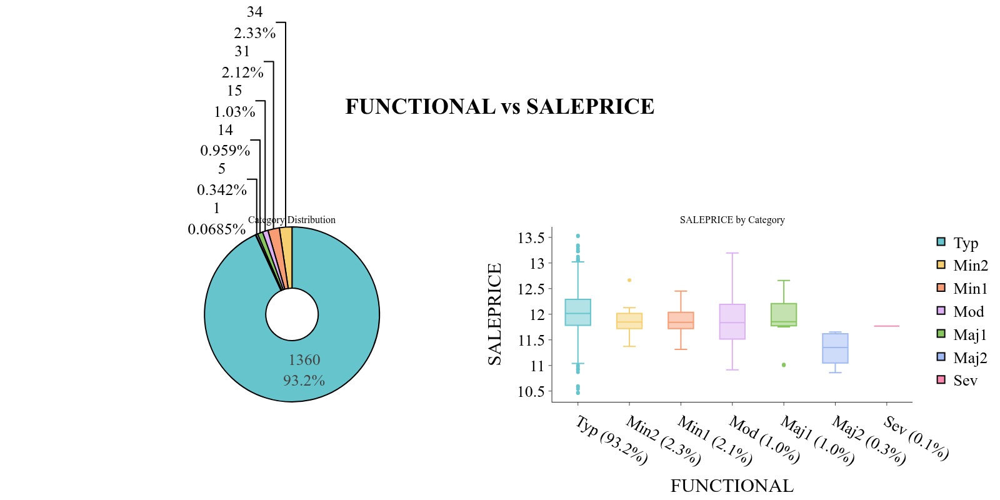

,Category,Count,Percentage (%)
0,Typ,"1,360",93.15%
1,Min2,34,2.33%
2,Min1,31,2.12%
3,Mod,15,1.03%
4,Maj1,14,0.96%
5,Maj2,5,0.34%
6,Sev,1,0.07%


In [64]:
feature = "FUNCTIONAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 7 unique categories; most frequent: Typ (93.15%), Min2 (2.33%), Min1 (2.12%).
- No missing values; 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.300 for 'Maj2' to 12.000 for 'Typ', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.
- 3 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `FIREPLACES`

`FIREPLACES` (int64) - Number of fireplaces.

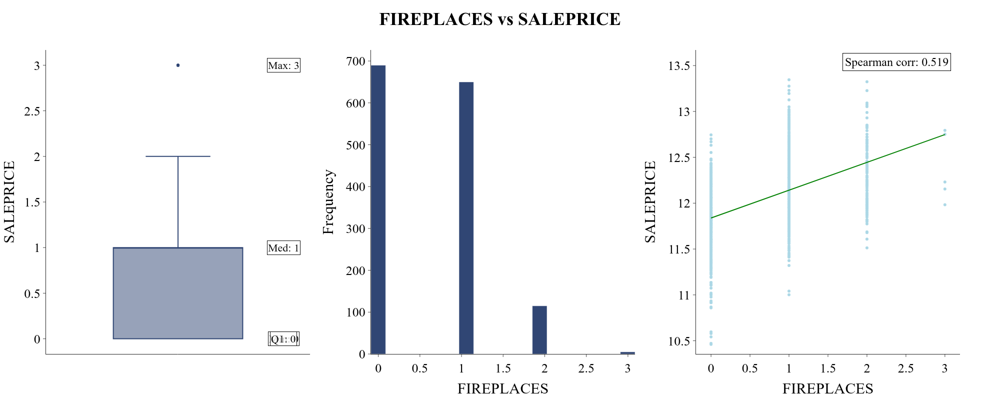

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
FIREPLACES,"1,460",0.61,0.64,0.00,0.00,0.00,1.00,1.00,2.00,3.00,0.42,0.65,-0.22,0,0.00%


In [65]:
feature = "FIREPLACES"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately right-skewed (skew=0.65, kurtosis=-0.217), with median 1 vs. mean 1 and range [0, 3].
- No missing values; 5 IQR-based outliers (0.34%, bounds [-1.5, 2.5]), 47.26% of values are exactly zero.
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.519, Pearson r=0.489).

**Conclusion:**

- Heavily zero-inflated (47.26% zeros) — a binary 'has_fireplaces' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.519) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `FIREPLACEQU`

`FIREPLACEQU` (str) - Fireplace quality.

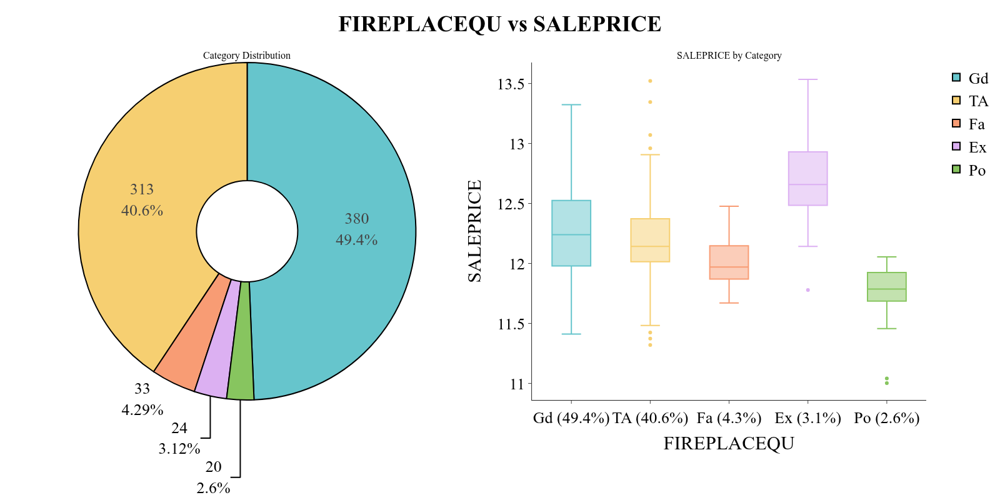

,Category,Count,Percentage (%)
0,nan,690,47.26%
1,Gd,380,26.03%
2,TA,313,21.44%
3,Fa,33,2.26%
4,Ex,24,1.64%
5,Po,20,1.37%


In [66]:
feature = "FIREPLACEQU"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: Gd (26.03%), TA (21.44%), Fa (2.26%).
- 690 missing values (47.26%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for 'Po' to 12.700 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (47.26%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `GARAGETYPE`

`GARAGETYPE` (str) - Garage location/type (attached, detached, built-in, etc.).

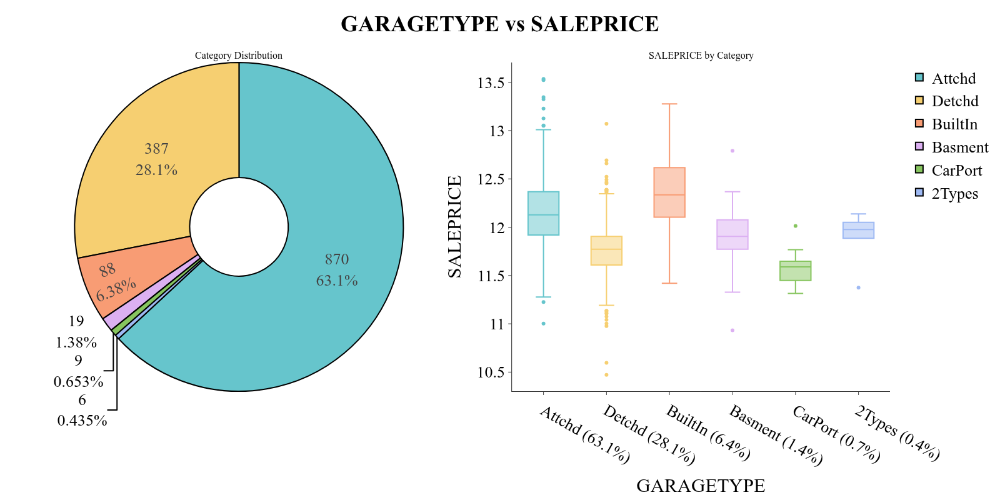

,Category,Count,Percentage (%)
0,Attchd,870,59.59%
1,Detchd,387,26.51%
2,BuiltIn,88,6.03%
3,nan,81,5.55%
4,Basment,19,1.30%
5,CarPort,9,0.62%
6,2Types,6,0.41%


In [67]:
feature = "GARAGETYPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: Attchd (59.59%), Detchd (26.51%), BuiltIn (6.03%).
- 81 missing values (5.55%); 2 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for 'CarPort' to 12.400 for 'BuiltIn', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (5.55%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- 2 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `GARAGEYRBLT`

`GARAGEYRBLT` (float64) - Year the garage was built.

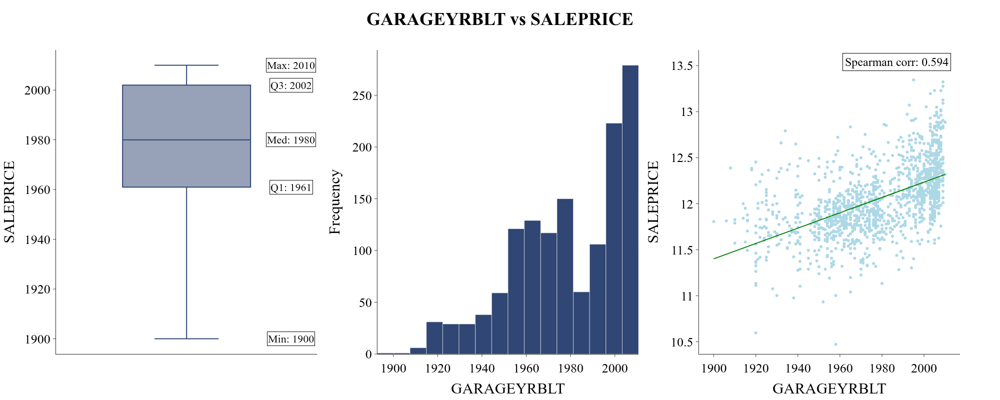

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
GARAGEYRBLT,"1,379","1,978.51",24.69,"1,900.00","1,930.00","1,961.00","1,980.00","2,002.00","2,007.00","2,010.00",609.58,-0.65,-0.42,81,5.55%


In [68]:
feature = "GARAGEYRBLT"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is moderately left-skewed (skew=-0.649, kurtosis=-0.418), with median 1,980 vs. mean 1,979 and range [1,900, 2,010].
- 81 missing values (5.55%); no IQR-based outliers.
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.594, Pearson r=0.541).

**Conclusion:**

- Missingness (5.55%) reflects structural absence (no garage) rather than randomness, so a dedicated 'missing' sentinel/flag preserves that signal for the tree splits instead of being smoothed away by mean/median imputation.
- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.594) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `GARAGEFINISH`

`GARAGEFINISH` (str) - Interior finish quality of the garage.

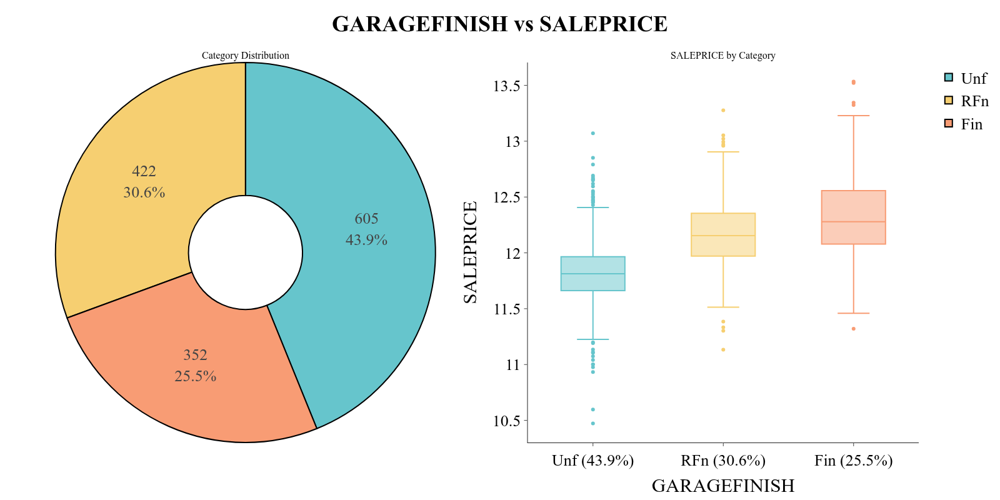

,Category,Count,Percentage (%)
0,Unf,605,41.44%
1,RFn,422,28.90%
2,Fin,352,24.11%
3,nan,81,5.55%


In [69]:
feature = "GARAGEFINISH"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 3 unique categories; most frequent: Unf (41.44%), RFn (28.9%), Fin (24.11%).
- 81 missing values (5.55%); no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'Unf' to 12.300 for 'Fin', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (5.55%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `GARAGECARS`

`GARAGECARS` (int64) - Size of garage in car capacity.

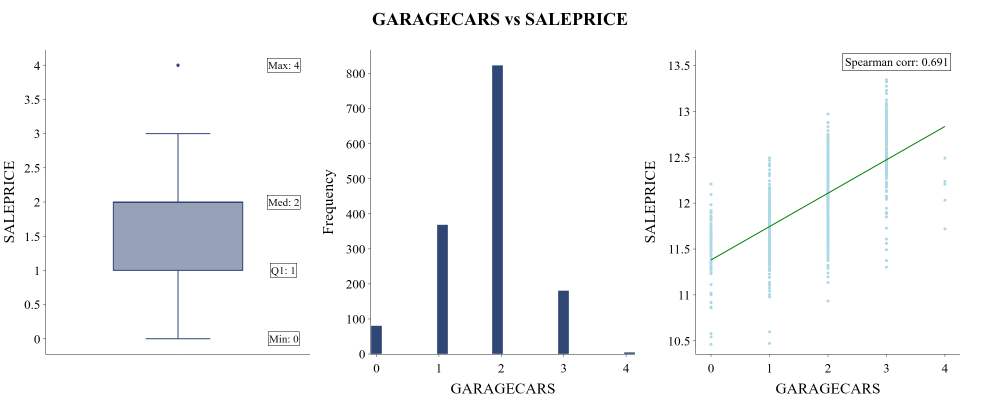

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
GARAGECARS,"1,460",1.77,0.75,0.00,0.00,1.00,2.00,2.00,3.00,4.00,0.56,-0.34,0.22,0,0.00%


In [70]:
feature = "GARAGECARS"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=-0.343, kurtosis=0.221), with median 2 vs. mean 2 and range [0, 4].
- No missing values; 5 IQR-based outliers (0.34%, bounds [-0.5, 3.5]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.691, Pearson r=0.681).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.691) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `GARAGEAREA`

`GARAGEAREA` (int64) - Size of garage in square feet.

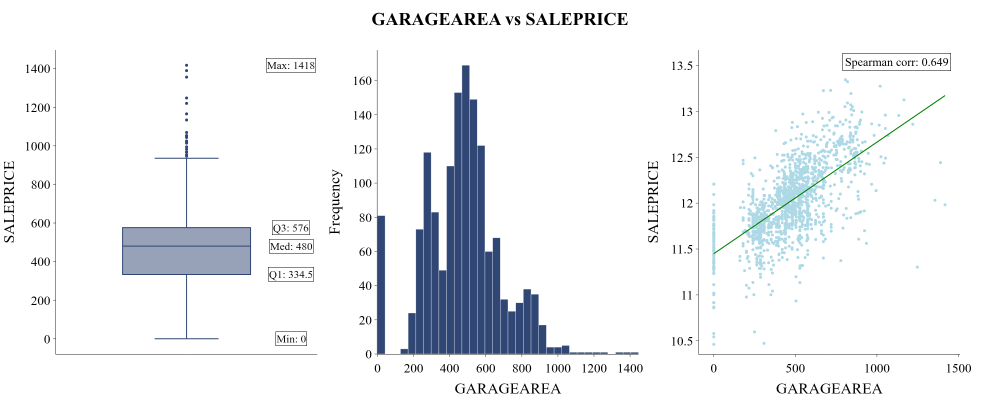

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
GARAGEAREA,"1,460",472.98,213.80,0.00,0.00,334.50,480.00,576.00,850.10,"1,418.00","45,712.51",0.18,0.92,0,0.00%


In [71]:
feature = "GARAGEAREA"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.18, kurtosis=0.917), with median 480 vs. mean 473 and range [0, 1,418].
- No missing values; 21 IQR-based outliers (1.44%, bounds [-27.8, 938.2]).
- Strong positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.649, Pearson r=0.651).

**Conclusion:**

- Strong monotonic association with log1p(SALEPRICE) (Spearman ρ=0.649) makes this a reliable early split candidate; pairing it with other top predictors (e.g. OverallQual) as an interaction feature could let boosted trees exploit the joint effect more directly.

## `GARAGEQUAL`

`GARAGEQUAL` (str) - Garage quality rating.

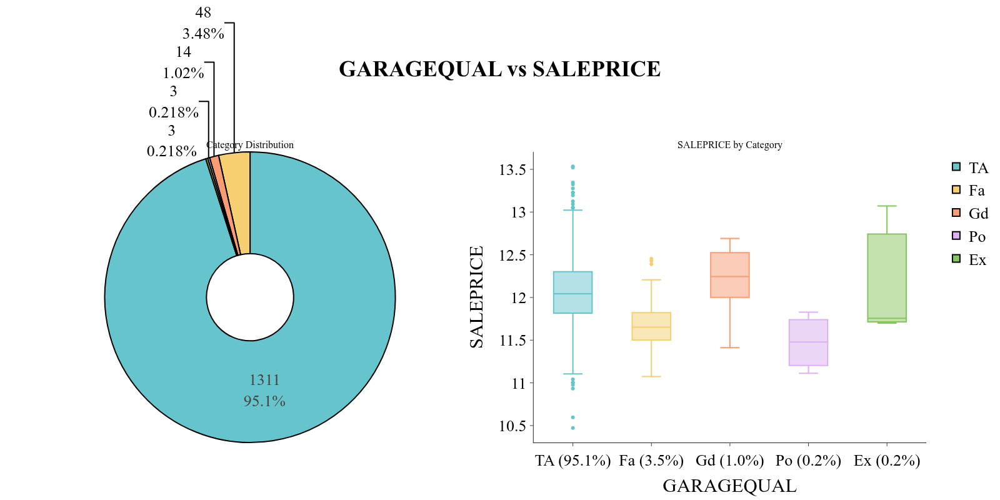

,Category,Count,Percentage (%)
0,TA,"1,311",89.79%
1,nan,81,5.55%
2,Fa,48,3.29%
3,Gd,14,0.96%
4,Ex,3,0.21%
5,Po,3,0.21%


In [72]:
feature = "GARAGEQUAL"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: TA (89.79%), Fa (3.29%), Gd (0.96%).
- 81 missing values (5.55%); 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.500 for 'Po' to 12.200 for 'Gd', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (5.55%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `GARAGECOND`

`GARAGECOND` (str) - Garage condition rating.

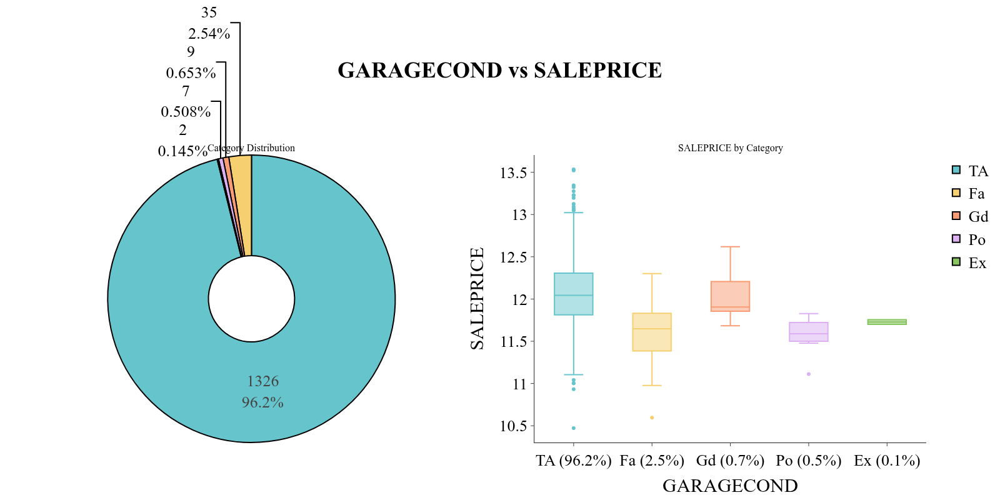

,Category,Count,Percentage (%)
0,TA,"1,326",90.82%
1,nan,81,5.55%
2,Fa,35,2.40%
3,Gd,9,0.62%
4,Po,7,0.48%
5,Ex,2,0.14%


In [73]:
feature = "GARAGECOND"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 5 unique categories; most frequent: TA (90.82%), Fa (2.4%), Gd (0.62%).
- 81 missing values (5.55%); 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for 'Po' to 12.100 for 'TA', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (5.55%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `PAVEDDRIVE`

`PAVEDDRIVE` (str) - Whether the driveway is paved.

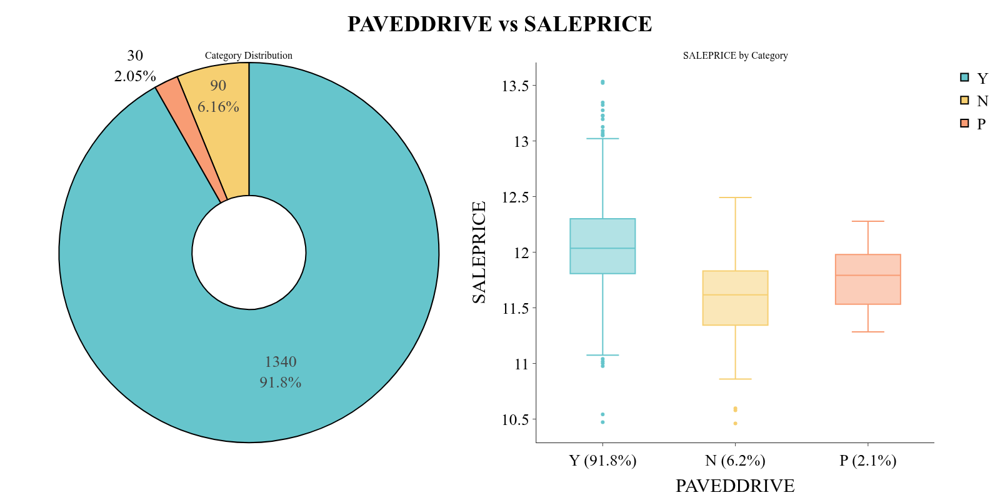

,Category,Count,Percentage (%)
0,Y,"1,340",91.78%
1,N,90,6.16%
2,P,30,2.05%


In [74]:
feature = "PAVEDDRIVE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 3 unique categories; most frequent: Y (91.78%), N (6.16%), P (2.05%).
- No missing values; no categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.600 for 'N' to 12.100 for 'Y', vs. an overall mean of 12.000.

**Conclusion:**

- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `WOODDECKSF`

`WOODDECKSF` (int64) - Wood deck area in square feet.

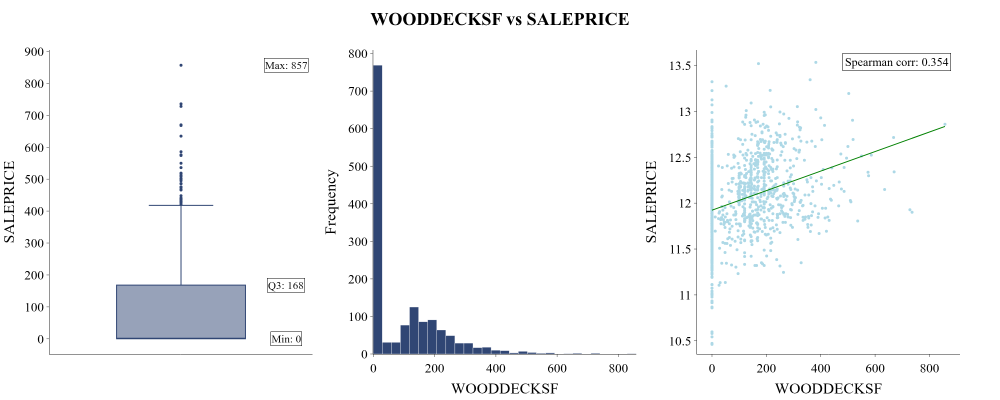

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
WOODDECKSF,"1,460",94.24,125.34,0.00,0.00,0.00,0.00,168.00,335.00,857.00,"15,709.81",1.54,2.99,0,0.00%


In [75]:
feature = "WOODDECKSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=1.541, kurtosis=2.993), with median 0 vs. mean 94 and range [0, 857].
- No missing values; 32 IQR-based outliers (2.19%, bounds [-252.0, 420.0]), 52.12% of values are exactly zero.
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.354, Pearson r=0.334).

**Conclusion:**

- Heavily zero-inflated (52.12% zeros) — a binary 'has_wooddecksf' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `OPENPORCHSF`

`OPENPORCHSF` (int64) - Open porch area in square feet.

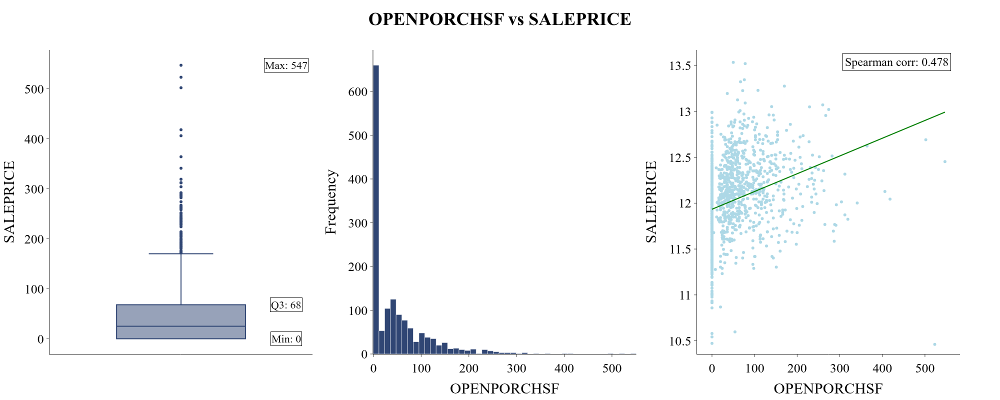

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
OPENPORCHSF,"1,460",46.66,66.26,0.00,0.00,0.00,25.00,68.00,175.05,547.00,"4,389.86",2.36,8.49,0,0.00%


In [76]:
feature = "OPENPORCHSF"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=2.364, kurtosis=8.49), with median 25 vs. mean 47 and range [0, 547].
- No missing values; 77 IQR-based outliers (5.27%, bounds [-102.0, 170.0]), 44.93% of values are exactly zero.
- Moderate positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.478, Pearson r=0.321).

**Conclusion:**

- Heavily zero-inflated (44.93% zeros) — a binary 'has_openporchsf' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Notable outlier share (5.27%, bounds [-102.0, 170.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `ENCLOSEDPORCH`

`ENCLOSEDPORCH` (int64) - Enclosed porch area in square feet.

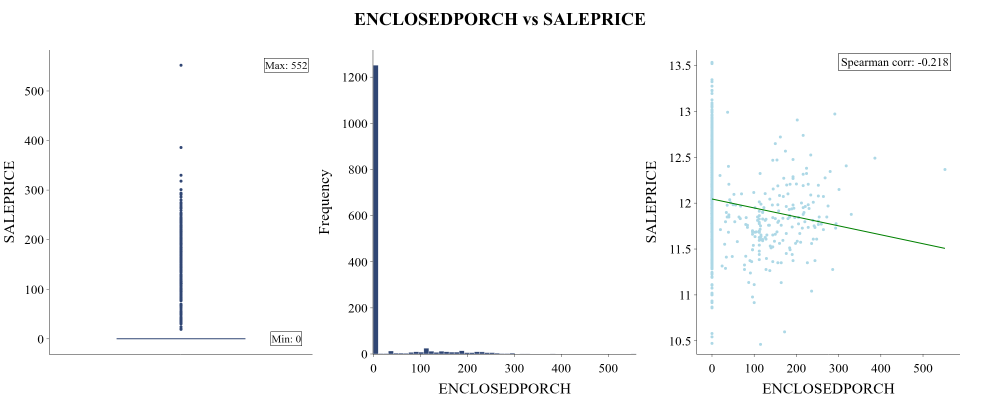

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
ENCLOSEDPORCH,"1,460",21.95,61.12,0.00,0.00,0.00,0.00,0.00,180.15,552.00,"3,735.55",3.09,10.43,0,0.00%


In [77]:
feature = "ENCLOSEDPORCH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=3.09, kurtosis=10.431), with median 0 vs. mean 22 and range [0, 552].
- No missing values; 208 IQR-based outliers (14.25%, bounds [0.0, 0.0]), 85.75% of values are exactly zero.
- Weak negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.218, Pearson r=-0.149).

**Conclusion:**

- Heavily zero-inflated (85.75% zeros) — a binary 'has_enclosedporch' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Notable outlier share (14.25%, bounds [0.0, 0.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `3SSNPORCH`

`3SSNPORCH` (int64) - Three-season porch area in square feet.

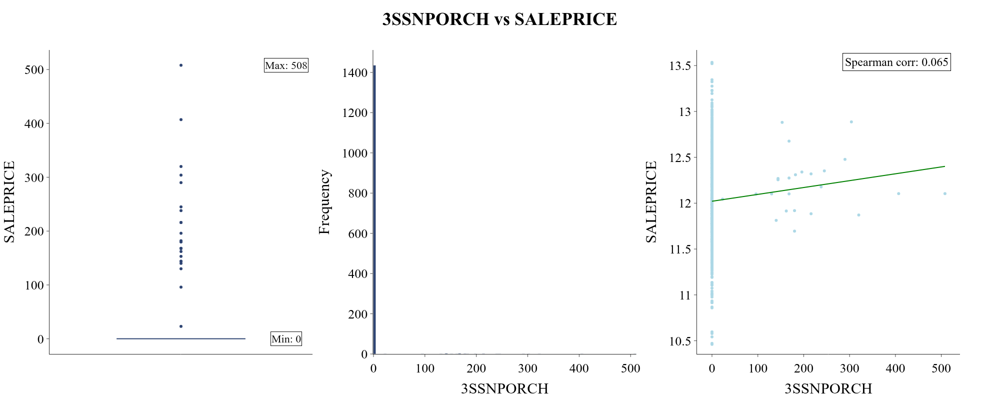

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
3SSNPORCH,"1,460",3.41,29.32,0.00,0.00,0.00,0.00,0.00,0.00,508.00,859.51,10.30,123.66,0,0.00%


In [78]:
feature = "3SSNPORCH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=10.304, kurtosis=123.662), with median 0 vs. mean 3 and range [0, 508].
- No missing values; 24 IQR-based outliers (1.64%, bounds [0.0, 0.0]), 98.36% of values are exactly zero.
- Negligible positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.065, Pearson r=0.055).

**Conclusion:**

- Heavily zero-inflated (98.36% zeros) — a binary 'has_3ssnporch' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `SCREENPORCH`

`SCREENPORCH` (int64) - Screen porch area in square feet.

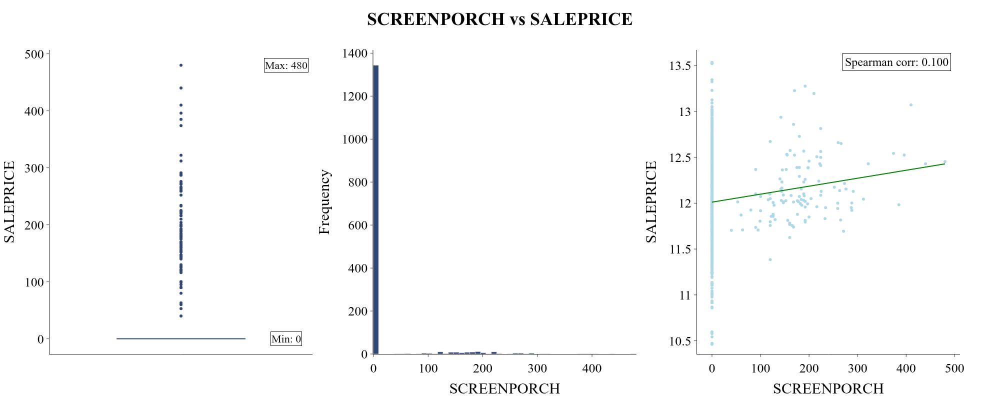

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
SCREENPORCH,"1,460",15.06,55.76,0.00,0.00,0.00,0.00,0.00,160.00,480.00,"3,108.89",4.12,18.44,0,0.00%


In [79]:
feature = "SCREENPORCH"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=4.122, kurtosis=18.439), with median 0 vs. mean 15 and range [0, 480].
- No missing values; 116 IQR-based outliers (7.95%, bounds [0.0, 0.0]), 92.05% of values are exactly zero.
- Weak positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.1, Pearson r=0.121).

**Conclusion:**

- Heavily zero-inflated (92.05% zeros) — a binary 'has_screenporch' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.
- Notable outlier share (7.95%, bounds [0.0, 0.0]) suggests capping/winsorizing the extreme values, since a handful of high-leverage points can otherwise dominate MSE-based split thresholds in shallow leaves.

## `POOLAREA`

`POOLAREA` (int64) - Pool area in square feet.

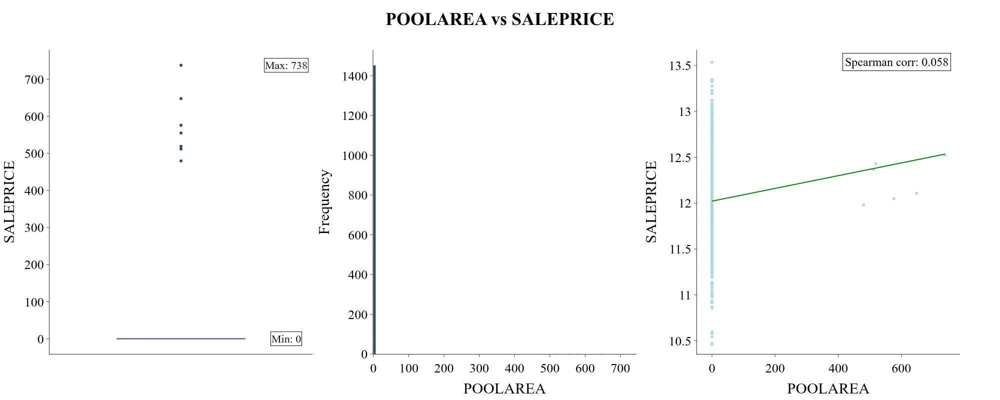

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
POOLAREA,"1,460",2.76,40.18,0.00,0.00,0.00,0.00,0.00,0.00,738.00,"1,614.22",14.83,223.27,0,0.00%


In [80]:
feature = "POOLAREA"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=14.828, kurtosis=223.268), with median 0 vs. mean 3 and range [0, 738].
- No missing values; 7 IQR-based outliers (0.48%, bounds [0.0, 0.0]), 99.52% of values are exactly zero.
- Negligible positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.058, Pearson r=0.07).

**Conclusion:**

- Heavily zero-inflated (99.52% zeros) — a binary 'has_poolarea' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `POOLQC`

`POOLQC` (str) - Pool quality rating.

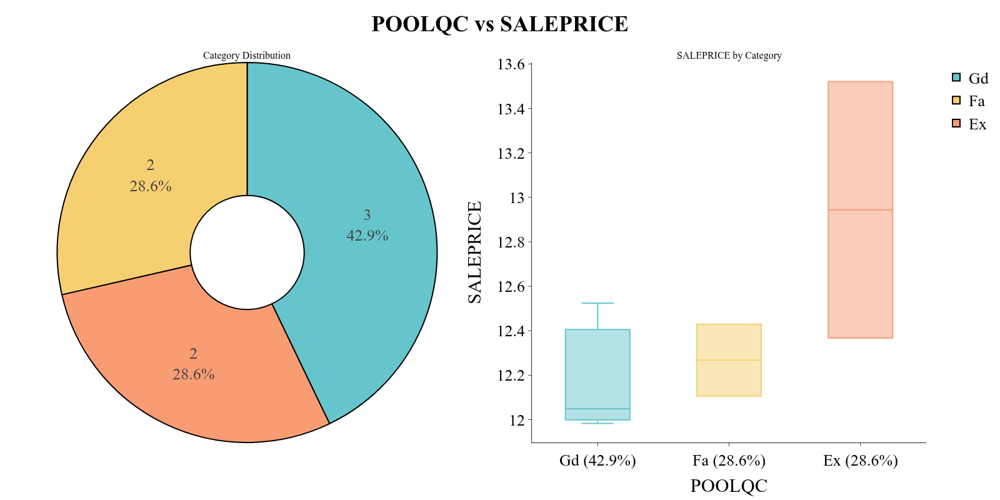

,Category,Count,Percentage (%)
0,nan,"1,453",99.52%
1,Gd,3,0.21%
2,Ex,2,0.14%
3,Fa,2,0.14%


In [81]:
feature = "POOLQC"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 3 unique categories; most frequent: Gd (0.21%), Ex (0.14%), Fa (0.14%).
- 1,453 missing values (99.52%); 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 12.200 for 'Gd' to 12.900 for 'Ex', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (99.52%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `FENCE`

`FENCE` (str) - Fence quality rating.

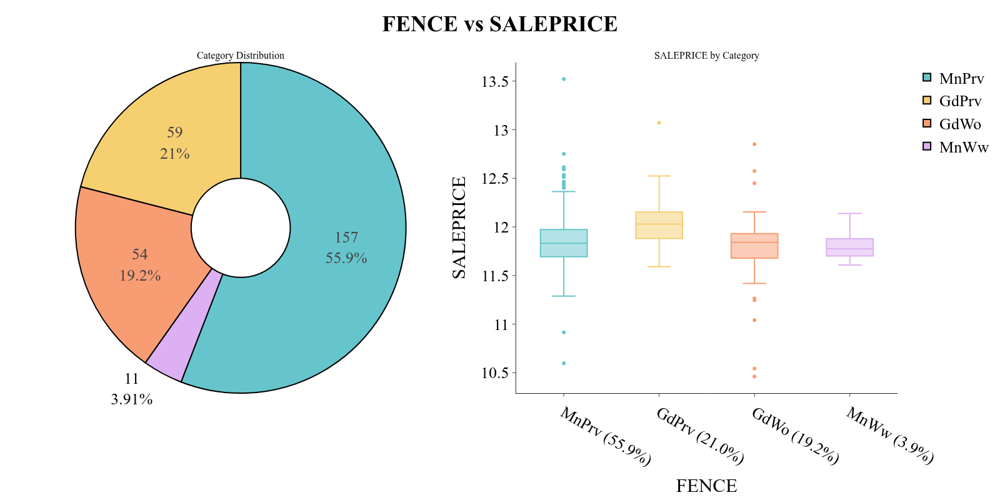

,Category,Count,Percentage (%)
0,nan,"1,179",80.75%
1,MnPrv,157,10.75%
2,GdPrv,59,4.04%
3,GdWo,54,3.70%
4,MnWw,11,0.75%


In [82]:
feature = "FENCE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: MnPrv (10.75%), GdPrv (4.04%), GdWo (3.7%).
- 1,179 missing values (80.75%); 1 category below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.800 for 'GdWo' to 12.100 for 'GdPrv', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (80.75%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- Categories follow a natural quality/condition ranking, so an ordinal encoding that preserves that order would let a GBM capture the monotonic effect in a single split per threshold, rather than needing several splits to reconstruct the ranking from an unordered one-hot encoding.

## `MISCFEATURE`

`MISCFEATURE` (str) - Miscellaneous feature not covered in other categories (e.g., shed, tennis court).

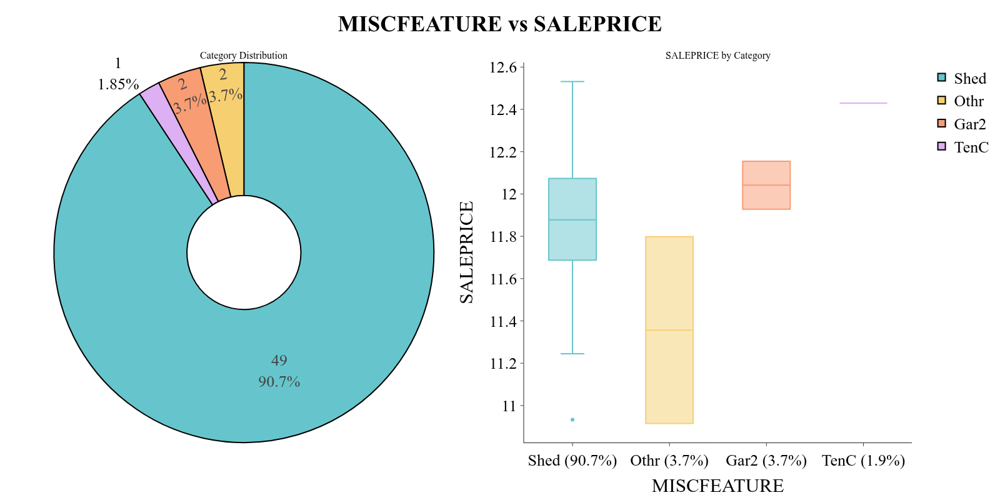

,Category,Count,Percentage (%)
0,nan,"1,406",96.30%
1,Shed,49,3.36%
2,Gar2,2,0.14%
3,Othr,2,0.14%
4,TenC,1,0.07%


In [83]:
feature = "MISCFEATURE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 4 unique categories; most frequent: Shed (3.36%), Gar2 (0.14%), Othr (0.14%).
- 1,406 missing values (96.3%); 3 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.400 for 'Othr' to 12.400 for 'TenC', vs. an overall mean of 12.000.

**Conclusion:**

- Missingness (96.3%) represents structural absence of the feature rather than a random gap, so encoding NaN as its own 'None' category preserves that signal for trees to split on directly instead of imputing it away with the mode.
- 3 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `MISCVAL`

`MISCVAL` (int64) - Dollar value of the miscellaneous feature.

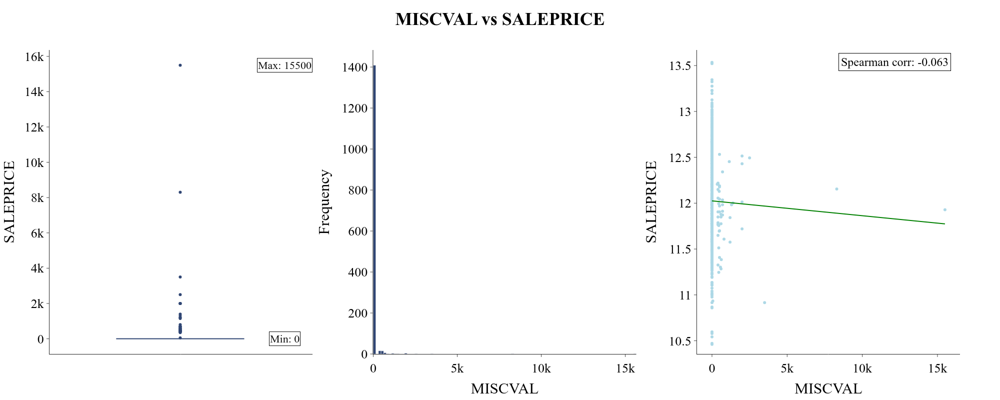

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
MISCVAL,"1,460",43.49,496.12,0.00,0.00,0.00,0.00,0.00,0.00,"15,500.00","246,138.06",24.48,701.00,0,0.00%


In [84]:
feature = "MISCVAL"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is strongly right-skewed (skew=24.477, kurtosis=701.003), with median 0 vs. mean 43 and range [0, 15,500].
- No missing values; 52 IQR-based outliers (3.56%, bounds [0.0, 0.0]), 96.44% of values are exactly zero.
- Negligible negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.063, Pearson r=-0.02).

**Conclusion:**

- Heavily zero-inflated (96.44% zeros) — a binary 'has_miscval' presence flag would let a single early split isolate the presence/absence effect, which is more efficient for a GBM than relying on several threshold splits within the zero-heavy range.

## `MOSOLD`

`MOSOLD` (int64) - Month the house was sold.

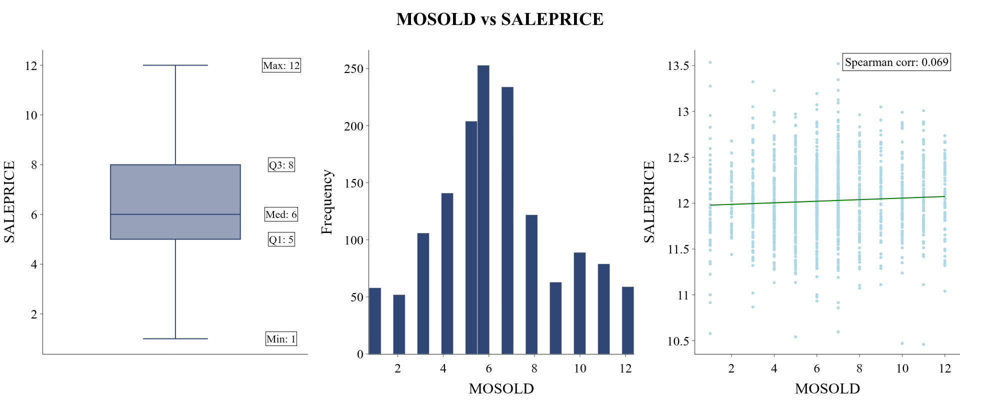

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
MOSOLD,"1,460",6.32,2.70,1.00,2.00,5.00,6.00,8.00,11.00,12.00,7.31,0.21,-0.40,0,0.00%


In [85]:
feature = "MOSOLD"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.212, kurtosis=-0.404), with median 6 vs. mean 6 and range [1, 12].
- No missing values; no IQR-based outliers.
- Negligible positive monotonic relationship with log1p(SALEPRICE) (Spearman ρ=0.069, Pearson r=0.057).

## `YRSOLD`

`YRSOLD` (int64) - Year the house was sold.

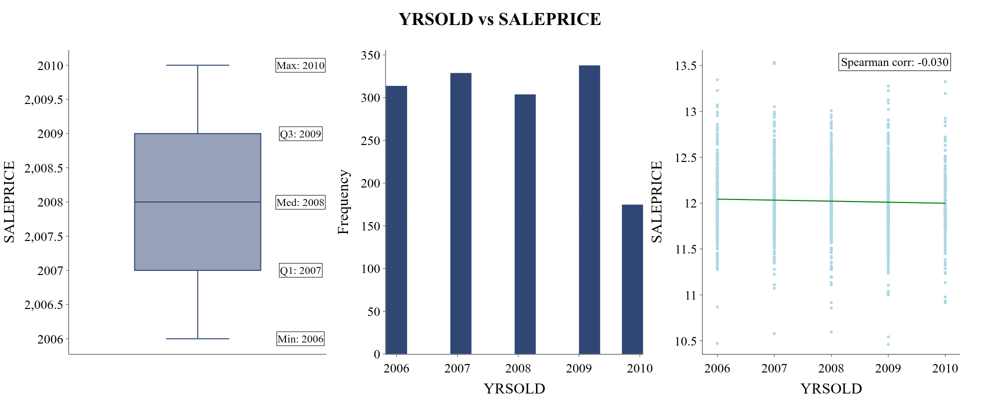

,Count,Mean,Std,Min,5%,Q1,Median,Q3,95%,Max,variance,skewness,kurtosis,Missing,Missing (%)
YRSOLD,"1,460","2,007.82",1.33,"2,006.00","2,006.00","2,007.00","2,008.00","2,009.00","2,010.00","2,010.00",1.76,0.10,-1.19,0,0.00%


In [86]:
feature = "YRSOLD"
continuous_plots.histogram_boxplot_linear_regression(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_numerical_feature(data, feature)

**Notes:**

- Distribution is approximately symmetric (skew=0.096, kurtosis=-1.191), with median 2,008 vs. mean 2,008 and range [2,006, 2,010].
- No missing values; no IQR-based outliers.
- Negligible negative monotonic relationship with log1p(SALEPRICE) (Spearman ρ=-0.03, Pearson r=-0.037).

## `SALETYPE`

`SALETYPE` (str) - Type of sale (warranty deed, new construction, court officer deed, etc.).

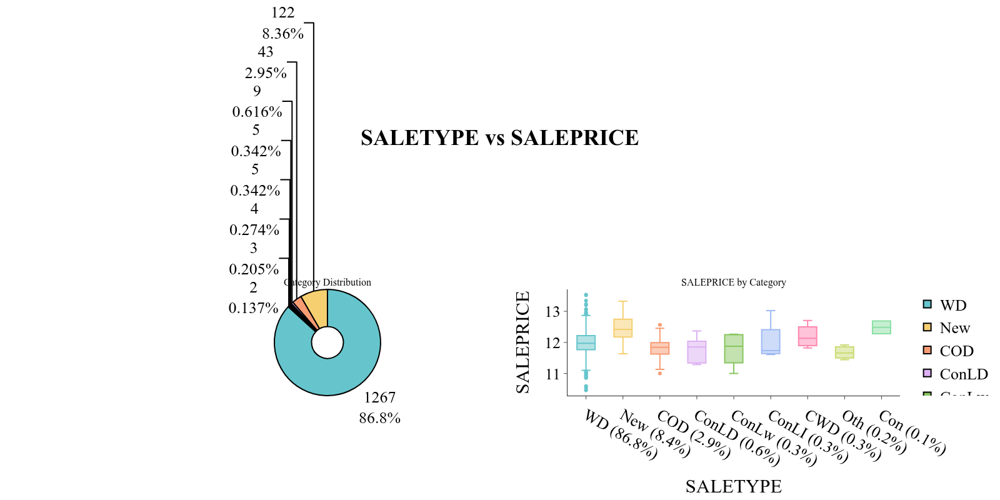

,Category,Count,Percentage (%)
0,WD,"1,267",86.78%
1,New,122,8.36%
2,COD,43,2.95%
3,ConLD,9,0.62%
4,ConLI,5,0.34%
5,ConLw,5,0.34%
6,CWD,4,0.27%
7,Oth,3,0.21%
8,Con,2,0.14%


In [87]:
feature = "SALETYPE"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 9 unique categories; most frequent: WD (86.78%), New (8.36%), COD (2.95%).
- No missing values; 6 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.700 for 'Oth' to 12.500 for 'Con', vs. an overall mean of 12.000.

**Conclusion:**

- 6 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## `SALECONDITION`

`SALECONDITION` (str) - Condition of sale (normal, abnormal, partial, family, etc.).

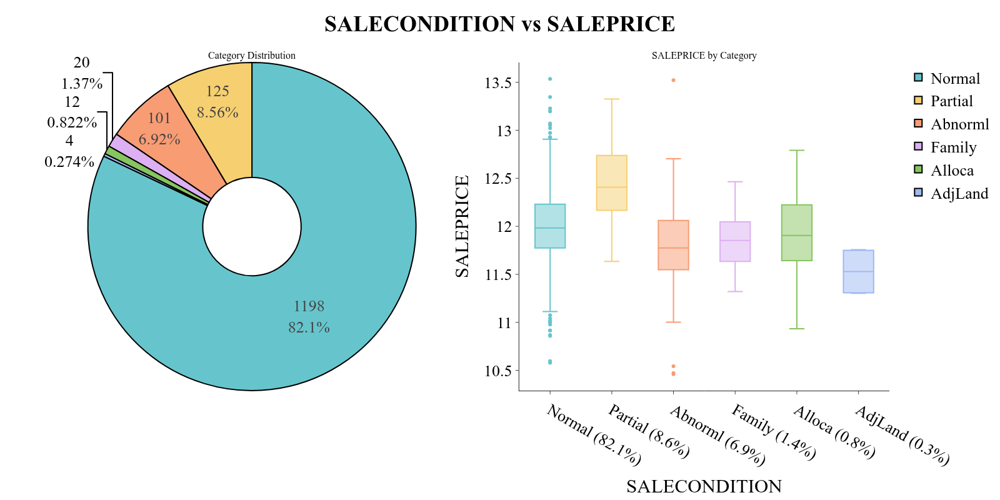

,Category,Count,Percentage (%)
0,Normal,"1,198",82.05%
1,Partial,125,8.56%
2,Abnorml,101,6.92%
3,Family,20,1.37%
4,Alloca,12,0.82%
5,AdjLand,4,0.27%


In [88]:
feature = "SALECONDITION"
categorical_plots.pie_boxplot_by_categorical(data, feature, TARGET_FEATURE, plot_title=f"{feature} vs {TARGET_FEATURE}")
data_analyzer.describe_categorical_feature(data, feature)

**Notes:**

- 6 unique categories; most frequent: Normal (82.05%), Partial (8.56%), Abnorml (6.92%).
- No missing values; 2 categories below 1% frequency.
- Mean log1p(SALEPRICE) ranges from 11.500 for 'AdjLand' to 12.400 for 'Partial', vs. an overall mean of 12.000.

**Conclusion:**

- 2 rare categories (each under 1% of rows) — grouping them into a single 'Other' bucket would reduce noisy, low-sample leaf splits for those levels.

## Data preparation for Multivariate analysis

In [89]:
def get_feature_groups(
    data: pd.DataFrame, target_feature: str
) -> tuple[list[str], list[str], list[str]]:
    """
    Splits a DataFrame's columns into independent, categorical, and numerical feature groups.

    Args:
        data (pd.DataFrame): The full dataset, including the target column.
        target_feature (str): Name of the target column to exclude from the feature groups.

    Returns:
        tuple[list[str], list[str], list[str]]: Independent, categorical, and numerical features.

    Raises:
        AssertionError: If categorical and numerical features do not together cover all
            independent features.
    """
    independent_feats = data.drop(columns=[target_feature]).columns.tolist()
    categorical_feats = find_categorical_variables(data[independent_feats], return_empty=True)
    numerical_feats = find_numerical_variables(data[independent_feats], return_empty=True)

    if set(categorical_feats) | set(numerical_feats) != set(independent_feats):
        raise AssertionError(
            "Categorical and numerical features do not cover all independent features."
        )

    return independent_feats, categorical_feats, numerical_feats

independent_features, categorical_features, numerical_features = get_feature_groups(train_data, TARGET_FEATURE)

In [90]:
imputation_pipeline = Pipeline(
    steps=[
        (
            "case_normalizer",
            CaseNormalizer(features_names=categorical_features, normalization="upper"),
        ),
        (
            "categorical_aligner",
            CategoricalAligner(
                categorical_features=categorical_features,
                fill_strategy="constant",
                default_value="MISSING",
                warn_on_unknown=False
            ),
        ),
        (
            "median_imputer",
            MeanMedianImputer(
                variables=numerical_features,
                imputation_method='median')
        ),
        (
            "numerical_downcaster",
            NumericalDowncaster()
        )
    ]
)

train_data[independent_features] = imputation_pipeline.fit_transform(train_data[independent_features])
test_data[independent_features] = imputation_pipeline.transform(test_data[independent_features])

## Mutual information

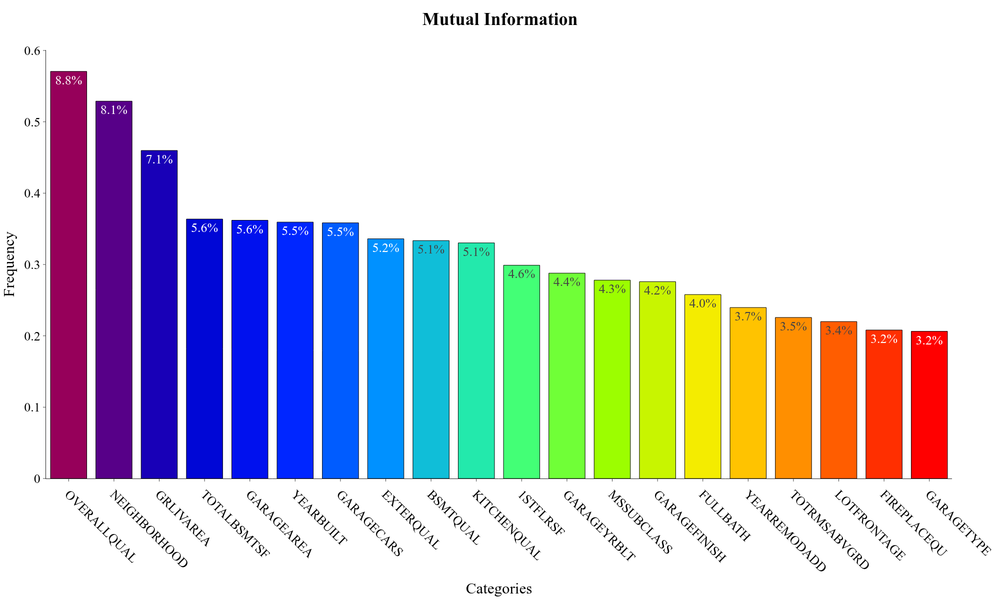

In [91]:
mi_scores = data_analyzer.mutual_information_scores(train_data[independent_features], train_data[TARGET_FEATURE], problem_type=PROBLEM_TYPE)
categorical_plots.barplot(mi_scores, plot_title="Mutual Information", top_n=20, show_other=False, tickangle=45, width=2000, height=1200)

# Statistical analysis

## Numerical features

In [92]:
data_analyzer.numerical_feature_statistics(train_data, numerical_features)

,Feature,Min,Mean,Median,Max,Std,Skewness,Kurtosis,Outliers IQR (%),Flags
0,MSSUBCLASS,20.000,56.897,50.000,190.000,42.301,1.408,1.580,103 (7.05%),HIGH RIGHT SKEW
1,LOTFRONTAGE,21.000,69.864,69.000,313.000,22.028,2.409,21.913,106 (7.26%),HIGH RIGHT SKEW; HEAVY TAILS
2,LOTAREA,1300.000,10516.828,9478.500,215245.000,9981.265,12.208,203.243,69 (4.73%),HIGH RIGHT SKEW; HEAVY TAILS
3,OVERALLQUAL,1.000,6.099,6.000,10.000,1.383,0.217,0.096,2 (0.14%),
4,OVERALLCOND,1.000,5.575,5.000,9.000,1.113,0.693,1.106,125 (8.56%),
5,YEARBUILT,1872.000,1971.268,1973.000,2010.000,30.203,-0.613,-0.440,7 (0.48%),
6,YEARREMODADD,1950.000,1984.866,1994.000,2010.000,20.645,-0.504,-1.272,0 (0.00%),
7,MASVNRAREA,0.000,103.117,0.000,1600.000,180.731,2.678,10.141,98 (6.71%),HIGH RIGHT SKEW; ZERO-INFLATED; HEAVY TAILS
8,BSMTFINSF1,0.000,443.640,383.500,5644.000,456.098,1.686,11.118,7 (0.48%),HIGH RIGHT SKEW; ZERO-INFLATED; HEAVY TAILS
9,BSMTFINSF2,0.000,46.549,0.000,1474.000,161.319,4.255,20.113,167 (11.44%),HIGH RIGHT SKEW; ZERO-INFLATED; HEAVY TAILS


In [93]:
for feature in numerical_features:
    display(data_analyzer.describe_feature_by_target(train_data, feature=feature, target=TARGET_FEATURE, problem_type=PROBLEM_TYPE))

,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,57.863,50.331,20.000,20.000,30.000,70.000,190.000,1.526,0.00%
1,"Q2 [11.775, 12.002]",365,58.479,46.415,20.000,20.000,50.000,80.000,190.000,1.257,0.00%
2,"Q3 [12.002, 12.274]",365,62.027,39.216,20.000,20.000,60.000,80.000,190.000,0.993,0.00%
3,"Q4 [12.274, 13.534]",365,49.219,29.286,20.000,20.000,60.000,60.000,190.000,1.090,0.00%
4,Overall,"1,460",56.897,42.301,20.000,20.000,50.000,70.000,190.000,1.408,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,60.926,18.279,21.000,51.000,60.000,69.000,153.000,0.373,0.00%
1,"Q2 [11.775, 12.002]",365,67.841,21.300,24.000,60.000,69.000,75.000,313.000,4.175,0.00%
2,"Q3 [12.002, 12.274]",365,70.219,18.982,24.000,63.000,69.000,78.000,152.000,0.931,0.00%
3,"Q4 [12.274, 13.534]",365,80.468,24.487,30.000,69.000,76.000,90.000,313.000,3.158,0.00%
4,Overall,"1,460",69.864,22.028,21.000,60.000,69.000,79.000,313.000,2.409,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,7753.967,3159.392,1300.000,6000.000,7910.000,9405.000,25339.000,0.901,0.00%
1,"Q2 [11.775, 12.002]",365,9507.532,5357.629,1950.000,7390.000,9000.000,10800.000,63887.000,5.349,0.00%
2,"Q3 [12.002, 12.274]",365,10108.293,4801.415,2117.000,8012.000,9531.000,11512.000,40094.000,2.367,0.00%
3,"Q4 [12.274, 13.534]",365,14697.521,17641.279,3196.000,9920.000,11764.000,14200.000,215245.000,8.008,0.00%
4,Overall,"1,460",10516.828,9981.265,1300.000,7553.500,9478.500,11601.500,215245.000,12.208,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,4.811,0.923,1.000,4.000,5.000,5.000,8.000,-0.523,0.00%
1,"Q2 [11.775, 12.002]",365,5.529,0.817,3.000,5.000,5.000,6.000,10.000,0.728,0.00%
2,"Q3 [12.002, 12.274]",365,6.416,0.810,4.000,6.000,6.000,7.000,10.000,0.007,0.00%
3,"Q4 [12.274, 13.534]",365,7.641,1.008,4.000,7.000,8.000,8.000,10.000,0.038,0.00%
4,Overall,"1,460",6.099,1.383,1.000,5.000,6.000,7.000,10.000,0.217,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,5.575,1.321,1.000,5.000,5.000,7.000,9.000,-0.146,0.00%
1,"Q2 [11.775, 12.002]",365,5.885,1.157,3.000,5.000,6.000,7.000,9.000,0.494,0.00%
2,"Q3 [12.002, 12.274]",365,5.438,0.911,3.000,5.000,5.000,6.000,9.000,1.545,0.00%
3,"Q4 [12.274, 13.534]",365,5.403,0.952,2.000,5.000,5.000,5.000,9.000,2.078,0.00%
4,Overall,"1,460",5.575,1.113,1.000,5.000,5.000,6.000,9.000,0.693,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1945.329,24.003,1872.000,1925.000,1949.000,1966.000,2006.000,-0.386,0.00%
1,"Q2 [11.775, 12.002]",365,1963.058,24.535,1890.000,1953.000,1963.000,1977.000,2008.000,-0.311,0.00%
2,"Q3 [12.002, 12.274]",365,1984.203,24.156,1882.000,1970.000,1994.000,2003.000,2009.000,-1.364,0.00%
3,"Q4 [12.274, 13.534]",365,1992.482,23.096,1880.000,1992.000,2002.000,2006.000,2010.000,-2.389,0.00%
4,Overall,"1,460",1971.268,30.203,1872.000,1954.000,1973.000,2000.000,2010.000,-0.613,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1968.471,19.552,1950.000,1950.000,1965.000,1979.000,2010.000,0.752,0.00%
1,"Q2 [11.775, 12.002]",365,1979.762,19.810,1950.000,1962.000,1978.000,2000.000,2009.000,-0.034,0.00%
2,"Q3 [12.002, 12.274]",365,1991.767,15.695,1950.000,1981.000,1998.000,2004.000,2009.000,-1.117,0.00%
3,"Q4 [12.274, 13.534]",365,1999.463,11.416,1950.000,1997.000,2003.000,2006.000,2010.000,-2.476,0.00%
4,Overall,"1,460",1984.866,20.645,1950.000,1967.000,1994.000,2004.000,2010.000,-0.504,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,29.879,87.219,0.000,0.000,0.000,0.000,604.000,3.423,0.00%
1,"Q2 [11.775, 12.002]",365,70.216,131.223,0.000,0.000,0.000,117.000,1047.000,2.970,0.00%
2,"Q3 [12.002, 12.274]",365,96.901,154.906,0.000,0.000,0.000,146.000,1129.000,2.430,0.00%
3,"Q4 [12.274, 13.534]",365,215.471,250.880,0.000,0.000,167.000,336.000,1600.000,1.717,0.00%
4,Overall,"1,460",103.117,180.731,0.000,0.000,0.000,164.250,1600.000,2.678,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,249.578,294.608,0.000,0.000,138.000,442.000,1332.000,1.036,0.00%
1,"Q2 [11.775, 12.002]",365,451.825,429.311,0.000,120.000,465.000,664.000,5644.000,4.919,0.00%
2,"Q3 [12.002, 12.274]",365,408.044,405.329,0.000,0.000,381.000,686.000,2260.000,0.755,0.00%
3,"Q4 [12.274, 13.534]",365,665.112,556.900,0.000,0.000,694.000,1154.000,2188.000,0.179,0.00%
4,Overall,"1,460",443.640,456.098,0.000,0.000,383.500,712.250,5644.000,1.686,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,37.430,127.702,0.000,0.000,0.000,0.000,872.000,3.950,0.00%
1,"Q2 [11.775, 12.002]",365,61.849,169.348,0.000,0.000,0.000,0.000,1029.000,2.970,0.00%
2,"Q3 [12.002, 12.274]",365,45.436,164.962,0.000,0.000,0.000,0.000,1127.000,4.513,0.00%
3,"Q4 [12.274, 13.534]",365,41.482,178.229,0.000,0.000,0.000,0.000,1474.000,5.067,0.00%
4,Overall,"1,460",46.549,161.319,0.000,0.000,0.000,0.000,1474.000,4.255,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,464.003,347.674,0.000,156.000,440.000,718.000,1584.000,0.410,0.00%
1,"Q2 [11.775, 12.002]",365,466.756,366.934,0.000,186.000,411.000,678.000,1800.000,1.007,0.00%
2,"Q3 [12.002, 12.274]",365,622.879,431.786,0.000,280.000,571.000,880.000,1907.000,0.517,0.00%
3,"Q4 [12.274, 13.534]",365,715.323,542.893,0.000,297.000,537.000,1082.000,2336.000,0.782,0.00%
4,Overall,"1,460",567.240,441.867,0.000,223.000,477.500,808.000,2336.000,0.920,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,751.011,313.738,0.000,630.000,803.000,932.000,1728.000,-0.698,0.00%
1,"Q2 [11.775, 12.002]",365,980.430,381.994,0.000,816.000,972.000,1109.000,6110.000,6.675,0.00%
2,"Q3 [12.002, 12.274]",365,1076.359,349.120,0.000,798.000,1052.000,1350.000,3138.000,0.560,0.00%
3,"Q4 [12.274, 13.534]",365,1421.918,414.160,585.000,1094.000,1452.000,1682.000,3206.000,0.755,0.00%
4,Overall,"1,460",1057.429,438.705,0.000,795.750,991.500,1298.250,6110.000,1.524,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,909.578,234.140,334.000,774.000,892.000,1028.000,1776.000,0.862,0.00%
1,"Q2 [11.775, 12.002]",365,1081.559,320.717,520.000,896.000,1053.000,1196.000,4692.000,4.317,0.00%
2,"Q3 [12.002, 12.274]",365,1172.737,335.795,495.000,888.000,1182.000,1412.000,3138.000,0.849,0.00%
3,"Q4 [12.274, 13.534]",365,1486.633,390.413,764.000,1165.000,1496.000,1710.000,3228.000,0.532,0.00%
4,Overall,"1,460",1162.627,386.588,334.000,882.000,1087.000,1391.250,4692.000,1.377,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,192.137,288.547,0.000,0.000,0.000,455.000,1215.000,1.173,0.00%
1,"Q2 [11.775, 12.002]",365,237.605,344.887,0.000,0.000,0.000,587.000,1230.000,0.948,0.00%
2,"Q3 [12.002, 12.274]",365,409.463,420.926,0.000,0.000,511.000,790.000,1611.000,0.251,0.00%
3,"Q4 [12.274, 13.534]",365,548.764,551.028,0.000,0.000,631.000,1053.000,2065.000,0.256,0.00%
4,Overall,"1,460",346.992,436.528,0.000,0.000,0.000,728.000,2065.000,0.813,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,11.822,69.190,0.000,0.000,0.000,0.000,528.000,6.205,0.00%
1,"Q2 [11.775, 12.002]",365,2.756,25.842,0.000,0.000,0.000,0.000,390.000,11.894,0.00%
2,"Q3 [12.002, 12.274]",365,6.159,51.491,0.000,0.000,0.000,0.000,515.000,8.539,0.00%
3,"Q4 [12.274, 13.534]",365,2.641,36.249,0.000,0.000,0.000,0.000,572.000,14.127,0.00%
4,Overall,"1,460",5.845,48.623,0.000,0.000,0.000,0.000,572.000,9.011,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1113.537,337.246,334.000,882.000,1040.000,1294.000,2380.000,1.281,0.00%
1,"Q2 [11.775, 12.002]",365,1321.921,406.293,767.000,1062.000,1236.000,1520.000,5642.000,3.794,0.00%
2,"Q3 [12.002, 12.274]",365,1588.359,354.003,964.000,1381.000,1523.000,1724.000,4676.000,2.941,0.00%
3,"Q4 [12.274, 13.534]",365,2038.038,473.237,1252.000,1689.000,1954.000,2285.000,4476.000,1.380,0.00%
4,Overall,"1,460",1515.464,525.480,334.000,1129.500,1464.000,1776.750,5642.000,1.367,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.260,0.446,0.000,0.000,0.000,1.000,2.000,1.191,0.00%
1,"Q2 [11.775, 12.002]",365,0.458,0.531,0.000,0.000,0.000,1.000,2.000,0.503,0.00%
2,"Q3 [12.002, 12.274]",365,0.397,0.517,0.000,0.000,0.000,1.000,3.000,0.839,0.00%
3,"Q4 [12.274, 13.534]",365,0.586,0.526,0.000,0.000,1.000,1.000,2.000,-0.007,0.00%
4,Overall,"1,460",0.425,0.519,0.000,0.000,0.000,1.000,3.000,0.596,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.033,0.193,0.000,0.000,0.000,0.000,2.000,6.363,0.00%
1,"Q2 [11.775, 12.002]",365,0.088,0.283,0.000,0.000,0.000,0.000,1.000,2.928,0.00%
2,"Q3 [12.002, 12.274]",365,0.077,0.277,0.000,0.000,0.000,0.000,2.000,3.579,0.00%
3,"Q4 [12.274, 13.534]",365,0.033,0.179,0.000,0.000,0.000,0.000,1.000,5.261,0.00%
4,Overall,"1,460",0.058,0.239,0.000,0.000,0.000,0.000,2.000,4.103,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1.156,0.386,0.000,1.000,1.000,1.000,2.000,1.459,0.00%
1,"Q2 [11.775, 12.002]",365,1.296,0.475,0.000,1.000,1.000,2.000,2.000,0.664,0.00%
2,"Q3 [12.002, 12.274]",365,1.822,0.449,0.000,2.000,2.000,2.000,3.000,-0.906,0.00%
3,"Q4 [12.274, 13.534]",365,1.986,0.395,0.000,2.000,2.000,2.000,3.000,-0.655,0.00%
4,Overall,"1,460",1.565,0.551,0.000,1.000,2.000,2.000,3.000,0.037,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.142,0.358,0.000,0.000,0.000,0.000,2.000,2.234,0.00%
1,"Q2 [11.775, 12.002]",365,0.315,0.494,0.000,0.000,0.000,1.000,2.000,1.140,0.00%
2,"Q3 [12.002, 12.274]",365,0.529,0.532,0.000,0.000,1.000,1.000,2.000,0.215,0.00%
3,"Q4 [12.274, 13.534]",365,0.545,0.499,0.000,0.000,1.000,1.000,1.000,-0.182,0.00%
4,Overall,"1,460",0.383,0.503,0.000,0.000,0.000,1.000,2.000,0.676,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,2.603,0.808,0.000,2.000,3.000,3.000,6.000,0.655,0.00%
1,"Q2 [11.775, 12.002]",365,2.893,0.830,0.000,3.000,3.000,3.000,6.000,0.202,0.00%
2,"Q3 [12.002, 12.274]",365,2.921,0.739,1.000,3.000,3.000,3.000,8.000,0.867,0.00%
3,"Q4 [12.274, 13.534]",365,3.049,0.821,0.000,3.000,3.000,4.000,5.000,-0.601,0.00%
4,Overall,"1,460",2.866,0.816,0.000,2.000,3.000,3.000,8.000,0.212,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1.096,0.322,0.000,1.000,1.000,1.000,3.000,2.978,0.00%
1,"Q2 [11.775, 12.002]",365,1.068,0.253,1.000,1.000,1.000,1.000,2.000,3.431,0.00%
2,"Q3 [12.002, 12.274]",365,1.022,0.147,1.000,1.000,1.000,1.000,2.000,6.557,0.00%
3,"Q4 [12.274, 13.534]",365,1.000,0.000,1.000,1.000,1.000,1.000,1.000,0.000,0.00%
4,Overall,"1,460",1.047,0.220,0.000,1.000,1.000,1.000,3.000,4.488,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,5.570,1.396,2.000,5.000,5.000,6.000,11.000,1.061,0.00%
1,"Q2 [11.775, 12.002]",365,6.110,1.425,3.000,5.000,6.000,7.000,12.000,0.882,0.00%
2,"Q3 [12.002, 12.274]",365,6.674,1.316,4.000,6.000,7.000,7.000,14.000,1.302,0.00%
3,"Q4 [12.274, 13.534]",365,7.718,1.530,4.000,7.000,8.000,9.000,12.000,0.349,0.00%
4,Overall,"1,460",6.518,1.625,2.000,5.000,6.000,7.000,14.000,0.676,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.203,0.435,0.000,0.000,0.000,0.000,2.000,1.975,0.00%
1,"Q2 [11.775, 12.002]",365,0.479,0.640,0.000,0.000,0.000,1.000,3.000,1.057,0.00%
2,"Q3 [12.002, 12.274]",365,0.737,0.622,0.000,0.000,1.000,1.000,3.000,0.387,0.00%
3,"Q4 [12.274, 13.534]",365,1.033,0.549,0.000,1.000,1.000,1.000,3.000,0.220,0.00%
4,Overall,"1,460",0.613,0.645,0.000,0.000,1.000,1.000,3.000,0.650,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1963.279,20.754,1910.000,1950.000,1967.000,1980.000,2008.000,-0.500,0.00%
1,"Q2 [11.775, 12.002]",365,1969.901,21.772,1900.000,1958.000,1969.000,1983.000,2008.000,-0.363,0.00%
2,"Q3 [12.002, 12.274]",365,1987.118,19.862,1920.000,1975.000,1995.000,2003.000,2009.000,-1.178,0.00%
3,"Q4 [12.274, 13.534]",365,1994.057,19.629,1908.000,1993.000,2002.000,2006.000,2010.000,-2.138,0.00%
4,Overall,"1,460",1978.589,23.997,1900.000,1962.000,1980.000,2001.000,2010.000,-0.678,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,1.123,0.721,0.000,1.000,1.000,2.000,4.000,0.252,0.00%
1,"Q2 [11.775, 12.002]",365,1.556,0.579,0.000,1.000,2.000,2.000,3.000,-0.562,0.00%
2,"Q3 [12.002, 12.274]",365,1.970,0.408,0.000,2.000,2.000,2.000,4.000,-0.223,0.00%
3,"Q4 [12.274, 13.534]",365,2.419,0.537,1.000,2.000,2.000,3.000,4.000,0.004,0.00%
4,Overall,"1,460",1.767,0.747,0.000,1.000,2.000,2.000,4.000,-0.343,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,306.753,198.209,0.000,220.000,288.000,429.000,1248.000,0.409,0.00%
1,"Q2 [11.775, 12.002]",365,422.874,167.261,0.000,300.000,440.000,525.000,1418.000,0.540,0.00%
2,"Q3 [12.002, 12.274]",365,498.789,131.356,0.000,434.000,484.000,564.000,1356.000,0.788,0.00%
3,"Q4 [12.274, 13.534]",365,663.504,177.250,180.000,531.000,648.000,807.000,1390.000,0.338,0.00%
4,Overall,"1,460",472.980,213.805,0.000,334.500,480.000,576.000,1418.000,0.180,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,42.263,83.356,0.000,0.000,0.000,48.000,421.000,2.131,0.00%
1,"Q2 [11.775, 12.002]",365,78.852,125.734,0.000,0.000,0.000,140.000,736.000,1.870,0.00%
2,"Q3 [12.002, 12.274]",365,108.882,120.818,0.000,0.000,100.000,172.000,635.000,1.139,0.00%
3,"Q4 [12.274, 13.534]",365,146.981,140.227,0.000,0.000,144.000,208.000,857.000,1.197,0.00%
4,Overall,"1,460",94.245,125.339,0.000,0.000,0.000,168.000,857.000,1.541,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,23.874,57.942,0.000,0.000,0.000,20.000,523.000,3.802,0.00%
1,"Q2 [11.775, 12.002]",365,28.504,54.520,0.000,0.000,0.000,40.000,341.000,2.857,0.00%
2,"Q3 [12.002, 12.274]",365,55.011,63.312,0.000,0.000,38.000,75.000,418.000,2.109,0.00%
3,"Q4 [12.274, 13.534]",365,79.252,72.603,0.000,36.000,60.000,112.000,547.000,2.056,0.00%
4,Overall,"1,460",46.660,66.256,0.000,0.000,25.000,68.000,547.000,2.364,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,37.370,69.925,0.000,0.000,0.000,39.000,293.000,1.759,0.00%
1,"Q2 [11.775, 12.002]",365,24.575,62.791,0.000,0.000,0.000,0.000,330.000,2.624,0.00%
2,"Q3 [12.002, 12.274]",365,12.753,48.522,0.000,0.000,0.000,0.000,301.000,3.950,0.00%
3,"Q4 [12.274, 13.534]",365,13.118,58.121,0.000,0.000,0.000,0.000,552.000,5.255,0.00%
4,Overall,"1,460",21.954,61.119,0.000,0.000,0.000,0.000,552.000,3.090,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.493,9.422,0.000,0.000,0.000,0.000,180.000,19.105,0.00%
1,"Q2 [11.775, 12.002]",365,2.789,24.832,0.000,0.000,0.000,0.000,320.000,9.703,0.00%
2,"Q3 [12.002, 12.274]",365,5.090,39.476,0.000,0.000,0.000,0.000,508.000,9.748,0.00%
3,"Q4 [12.274, 13.534]",365,5.266,34.149,0.000,0.000,0.000,0.000,304.000,6.738,0.00%
4,Overall,"1,460",3.410,29.317,0.000,0.000,0.000,0.000,508.000,10.304,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,3.978,24.907,0.000,0.000,0.000,0.000,271.000,7.145,0.00%
1,"Q2 [11.775, 12.002]",365,14.655,53.888,0.000,0.000,0.000,0.000,385.000,3.936,0.00%
2,"Q3 [12.002, 12.274]",365,20.208,60.078,0.000,0.000,0.000,0.000,312.000,2.964,0.00%
3,"Q4 [12.274, 13.534]",365,21.403,71.675,0.000,0.000,0.000,0.000,480.000,3.742,0.00%
4,Overall,"1,460",15.061,55.757,0.000,0.000,0.000,0.000,480.000,4.122,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.00%
1,"Q2 [11.775, 12.002]",365,1.315,25.124,0.000,0.000,0.000,0.000,480.000,19.105,0.00%
2,"Q3 [12.002, 12.274]",365,3.353,45.319,0.000,0.000,0.000,0.000,648.000,13.524,0.00%
3,"Q4 [12.274, 13.534]",365,6.367,61.335,0.000,0.000,0.000,0.000,738.000,9.825,0.00%
4,Overall,"1,460",2.759,40.177,0.000,0.000,0.000,0.000,738.000,14.828,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,37.710,239.332,0.000,0.000,0.000,0.000,3500.000,10.530,0.00%
1,"Q2 [11.775, 12.002]",365,67.260,821.185,0.000,0.000,0.000,0.000,15500.000,18.359,0.00%
2,"Q3 [12.002, 12.274]",365,44.740,457.995,0.000,0.000,0.000,0.000,8300.000,16.487,0.00%
3,"Q4 [12.274, 13.534]",365,24.247,210.298,0.000,0.000,0.000,0.000,2500.000,9.635,0.00%
4,Overall,"1,460",43.489,496.123,0.000,0.000,0.000,0.000,15500.000,24.477,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,6.126,2.761,1.000,4.000,6.000,8.000,12.000,0.205,0.00%
1,"Q2 [11.775, 12.002]",365,6.241,2.570,1.000,5.000,6.000,7.000,12.000,0.364,0.00%
2,"Q3 [12.002, 12.274]",365,6.271,2.589,1.000,5.000,6.000,8.000,12.000,0.215,0.00%
3,"Q4 [12.274, 13.534]",365,6.649,2.866,1.000,5.000,7.000,8.000,12.000,0.069,0.00%
4,Overall,"1,460",6.322,2.704,1.000,5.000,6.000,8.000,12.000,0.212,0.00%


,Target Quantile,Count,Mean,Std,Min,Q25,Median,Q75,Max,Skewness,Missing (%)
0,"Q1 [10.460, 11.775]",365,2007.877,1.342,2006.000,2007.000,2008.000,2009.000,2010.000,0.048,0.00%
1,"Q2 [11.775, 12.002]",365,2007.827,1.351,2006.000,2007.000,2008.000,2009.000,2010.000,0.088,0.00%
2,"Q3 [12.002, 12.274]",365,2007.797,1.279,2006.000,2007.000,2008.000,2009.000,2010.000,0.083,0.00%
3,"Q4 [12.274, 13.534]",365,2007.762,1.343,2006.000,2007.000,2008.000,2009.000,2010.000,0.161,0.00%
4,Overall,"1,460",2007.816,1.328,2006.000,2007.000,2008.000,2009.000,2010.000,0.096,0.00%


In [94]:
data_analyzer.numerical_target_association(train_data, numerical_features, target=TARGET_FEATURE, problem_type=PROBLEM_TYPE)

,Feature,"Q1 [10.460, 11.775] Median","Q1 [10.460, 11.775] IQR","Q2 [11.775, 12.002] Median","Q2 [11.775, 12.002] IQR","Q3 [12.002, 12.274] Median","Q3 [12.002, 12.274] IQR","Q4 [12.274, 13.534] Median","Q4 [12.274, 13.534] IQR",η²,ε²,KW p-value,Median Range / IQR
0,OVERALLQUAL,5.00000,1.00000,5.00000,1.00000,6.00000,1.00000,8.00000,1.00000,0.58375,0.60887,1.667e-192,3.00000
1,GRLIVAREA,1040.00000,412.00000,1236.00000,458.00000,1523.00000,343.00000,1954.00000,596.00000,0.43252,0.51065,1.723e-161,2.02101
2,GARAGECARS,1.00000,1.00000,2.00000,1.00000,2.00000,0.00000,2.00000,1.00000,0.41449,0.43567,8.099e-138,1.33333
3,FULLBATH,1.00000,0.00000,1.00000,1.00000,2.00000,0.00000,2.00000,0.00000,0.39818,0.41553,1.843e-131,4.00000
4,YEARBUILT,1949.00000,41.00000,1963.00000,24.00000,1994.00000,33.00000,2002.00000,14.00000,0.37232,0.40377,9.483e-128,1.89286
5,GARAGEAREA,288.00000,209.00000,440.00000,225.00000,484.00000,130.00000,648.00000,276.00000,0.36726,0.38463,1.042e-121,1.71429
6,YEARREMODADD,1965.00000,29.00000,1978.00000,38.00000,1998.00000,23.00000,2003.00000,9.00000,0.32607,0.30122,2.180e-95,1.53535
7,TOTALBSMTSF,803.00000,302.00000,972.00000,293.00000,1052.00000,552.00000,1452.00000,588.00000,0.30290,0.32929,3.032e-104,1.49625
8,1STFLRSF,892.00000,254.00000,1053.00000,300.00000,1182.00000,524.00000,1496.00000,545.00000,0.29409,0.30454,1.948e-96,1.48860
9,GARAGEYRBLT,1967.00000,30.00000,1969.00000,25.00000,1995.00000,28.00000,2002.00000,13.00000,0.27016,0.30734,0.000e+00,1.45833


## Categorical features

In [95]:
categorical_features = data_analyzer.get_categorical_features(train_data)
categorical_features = [col for col in categorical_features if col != TARGET_FEATURE]
data_analyzer.categorical_feature_statistics(train_data, categorical_features)

,Feature,N Unique,Mode,Mode %,Top-3 Coverage %,Entropy (norm.),Rare Categories,Missing %
0,ALLEY,3,MISSING,93.77%,100.00%,0.251,2,0.00%
1,CENTRALAIR,3,Y,93.49%,100.00%,0.219,1,0.00%
2,STREET,3,PAVE,99.59%,100.00%,0.024,2,0.00%
3,UTILITIES,3,ALLPUB,99.93%,100.00%,0.005,2,0.00%
4,LANDSLOPE,4,GTL,94.66%,100.00%,0.168,3,0.00%
5,MASVNRTYPE,4,MISSING,59.73%,98.97%,0.671,1,0.00%
6,GARAGEFINISH,4,UNF,41.44%,94.45%,0.885,0,0.00%
7,POOLQC,4,MISSING,99.52%,99.86%,0.026,3,0.00%
8,PAVEDDRIVE,4,Y,91.78%,100.00%,0.238,2,0.00%
9,BSMTQUAL,5,TA,44.45%,95.07%,0.692,2,0.00%


In [96]:
for feature in categorical_features:
    display(data_analyzer.describe_categorical_by_target(train_data, feature=feature, target=TARGET_FEATURE, problem_type=PROBLEM_TYPE))

,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,NORM,"1,445",98.97%,357,24.71%,363,25.12%,362,25.05%,363,25.12%
1,FEEDR,6,0.41%,4,66.67%,1,16.67%,1,16.67%,0,0.00%
2,ARTERY,2,0.14%,2,100.00%,0,0.00%,0,0.00%,0,0.00%
3,POSN,2,0.14%,0,0.00%,0,0.00%,1,50.00%,1,50.00%
4,RRNN,2,0.14%,2,100.00%,0,0.00%,0,0.00%,0,0.00%
5,POSA,1,0.07%,0,0.00%,0,0.00%,0,0.00%,1,100.00%
6,RRAE,1,0.07%,0,0.00%,0,0.00%,1,100.00%,0,0.00%
7,RRAN,1,0.07%,0,0.00%,1,100.00%,0,0.00%,0,0.00%
8,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,"1,453",99.52%,365,25.12%,364,25.05%,363,24.98%,361,24.85%
1,GD,3,0.21%,0,0.00%,1,33.33%,1,33.33%,1,33.33%
2,FA,2,0.14%,0,0.00%,0,0.00%,1,50.00%,1,50.00%
3,EX,2,0.14%,0,0.00%,0,0.00%,0,0.00%,2,100.00%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,649,44.45%,268,41.29%,248,38.21%,96,14.79%,37,5.70%
1,GD,618,42.33%,40,6.47%,102,16.50%,250,40.45%,226,36.57%
2,EX,121,8.29%,1,0.83%,5,4.13%,13,10.74%,102,84.30%
3,MISSING,37,2.53%,31,83.78%,4,10.81%,2,5.41%,0,0.00%
4,FA,35,2.40%,25,71.43%,6,17.14%,4,11.43%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,GASA,"1,428",97.81%,343,24.02%,361,25.28%,364,25.49%,360,25.21%
1,GASW,18,1.23%,8,44.44%,4,22.22%,1,5.56%,5,27.78%
2,GRAV,7,0.48%,7,100.00%,0,0.00%,0,0.00%,0,0.00%
3,WALL,4,0.27%,4,100.00%,0,0.00%,0,0.00%,0,0.00%
4,OTHW,2,0.14%,2,100.00%,0,0.00%,0,0.00%,0,0.00%
5,FLOOR,1,0.07%,1,100.00%,0,0.00%,0,0.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,INSIDE,"1,052",72.05%,283,26.90%,263,25.00%,266,25.29%,240,22.81%
1,CORNER,263,18.01%,69,26.24%,64,24.33%,59,22.43%,71,27.00%
2,CULDSAC,94,6.44%,3,3.19%,25,26.60%,24,25.53%,42,44.68%
3,FR2,47,3.22%,9,19.15%,13,27.66%,14,29.79%,11,23.40%
4,FR3,4,0.27%,1,25.00%,0,0.00%,2,50.00%,1,25.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,LVL,"1,311",89.79%,326,24.87%,332,25.32%,337,25.71%,316,24.10%
1,BNK,63,4.32%,26,41.27%,19,30.16%,12,19.05%,6,9.52%
2,HLS,50,3.42%,7,14.00%,7,14.00%,10,20.00%,26,52.00%
3,LOW,36,2.47%,6,16.67%,7,19.44%,6,16.67%,17,47.22%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,735,50.34%,302,41.09%,263,35.78%,142,19.32%,28,3.81%
1,GD,586,40.14%,32,5.46%,89,15.19%,214,36.52%,251,42.83%
2,EX,100,6.85%,3,3.00%,4,4.00%,7,7.00%,86,86.00%
3,FA,39,2.67%,28,71.79%,9,23.08%,2,5.13%,0,0.00%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,NORMAL,"1,198",82.05%,298,24.87%,323,26.96%,310,25.88%,267,22.29%
1,PARTIAL,125,8.56%,2,1.60%,9,7.20%,34,27.20%,80,64.00%
2,ABNORML,101,6.92%,49,48.51%,24,23.76%,15,14.85%,13,12.87%
3,FAMILY,20,1.37%,7,35.00%,7,35.00%,3,15.00%,3,15.00%
4,ALLOCA,12,0.82%,5,41.67%,2,16.67%,3,25.00%,2,16.67%
5,ADJLAND,4,0.27%,4,100.00%,0,0.00%,0,0.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,WD,"1,267",86.78%,334,26.36%,336,26.52%,321,25.34%,276,21.78%
1,NEW,122,8.36%,1,0.82%,8,6.56%,34,27.87%,79,64.75%
2,COD,43,2.95%,19,44.19%,14,32.56%,6,13.95%,4,9.30%
3,CONLD,9,0.62%,4,44.44%,3,33.33%,1,11.11%,1,11.11%
4,CONLI,5,0.34%,3,60.00%,0,0.00%,1,20.00%,1,20.00%
5,CONLW,5,0.34%,2,40.00%,1,20.00%,2,40.00%,0,0.00%
6,CWD,4,0.27%,0,0.00%,2,50.00%,0,0.00%,2,50.00%
7,OTH,3,0.21%,2,66.67%,1,33.33%,0,0.00%,0,0.00%
8,CON,2,0.14%,0,0.00%,0,0.00%,0,0.00%,2,100.00%
9,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,UNF,605,41.44%,259,42.81%,220,36.36%,84,13.88%,42,6.94%
1,RFN,422,28.90%,28,6.64%,87,20.62%,166,39.34%,141,33.41%
2,FIN,352,24.11%,12,3.41%,46,13.07%,112,31.82%,182,51.70%
3,MISSING,81,5.55%,66,81.48%,12,14.81%,3,3.70%,0,0.00%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,"1,326",90.82%,267,20.14%,338,25.49%,359,27.07%,362,27.30%
1,MISSING,81,5.55%,66,81.48%,12,14.81%,3,3.70%,0,0.00%
2,FA,35,2.40%,23,65.71%,10,28.57%,1,2.86%,1,2.86%
3,GD,9,0.62%,1,11.11%,4,44.44%,2,22.22%,2,22.22%
4,PO,7,0.48%,6,85.71%,1,14.29%,0,0.00%,0,0.00%
5,EX,2,0.14%,2,100.00%,0,0.00%,0,0.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,PCONC,647,44.32%,40,6.18%,89,13.76%,225,34.78%,293,45.29%
1,CBLOCK,634,43.42%,221,34.86%,233,36.75%,120,18.93%,60,9.46%
2,BRKTIL,146,10.00%,82,56.16%,38,26.03%,17,11.64%,9,6.16%
3,SLAB,24,1.64%,19,79.17%,3,12.50%,2,8.33%,0,0.00%
4,STONE,6,0.41%,3,50.00%,1,16.67%,0,0.00%,2,33.33%
5,WOOD,3,0.21%,0,0.00%,1,33.33%,1,33.33%,1,33.33%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,"1,369",93.77%,329,24.03%,340,24.84%,339,24.76%,361,26.37%
1,GRVL,50,3.42%,31,62.00%,14,28.00%,4,8.00%,1,2.00%
2,PAVE,41,2.81%,5,12.20%,11,26.83%,22,53.66%,3,7.32%
3,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,UNF,"1,256",86.03%,294,23.41%,304,24.20%,322,25.64%,336,26.75%
1,REC,54,3.70%,15,27.78%,19,35.19%,13,24.07%,7,12.96%
2,LWQ,46,3.15%,10,21.74%,16,34.78%,13,28.26%,7,15.22%
3,MISSING,38,2.60%,31,81.58%,4,10.53%,2,5.26%,1,2.63%
4,BLQ,33,2.26%,9,27.27%,14,42.42%,8,24.24%,2,6.06%
5,ALQ,19,1.30%,2,10.53%,6,31.58%,5,26.32%,6,31.58%
6,GLQ,14,0.96%,4,28.57%,2,14.29%,2,14.29%,6,42.86%
7,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,Y,"1,365",93.49%,292,21.39%,349,25.57%,362,26.52%,362,26.52%
1,N,95,6.51%,73,76.84%,16,16.84%,3,3.16%,3,3.16%
2,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,NO,953,65.27%,277,29.07%,264,27.70%,238,24.97%,174,18.26%
1,AV,221,15.14%,25,11.31%,50,22.62%,68,30.77%,78,35.29%
2,GD,134,9.18%,9,6.72%,18,13.43%,33,24.63%,74,55.22%
3,MN,114,7.81%,23,20.18%,29,25.44%,23,20.18%,39,34.21%
4,MISSING,38,2.60%,31,81.58%,4,10.53%,3,7.89%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,GABLE,"1,141",78.15%,309,27.08%,282,24.72%,310,27.17%,240,21.03%
1,HIP,286,19.59%,47,16.43%,78,27.27%,47,16.43%,114,39.86%
2,FLAT,13,0.89%,3,23.08%,1,7.69%,3,23.08%,6,46.15%
3,GAMBREL,11,0.75%,5,45.45%,2,18.18%,2,18.18%,2,18.18%
4,MANSARD,7,0.48%,1,14.29%,2,28.57%,2,28.57%,2,28.57%
5,SHED,2,0.14%,0,0.00%,0,0.00%,1,50.00%,1,50.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,VINYLSD,515,35.27%,53,10.29%,80,15.53%,169,32.82%,213,41.36%
1,HDBOARD,222,15.21%,56,25.23%,77,34.68%,66,29.73%,23,10.36%
2,METALSD,220,15.07%,86,39.09%,76,34.55%,36,16.36%,22,10.00%
3,WD SDNG,206,14.11%,84,40.78%,64,31.07%,35,16.99%,23,11.17%
4,PLYWOOD,108,7.40%,16,14.81%,33,30.56%,39,36.11%,20,18.52%
5,CEMNTBD,61,4.18%,18,29.51%,3,4.92%,6,9.84%,34,55.74%
6,BRKFACE,50,3.42%,11,22.00%,13,26.00%,7,14.00%,19,38.00%
7,WDSHING,26,1.78%,14,53.85%,6,23.08%,3,11.54%,3,11.54%
8,STUCCO,25,1.71%,9,36.00%,8,32.00%,3,12.00%,5,20.00%
9,ASBSHNG,20,1.37%,14,70.00%,5,25.00%,1,5.00%,0,0.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TYP,"1,360",93.15%,328,24.12%,329,24.19%,344,25.29%,359,26.40%
1,MIN2,34,2.33%,10,29.41%,15,44.12%,8,23.53%,1,2.94%
2,MIN1,31,2.12%,11,35.48%,11,35.48%,8,25.81%,1,3.23%
3,MOD,15,1.03%,7,46.67%,3,20.00%,2,13.33%,3,20.00%
4,MAJ1,14,0.96%,3,21.43%,7,50.00%,3,21.43%,1,7.14%
5,MAJ2,5,0.34%,5,100.00%,0,0.00%,0,0.00%,0,0.00%
6,SEV,1,0.07%,1,100.00%,0,0.00%,0,0.00%,0,0.00%
7,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,ATTCHD,870,59.59%,83,9.54%,208,23.91%,289,33.22%,290,33.33%
1,DETCHD,387,26.51%,198,51.16%,131,33.85%,41,10.59%,17,4.39%
2,BUILTIN,88,6.03%,4,4.55%,6,6.82%,23,26.14%,55,62.50%
3,MISSING,81,5.55%,66,81.48%,12,14.81%,3,3.70%,0,0.00%
4,BASMENT,19,1.30%,5,26.32%,6,31.58%,5,26.32%,3,15.79%
5,CARPORT,9,0.62%,8,88.89%,0,0.00%,1,11.11%,0,0.00%
6,2TYPES,6,0.41%,1,16.67%,2,33.33%,3,50.00%,0,0.00%
7,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,"1,282",87.81%,306,23.87%,307,23.95%,332,25.90%,337,26.29%
1,GD,146,10.00%,39,26.71%,49,33.56%,31,21.23%,27,18.49%
2,FA,28,1.92%,18,64.29%,8,28.57%,2,7.14%,0,0.00%
3,EX,3,0.21%,1,33.33%,1,33.33%,0,0.00%,1,33.33%
4,PO,1,0.07%,1,100.00%,0,0.00%,0,0.00%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,"1,311",89.79%,299,22.81%,337,25.71%,337,25.71%,338,25.78%
1,GD,65,4.45%,4,6.15%,15,23.08%,20,30.77%,26,40.00%
2,FA,45,3.08%,29,64.44%,9,20.00%,6,13.33%,1,2.22%
3,MISSING,37,2.53%,31,83.78%,4,10.81%,2,5.41%,0,0.00%
4,PO,2,0.14%,2,100.00%,0,0.00%,0,0.00%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,GTL,"1,382",94.66%,347,25.11%,353,25.54%,347,25.11%,335,24.24%
1,MOD,65,4.45%,16,24.62%,9,13.85%,16,24.62%,24,36.92%
2,SEV,13,0.89%,2,15.38%,3,23.08%,2,15.38%,6,46.15%
3,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,PAVE,"1,454",99.59%,361,24.83%,365,25.10%,364,25.03%,364,25.03%
1,GRVL,6,0.41%,4,66.67%,0,0.00%,1,16.67%,1,16.67%
2,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,872,59.73%,313,35.89%,236,27.06%,198,22.71%,125,14.33%
1,BRKFACE,445,30.48%,43,9.66%,111,24.94%,136,30.56%,155,34.83%
2,STONE,128,8.77%,2,1.56%,14,10.94%,28,21.88%,84,65.62%
3,BRKCMN,15,1.03%,7,46.67%,4,26.67%,3,20.00%,1,6.67%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,EX,741,50.75%,74,9.99%,146,19.70%,217,29.28%,304,41.03%
1,TA,428,29.32%,186,43.46%,148,34.58%,64,14.95%,30,7.01%
2,GD,241,16.51%,75,31.12%,62,25.73%,76,31.54%,28,11.62%
3,FA,49,3.36%,29,59.18%,9,18.37%,8,16.33%,3,6.12%
4,PO,1,0.07%,1,100.00%,0,0.00%,0,0.00%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,690,47.26%,296,42.90%,218,31.59%,129,18.70%,47,6.81%
1,GD,380,26.03%,36,9.47%,71,18.68%,91,23.95%,182,47.89%
2,TA,313,21.44%,19,6.07%,53,16.93%,130,41.53%,111,35.46%
3,FA,33,2.26%,4,12.12%,15,45.45%,10,30.30%,4,12.12%
4,EX,24,1.64%,0,0.00%,1,4.17%,2,8.33%,21,87.50%
5,PO,20,1.37%,10,50.00%,7,35.00%,3,15.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,RL,"1,151",78.84%,212,18.42%,286,24.85%,324,28.15%,329,28.58%
1,RM,218,14.93%,138,63.30%,62,28.44%,10,4.59%,8,3.67%
2,FV,65,4.45%,0,0.00%,8,12.31%,29,44.62%,28,43.08%
3,RH,16,1.10%,6,37.50%,8,50.00%,2,12.50%,0,0.00%
4,C (ALL),10,0.68%,9,90.00%,1,10.00%,0,0.00%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,1STORY,726,49.73%,206,28.37%,195,26.86%,155,21.35%,170,23.42%
1,2STORY,445,30.48%,53,11.91%,69,15.51%,150,33.71%,173,38.88%
2,1.5FIN,154,10.55%,72,46.75%,49,31.82%,19,12.34%,14,9.09%
3,SLVL,65,4.45%,4,6.15%,27,41.54%,30,46.15%,4,6.15%
4,SFOYER,37,2.53%,12,32.43%,19,51.35%,6,16.22%,0,0.00%
5,1.5UNF,14,0.96%,11,78.57%,3,21.43%,0,0.00%,0,0.00%
6,2.5UNF,11,0.75%,5,45.45%,3,27.27%,1,9.09%,2,18.18%
7,2.5FIN,8,0.55%,2,25.00%,0,0.00%,4,50.00%,2,25.00%
8,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,UNF,430,29.45%,136,31.63%,81,18.84%,116,26.98%,97,22.56%
1,GLQ,418,28.63%,18,4.31%,63,15.07%,129,30.86%,208,49.76%
2,ALQ,220,15.07%,58,26.36%,77,35.00%,59,26.82%,26,11.82%
3,BLQ,148,10.14%,48,32.43%,63,42.57%,19,12.84%,18,12.16%
4,REC,133,9.11%,45,33.83%,56,42.11%,23,17.29%,9,6.77%
5,LWQ,74,5.07%,29,39.19%,21,28.38%,17,22.97%,7,9.46%
6,MISSING,37,2.53%,31,83.78%,4,10.81%,2,5.41%,0,0.00%
7,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,NORM,"1,260",86.30%,299,23.73%,305,24.21%,320,25.40%,336,26.67%
1,FEEDR,81,5.55%,27,33.33%,33,40.74%,15,18.52%,6,7.41%
2,ARTERY,48,3.29%,30,62.50%,10,20.83%,5,10.42%,3,6.25%
3,RRAN,26,1.78%,3,11.54%,8,30.77%,10,38.46%,5,19.23%
4,POSN,19,1.30%,1,5.26%,2,10.53%,8,42.11%,8,42.11%
5,RRAE,11,0.75%,3,27.27%,7,63.64%,1,9.09%,0,0.00%
6,POSA,8,0.55%,0,0.00%,0,0.00%,4,50.00%,4,50.00%
7,RRNN,5,0.34%,2,40.00%,0,0.00%,0,0.00%,3,60.00%
8,RRNE,2,0.14%,0,0.00%,0,0.00%,2,100.00%,0,0.00%
9,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,"1,311",89.79%,259,19.76%,343,26.16%,355,27.08%,354,27.00%
1,MISSING,81,5.55%,66,81.48%,12,14.81%,3,3.70%,0,0.00%
2,FA,48,3.29%,34,70.83%,8,16.67%,3,6.25%,3,6.25%
3,GD,14,0.96%,2,14.29%,1,7.14%,4,28.57%,7,50.00%
4,EX,3,0.21%,2,66.67%,0,0.00%,0,0.00%,1,33.33%
5,PO,3,0.21%,2,66.67%,1,33.33%,0,0.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,REG,925,63.36%,305,32.97%,259,28.00%,198,21.41%,163,17.62%
1,IR1,484,33.15%,58,11.98%,99,20.45%,151,31.20%,176,36.36%
2,IR2,41,2.81%,1,2.44%,6,14.63%,13,31.71%,21,51.22%
3,IR3,10,0.68%,1,10.00%,1,10.00%,3,30.00%,5,50.00%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,VINYLSD,504,34.52%,51,10.12%,77,15.28%,165,32.74%,211,41.87%
1,METALSD,214,14.66%,84,39.25%,74,34.58%,34,15.89%,22,10.28%
2,HDBOARD,207,14.18%,50,24.15%,66,31.88%,65,31.40%,26,12.56%
3,WD SDNG,197,13.49%,81,41.12%,63,31.98%,32,16.24%,21,10.66%
4,PLYWOOD,142,9.73%,28,19.72%,45,31.69%,45,31.69%,24,16.90%
5,CMENTBD,60,4.11%,18,30.00%,3,5.00%,5,8.33%,34,56.67%
6,WD SHNG,38,2.60%,15,39.47%,11,28.95%,7,18.42%,5,13.16%
7,STUCCO,26,1.78%,11,42.31%,6,23.08%,3,11.54%,6,23.08%
8,BRKFACE,25,1.71%,6,24.00%,7,28.00%,3,12.00%,9,36.00%
9,ASBSHNG,20,1.37%,13,65.00%,5,25.00%,1,5.00%,1,5.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,NAMES,225,15.41%,65,28.89%,113,50.22%,37,16.44%,10,4.44%
1,Other (11),187,12.81%,72,38.50%,35,18.72%,40,21.39%,40,21.39%
2,COLLGCR,150,10.27%,12,8.00%,30,20.00%,59,39.33%,49,32.67%
3,OLDTOWN,113,7.74%,75,66.37%,28,24.78%,5,4.42%,5,4.42%
4,EDWARDS,100,6.85%,58,58.00%,28,28.00%,9,9.00%,5,5.00%
5,SOMERST,86,5.89%,0,0.00%,9,10.47%,29,33.72%,48,55.81%
6,GILBERT,79,5.41%,0,0.00%,5,6.33%,56,70.89%,18,22.78%
7,NRIDGHT,77,5.27%,0,0.00%,1,1.30%,12,15.58%,64,83.12%
8,SAWYER,74,5.07%,25,33.78%,39,52.70%,10,13.51%,0,0.00%
9,NWAMES,73,5.00%,1,1.37%,16,21.92%,42,57.53%,14,19.18%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,TA,906,62.05%,344,37.97%,319,35.21%,187,20.64%,56,6.18%
1,GD,488,33.42%,8,1.64%,45,9.22%,173,35.45%,262,53.69%
2,EX,52,3.56%,0,0.00%,1,1.92%,4,7.69%,47,90.38%
3,FA,14,0.96%,13,92.86%,0,0.00%,1,7.14%,0,0.00%
4,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,Y,"1,340",91.78%,289,21.57%,336,25.07%,353,26.34%,362,27.01%
1,N,90,6.16%,61,67.78%,19,21.11%,8,8.89%,2,2.22%
2,P,30,2.05%,15,50.00%,10,33.33%,4,13.33%,1,3.33%
3,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,"1,406",96.30%,346,24.61%,349,24.82%,352,25.04%,359,25.53%
1,SHED,49,3.36%,18,36.73%,14,28.57%,12,24.49%,5,10.20%
2,GAR2,2,0.14%,0,0.00%,1,50.00%,1,50.00%,0,0.00%
3,OTHR,2,0.14%,1,50.00%,1,50.00%,0,0.00%,0,0.00%
4,TENC,1,0.07%,0,0.00%,0,0.00%,0,0.00%,1,100.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,ALLPUB,"1,459",99.93%,365,25.02%,364,24.95%,365,25.02%,365,25.02%
1,NOSEWA,1,0.07%,0,0.00%,1,100.00%,0,0.00%,0,0.00%
2,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,MISSING,"1,179",80.75%,272,23.07%,253,21.46%,319,27.06%,335,28.41%
1,MNPRV,157,10.75%,63,40.13%,59,37.58%,21,13.38%,14,8.92%
2,GDPRV,59,4.04%,5,8.47%,22,37.29%,19,32.20%,13,22.03%
3,GDWO,54,3.70%,20,37.04%,26,48.15%,5,9.26%,3,5.56%
4,MNWW,11,0.75%,5,45.45%,5,45.45%,1,9.09%,0,0.00%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,SBRKR,"1,334",91.37%,289,21.66%,325,24.36%,357,26.76%,363,27.21%
1,FUSEA,94,6.44%,53,56.38%,33,35.11%,6,6.38%,2,2.13%
2,FUSEF,27,1.85%,20,74.07%,6,22.22%,1,3.70%,0,0.00%
3,FUSEP,3,0.21%,2,66.67%,1,33.33%,0,0.00%,0,0.00%
4,MISSING,1,0.07%,0,0.00%,0,0.00%,1,100.00%,0,0.00%
5,MIX,1,0.07%,1,100.00%,0,0.00%,0,0.00%,0,0.00%
6,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,1FAM,"1,220",83.56%,289,23.69%,289,23.69%,303,24.84%,339,27.79%
1,TWNHSE,114,7.81%,18,15.79%,31,27.19%,41,35.96%,24,21.05%
2,DUPLEX,52,3.56%,22,42.31%,24,46.15%,6,11.54%,0,0.00%
3,TWNHS,43,2.95%,19,44.19%,11,25.58%,12,27.91%,1,2.33%
4,2FMCON,31,2.12%,17,54.84%,10,32.26%,3,9.68%,1,3.23%
5,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


,Category,Count,Count %,"Q1 [10.460, 11.775] Count","Q1 [10.460, 11.775] Row %","Q2 [11.775, 12.002] Count","Q2 [11.775, 12.002] Row %","Q3 [12.002, 12.274] Count","Q3 [12.002, 12.274] Row %","Q4 [12.274, 13.534] Count","Q4 [12.274, 13.534] Row %"
0,COMPSHG,"1,434",98.22%,362,25.24%,362,25.24%,359,25.03%,351,24.48%
1,TAR&GRV,11,0.75%,3,27.27%,1,9.09%,3,27.27%,4,36.36%
2,WDSHNGL,6,0.41%,0,0.00%,0,0.00%,1,16.67%,5,83.33%
3,WDSHAKE,5,0.34%,0,0.00%,0,0.00%,1,20.00%,4,80.00%
4,METAL,1,0.07%,0,0.00%,0,0.00%,1,100.00%,0,0.00%
5,MEMBRAN,1,0.07%,0,0.00%,0,0.00%,0,0.00%,1,100.00%
6,CLYTILE,1,0.07%,0,0.00%,1,100.00%,0,0.00%,0,0.00%
7,ROLL,1,0.07%,0,0.00%,1,100.00%,0,0.00%,0,0.00%
8,Total,"1,460",100.00%,365,25.00%,365,25.00%,365,25.00%,365,25.00%


In [97]:
data_analyzer.categorical_target_association(train_data, categorical_features, target=TARGET_FEATURE, problem_type=PROBLEM_TYPE)

,Feature,N Unique,Cramér's V,Theil's U,χ²,p-value
0,NEIGHBORHOOD,25,0.52582,0.30958,"1,210.997",2.636e-206
1,BSMTQUAL,5,0.42026,0.19616,773.604,7.549e-158
2,EXTERQUAL,4,0.40681,0.19854,724.865,3.114e-150
3,KITCHENQUAL,4,0.40499,0.19149,718.409,7.617e-149
4,GARAGEFINISH,4,0.38758,0.17403,657.943,7.560e-136
5,GARAGETYPE,7,0.36671,0.15215,589.003,1.814e-113
6,FOUNDATION,6,0.34337,0.13532,516.408,1.906e-100
7,FIREPLACEQU,6,0.33732,0.13019,498.392,1.237e-96
8,CENTRALAIR,2,0.32130,0.03374,150.723,1.840e-32
9,BSMTFINTYPE1,7,0.30216,0.10369,399.906,9.573e-74


# Drift analysis

## Numerical features

In [98]:
data_analyzer.numerical_drift_analysis(train_data, test_data, numerical_features)

,Feature,KS Stat,KS p-value,Wasserstein,SMD,PSI,Mean Δ%,Std Ratio,Flag
0,2NDFLRSF,0.04709,7.371e-02,21.67637,-0.04907,0.01571,-6.06%,0.964,STABLE
1,GRLIVAREA,0.04637,8.166e-02,36.32671,-0.05817,0.01932,-1.94%,0.924,STABLE
2,TOTRMSABVGRD,0.04492,1.001e-01,0.16128,-0.08459,0.01313,-2.03%,0.928,STABLE
3,TOTALBSMTSF,0.04119,1.628e-01,19.47236,-0.02576,0.02157,-1.07%,1.009,STABLE
4,MOSOLD,0.03780,2.415e-01,0.21774,-0.08028,0.01679,-3.44%,1.007,STABLE
5,LOTAREA,0.03724,2.559e-01,698.36714,-0.08857,0.00962,-6.63%,0.496,STABLE
6,YEARREMODADD,0.03720,2.577e-01,1.22831,-0.05761,0.01098,-0.06%,1.023,STABLE
7,LOTFRONTAGE,0.03592,2.938e-01,1.26411,-0.05719,0.00908,-1.74%,0.933,STABLE
8,BSMTUNFSF,0.03056,4.881e-01,15.50815,-0.02959,0.01536,-2.29%,0.989,STABLE
9,ENCLOSEDPORCH,0.02957,5.343e-01,2.88729,0.03564,0.00012,10.43%,1.100,STABLE


## Categorical features

In [99]:
data_analyzer.categorical_drift_analysis(train_data, test_data, categorical_features)

,Feature,JS Distance,PSI,χ² p-value,New Categories,Missing Categories,Flag
0,NEIGHBORHOOD,0.06911,0.03880,2.811e-01,0,0,SLIGHT DRIFT
1,HOUSESTYLE,0.05465,0.05614,4.064e-01,0,1,SLIGHT DRIFT
2,EXTERIOR2ND,0.05055,0.02623,6.265e-01,1,1,SLIGHT DRIFT
3,GARAGEQUAL,0.04455,0.02593,1.176e-01,0,1,STABLE
4,HEATING,0.04331,0.02402,8.749e-02,0,2,STABLE
5,FENCE,0.04265,0.01762,5.624e-02,0,0,STABLE
6,EXTERIOR1ST,0.04234,0.02560,9.614e-01,1,2,STABLE
7,MSZONING,0.04218,0.02836,3.068e-01,1,0,STABLE
8,ROOFMATL,0.04073,0.02425,2.903e-01,0,4,STABLE
9,FUNCTIONAL,0.03756,0.01765,5.079e-01,1,0,STABLE
